#  Project: Markov Simulation

## 1. EDA the supermarket data
    In this part, the following tasks need to be performed:
    
    "
    1.Calculate the total number of customers in each section

    2.Calculate the total number of customers in each section over time

    3.Display the number of customers at checkout over time

    4.Calculate the time each customer spent in the market

    5.Calculate the total number of customers in the supermarket over time.

    6. Our business managers think that the first section customers visit follows a different pattern than the following ones. Plot the distribution of customers of their first visited section versus following sections (treat all sections visited after the first as “following”).
    "


In [7]:
import pandas as pd
import os

In [29]:
#define the function to concate the full data and preprocess

def  prepro_data(filepath):
    import os
    # list all the files in the folder
    f=os.listdir(filepath)
    dff=pd.DataFrame(columns=['timestamp', 'location', 'customer_id'])
    for i in f:
        df=pd.read_csv(f'./data/{i}',delimiter=';',parse_dates=True)
        #change timestamp to datatime
        df['timestamp'] = pd.to_datetime(df['timestamp'])
        #set timestamp as index
        df.set_index('timestamp',drop=True, inplace=True)
        df['day']=df.index.day
        #change data type of customer_no
        df[['customer_no','day']]=df[['customer_no','day']].astype('string')
        #generate uni customer_id for every customer in 5 days.
        df['customer_id']=df['day']+df['customer_no']
        df.drop(['customer_no','day'],axis=1, inplace =True)
        df.reset_index(inplace=True)
        dff=pd.concat([dff,df])
    dff.set_index('timestamp',drop=True, inplace=True)
    return dff



In [16]:
#concate the full data and preprocess

filepath = './data/'
df=prepro_data(filepath)

In [17]:
# explore the unique value in column 'location'
df['location'].unique()

array(['fruit', 'drinks', 'dairy', 'spices', 'checkout'], dtype=object)

In [18]:
#add new columns 'hour', 'day'
df['day']=df.index.day
df['hour']=df.index.hour

### task 1 :Calculate the total number of customers in each section

In [27]:
#task 1 :Calculate the total number of customers in each section
#example of groupby function: df.groupby("Sex").agg({"Survived":np.sum, "Age":np.mean, "Fare":np.mean})
#task 1 method a)
df_g_l=df.groupby('location')['day','hour','customer_id'].count()

<ipython-input-27-e3c3a4c6a5d1>:3: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_g_l=df.groupby('location')['day','hour','customer_id'].count()


In [28]:
df_g_l

,day,hour,customer_id
location,,,
checkout,7417,7417,7417
dairy,4679,4679,4679
drinks,3905,3905,3905
fruit,5122,5122,5122
spices,3754,3754,3754


In [33]:
#task 1 method b):
df_g_l=df.groupby('location')['day','hour','customer_id']
d={}
for key,value in df_g_l:
    # check the values in the groupby subset
    #print(key)
    #print(value)
    d[key]=len(value)
print(d)
    #print('section:'key)
    #print('number of customers:'len(value))

{'checkout': 7417, 'dairy': 4679, 'drinks': 3905, 'fruit': 5122, 'spices': 3754}


<ipython-input-33-b00e024332e4>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_g_l=df.groupby('location')['day','hour','customer_id']


### task 2: Calculate the total number of customers in each section over time


In [52]:
df_g_l_t=df.groupby(['location','hour'])['customer_id','day'].count()

<ipython-input-52-ff5dee84fe6f>:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_g_l_t=df.groupby(['location','hour'])['customer_id','day'].count()


In [63]:
%%timeit
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    print(df_g_l_t)


               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
         20            298  298
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
         20            298  298
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

         21            122  122
               customer_id  day
location hour                  
checkout 7             454  454
         8             677  677
         9             455  455
         10            427  427
         11            342  342
         12            384  384
         13            514  514
         14            496  496
         15            412  412
         16            518  518
         17            556  556
         18            630  630
         19            755  755
         20            492  492
         21            305  305
dairy    7             275  275
         8             455  455
         9             291  291
         10            294  294
         11            210  210
         12            225  225
         13            340  340
         14            319  319
         15            233  233
         16            337  337
         17            360  360
         18            425  425
         19            466  466
        

### plot the result

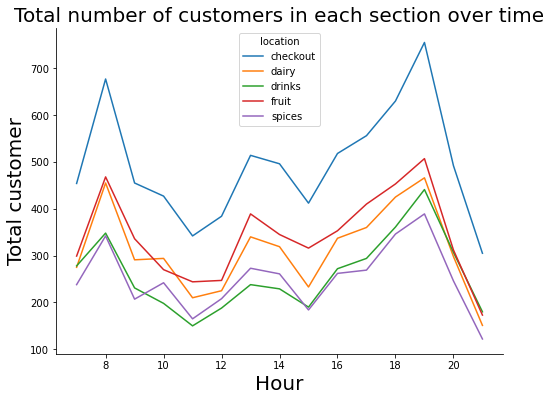

In [85]:
import seaborn as sns
import matplotlib.pyplot as plt 
#from matplotlib.pyplot import figure

fig, ax=plt.subplots(figsize=(8, 6))

# fig = plt.figure(figsize=(8, 6))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.xlabel('Hour', fontsize=20)
plt.ylabel('Total customer', fontsize=20)



#figure(figsize=(12, 10), dpi=80)
plt.title('Total number of customers in each section over time',fontsize=20)

sns.lineplot(x='hour',y='customer_id',hue='location',data=df_g_l_t)
#plt.axis('off')
plt.show()

###  Task 3 .Display the number of customers at checkout over time

In [105]:
#count how many customers in each secton during time
df_g_l_h=df.groupby(['location','hour'])['customer_id'].count()



In [106]:
# get the number for checkout section
checkout=df_g_l_h['checkout']

In [120]:
#savet this value in a new dataframe checkout
checkout=pd.DataFrame(checkout)

In [141]:
# rename the column name as 'total_customer_checkout'
checkout = checkout.rename(columns={'total_customer':'total_customer_checkout'})


In [140]:
checkout

,total_customer_checkout
hour,
7,454
8,677
9,455
10,427
11,342
12,384
13,514
14,496
15,412


Text(0.5, 1.0, 'Total number of customers in Checkout section over time')

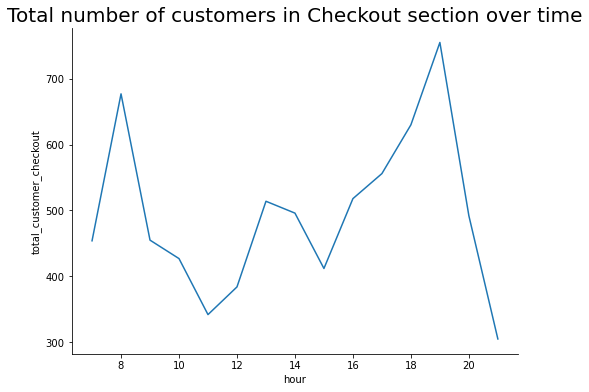

In [142]:
#plot the picture
fig, ax=plt.subplots(figsize=(8, 6))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
sns.lineplot(x='hour',y='total_customer_checkout', data=checkout)
plt.title('Total number of customers in Checkout section over time',fontsize=20)


### Task 4.Calculate the time each customer spent in the market

In [143]:
# define the equation to calculte the time each customer spent in the market
def get_customer_time(df):
   # df.sort_values('timestamp', inplace=True)
    df['time_spent'] = df.index.max() - df.index.min()
    return df

In [178]:
for key, value in df.groupby(['customer_id']):
    print (key)
    print(value)

21
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:03:00     dairy          21    2     7 0 days 00:02:00       27
2019-09-02 07:05:00  checkout          21    2     7 0 days 00:02:00       27
210
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:06:00     fruit         210    2     7 0 days 00:02:00       27
2019-09-02 07:08:00  checkout         210    2     7 0 days 00:02:00       27
2100
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:56:00    drinks        2100    2     7 0 days 00:07:00       27
2019-09-02 08:03:00  checkout        2100    2     8 0 days 00:07:00       28
21000
                     location customer_id  day

2019-09-02 18:04:00  checkout       21031    2    18 0 days 00:04:00      218
21032
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:00:00    drinks       21032    2    18 0 days 00:04:00      218
2019-09-02 18:01:00     dairy       21032    2    18 0 days 00:04:00      218
2019-09-02 18:02:00    drinks       21032    2    18 0 days 00:04:00      218
2019-09-02 18:04:00  checkout       21032    2    18 0 days 00:04:00      218
21033
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:00:00     fruit       21033    2    18 0 days 00:20:00      218
2019-09-02 18:03:00     dairy       21033    2    18 0 days 00:20:00      218
2019-09-02 18:11:00     fruit       21033    2    18 0 days 00:20:00      218
2019-09-02 18:15:00    spices       21033    2    18

2019-09-02 08:07:00  checkout        2108    2     8 0 days 00:04:00       28
21080
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:20:00    spices       21080    2    18 0 days 00:12:00      218
2019-09-02 18:22:00    drinks       21080    2    18 0 days 00:12:00      218
2019-09-02 18:23:00     fruit       21080    2    18 0 days 00:12:00      218
2019-09-02 18:31:00    drinks       21080    2    18 0 days 00:12:00      218
2019-09-02 18:32:00  checkout       21080    2    18 0 days 00:12:00      218
21081
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:20:00    drinks       21081    2    18 0 days 00:17:00      218
2019-09-02 18:21:00     fruit       21081    2    18 0 days 00:17:00      218
2019-09-02 18:24:00     dairy       21081    2    18

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:39:00    drinks       21119    2    18 0 days 00:03:00      218
2019-09-02 18:42:00  checkout       21119    2    18 0 days 00:03:00      218
2112
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:06:00     fruit        2112    2     8 0 days 00:07:00       28
2019-09-02 08:07:00     dairy        2112    2     8 0 days 00:07:00       28
2019-09-02 08:13:00  checkout        2112    2     8 0 days 00:07:00       28
21120
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:41:00    spices       21120    2    18 0 days 00:03:00      218
2019-09-02 18:42:00    drinks       21120    2    18 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:01:00     fruit       21171    2    19 0 days 00:03:00      219
2019-09-02 19:04:00  checkout       21171    2    19 0 days 00:03:00      219
21172
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:01:00    spices       21172    2    19 0 days 00:08:00      219
2019-09-02 19:06:00     dairy       21172    2    19 0 days 00:08:00      219
2019-09-02 19:09:00  checkout       21172    2    19 0 days 00:08:00      219
21173
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:01:00    spices       21173    2    19 0 days 00:01:00      219
2019-09-02 19:02:00  checkout       21173    2    19

2019-09-02 19:26:00  checkout       21214    2    19 0 days 00:03:00      219
21215
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:23:00    drinks       21215    2    19 0 days 00:01:00      219
2019-09-02 19:24:00  checkout       21215    2    19 0 days 00:01:00      219
21216
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:23:00     dairy       21216    2    19 0 days 00:20:00      219
2019-09-02 19:26:00    drinks       21216    2    19 0 days 00:20:00      219
2019-09-02 19:34:00    spices       21216    2    19 0 days 00:20:00      219
2019-09-02 19:35:00     fruit       21216    2    19 0 days 00:20:00      219
2019-09-02 19:36:00     dairy       21216    2    19 0 days 00:20:00      219
2019-09-02 19:43:00  checkout       21216    2    19

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:14:00     fruit        2126    2     8 0 days 00:07:00       28
2019-09-02 08:21:00  checkout        2126    2     8 0 days 00:07:00       28
21260
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:50:00    spices       21260    2    19 0 days 00:04:00      219
2019-09-02 19:54:00  checkout       21260    2    19 0 days 00:04:00      219
21261
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:50:00     fruit       21261    2    19 0 days 00:05:00      219
2019-09-02 19:52:00     dairy       21261    2    19 0 days 00:05:00      219
2019-09-02 19:55:00  checkout       21261    2    19

2019-09-02 20:13:00  checkout       21292    2    20 0 days 00:09:00      220
21293
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:05:00     dairy       21293    2    20 0 days 00:01:00      220
2019-09-02 20:06:00  checkout       21293    2    20 0 days 00:01:00      220
21294
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:05:00    drinks       21294    2    20 0 days 00:04:00      220
2019-09-02 20:07:00    spices       21294    2    20 0 days 00:04:00      220
2019-09-02 20:09:00  checkout       21294    2    20 0 days 00:04:00      220
21295
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:06:00    drinks       21295    2

2019-09-02 20:30:00  checkout       21328    2    20 0 days 00:01:00      220
21329
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:29:00    drinks       21329    2    20 0 days 00:04:00      220
2019-09-02 20:31:00     dairy       21329    2    20 0 days 00:04:00      220
2019-09-02 20:32:00    drinks       21329    2    20 0 days 00:04:00      220
2019-09-02 20:33:00  checkout       21329    2    20 0 days 00:04:00      220
2133
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:22:00     dairy        2133    2     8 0 days 00:25:00       28
2019-09-02 08:25:00    drinks        2133    2     8 0 days 00:25:00       28
2019-09-02 08:33:00    spices        2133    2     8 0 days 00:25:00       28
2019-09-02 08:36:00     dairy        2133    2     8 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:47:00     dairy       21375    2    20 0 days 00:02:00      220
2019-09-02 20:49:00  checkout       21375    2    20 0 days 00:02:00      220
21376
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:51:00    drinks       21376    2    20 0 days 00:04:00      220
2019-09-02 20:55:00  checkout       21376    2    20 0 days 00:04:00      220
21377
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:51:00    drinks       21377    2    20 0 days 00:02:00      220
2019-09-02 20:53:00  checkout       21377    2    20 0 days 00:02:00      220
21378
                     location customer_id  day

2019-09-02 21:32:00  checkout       21421    2    21 0 days 00:06:00      221
21422
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 21:26:00     dairy       21422    2    21 0 days 00:04:00      221
2019-09-02 21:27:00    drinks       21422    2    21 0 days 00:04:00      221
2019-09-02 21:30:00  checkout       21422    2    21 0 days 00:04:00      221
21423
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 21:26:00     dairy       21423    2    21 0 days 00:03:00      221
2019-09-02 21:27:00    spices       21423    2    21 0 days 00:03:00      221
2019-09-02 21:28:00     dairy       21423    2    21 0 days 00:03:00      221
2019-09-02 21:29:00  checkout       21423    2    21 0 days 00:03:00      221
21424
                     location customer_id  day

2019-09-02 08:30:00  checkout        2148    2     8 0 days 00:02:00       28
2149
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:28:00    spices        2149    2     8 0 days 00:04:00       28
2019-09-02 08:29:00     fruit        2149    2     8 0 days 00:04:00       28
2019-09-02 08:32:00  checkout        2149    2     8 0 days 00:04:00       28
215
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:07:00    spices         215    2     7 0 days 00:05:00       27
2019-09-02 07:08:00     fruit         215    2     7 0 days 00:05:00       27
2019-09-02 07:12:00  checkout         215    2     7 0 days 00:05:00       27
2150
                     location customer_id  day  hour      time_spent day_hour
timestamp                                         

2019-09-02 08:52:00  checkout        2195    2     8 0 days 00:04:00       28
2196
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:50:00     dairy        2196    2     8 0 days 00:07:00       28
2019-09-02 08:51:00    spices        2196    2     8 0 days 00:07:00       28
2019-09-02 08:53:00     fruit        2196    2     8 0 days 00:07:00       28
2019-09-02 08:57:00  checkout        2196    2     8 0 days 00:07:00       28
2197
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:51:00     fruit        2197    2     8 0 days 00:05:00       28
2019-09-02 08:55:00    spices        2197    2     8 0 days 00:05:00       28
2019-09-02 08:56:00  checkout        2197    2     8 0 days 00:05:00       28
2198
                     location customer_id  day  h

2019-09-02 07:15:00  checkout         223    2     7 0 days 00:01:00       27
2230
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:13:00     fruit        2230    2     9 0 days 00:07:00       29
2019-09-02 09:15:00     dairy        2230    2     9 0 days 00:07:00       29
2019-09-02 09:16:00    drinks        2230    2     9 0 days 00:07:00       29
2019-09-02 09:20:00  checkout        2230    2     9 0 days 00:07:00       29
2231
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:14:00     fruit        2231    2     9 0 days 00:10:00       29
2019-09-02 09:21:00     dairy        2231    2     9 0 days 00:10:00       29
2019-09-02 09:22:00    drinks        2231    2     9 0 days 00:10:00       29
2019-09-02 09:24:00  checkout        2231    2     9 0

2019-09-02 09:44:00  checkout        2263    2     9 0 days 00:06:00       29
2264
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:38:00     dairy        2264    2     9 0 days 00:06:00       29
2019-09-02 09:39:00    drinks        2264    2     9 0 days 00:06:00       29
2019-09-02 09:42:00     fruit        2264    2     9 0 days 00:06:00       29
2019-09-02 09:43:00     dairy        2264    2     9 0 days 00:06:00       29
2019-09-02 09:44:00  checkout        2264    2     9 0 days 00:06:00       29
2265
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:38:00     fruit        2265    2     9 0 days 00:01:00       29
2019-09-02 09:39:00  checkout        2265    2     9 0 days 00:01:00       29
2266
                     location customer_id  day  h

2019-09-02 10:08:00  checkout        2306    2    10 0 days 00:06:00      210
2307
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:05:00     fruit        2307    2    10 0 days 00:02:00      210
2019-09-02 10:07:00  checkout        2307    2    10 0 days 00:02:00      210
2308
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:07:00     fruit        2308    2    10 0 days 00:01:00      210
2019-09-02 10:08:00  checkout        2308    2    10 0 days 00:01:00      210
2309
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:07:00    spices        2309    2    10 0 days 00:01:00      210
2019-09-02 10:08:00  checkout        2309    2   

2019-09-02 10:48:00  checkout        2346    2    10 0 days 00:12:00      210
2347
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:36:00     dairy        2347    2    10 0 days 00:01:00      210
2019-09-02 10:37:00  checkout        2347    2    10 0 days 00:01:00      210
2348
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:36:00    spices        2348    2    10 0 days 00:07:00      210
2019-09-02 10:37:00    drinks        2348    2    10 0 days 00:07:00      210
2019-09-02 10:40:00    spices        2348    2    10 0 days 00:07:00      210
2019-09-02 10:43:00  checkout        2348    2    10 0 days 00:07:00      210
2349
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

2019-09-02 11:10:00  checkout        2389    2    11 0 days 00:02:00      211
239
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:26:00     dairy         239    2     7 0 days 00:01:00       27
2019-09-02 07:27:00  checkout         239    2     7 0 days 00:01:00       27
2390
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 11:08:00    spices        2390    2    11 0 days 00:17:00      211
2019-09-02 11:10:00    drinks        2390    2    11 0 days 00:17:00      211
2019-09-02 11:11:00     fruit        2390    2    11 0 days 00:17:00      211
2019-09-02 11:13:00    spices        2390    2    11 0 days 00:17:00      211
2019-09-02 11:14:00     dairy        2390    2    11 0 days 00:17:00      211
2019-09-02 11:22:00    spices        2390    2    11 0 

2019-09-02 11:52:00  checkout        2427    2    11 0 days 00:01:00      211
2428
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 11:51:00     dairy        2428    2    11 0 days 00:03:00      211
2019-09-02 11:54:00  checkout        2428    2    11 0 days 00:03:00      211
2429
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 11:52:00    drinks        2429    2    11 0 days 00:03:00      211
2019-09-02 11:55:00  checkout        2429    2    11 0 days 00:03:00      211
243
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:26:00     fruit         243    2     7 0 days 00:17:00       27
2019-09-02 07:28:00     dairy         243    2    

2019-09-02 12:40:00  checkout        2490    2    12 0 days 00:02:00      212
2491
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:39:00     dairy        2491    2    12 0 days 00:19:00      212
2019-09-02 12:45:00    spices        2491    2    12 0 days 00:19:00      212
2019-09-02 12:46:00     dairy        2491    2    12 0 days 00:19:00      212
2019-09-02 12:55:00     fruit        2491    2    12 0 days 00:19:00      212
2019-09-02 12:58:00  checkout        2491    2    12 0 days 00:19:00      212
2492
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:42:00     fruit        2492    2    12 0 days 00:25:00      212
2019-09-02 12:45:00     dairy        2492    2    12 0 days 00:25:00      212
2019-09-02 12:54:00    drinks        2492    2    12 0

2019-09-02 13:28:00  checkout        2530    2    13 0 days 00:21:00      213
2531
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:08:00    spices        2531    2    13 0 days 00:19:00      213
2019-09-02 13:10:00     fruit        2531    2    13 0 days 00:19:00      213
2019-09-02 13:15:00     dairy        2531    2    13 0 days 00:19:00      213
2019-09-02 13:24:00     fruit        2531    2    13 0 days 00:19:00      213
2019-09-02 13:27:00  checkout        2531    2    13 0 days 00:19:00      213
2532
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:10:00     dairy        2532    2    13 0 days 00:05:00      213
2019-09-02 13:15:00  checkout        2532    2    13 0 days 00:05:00      213
2533
                     location customer_id  day  h

2019-09-02 13:34:00  checkout        2565    2    13 0 days 00:15:00      213
2566
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:25:00     dairy        2566    2    13 0 days 00:01:00      213
2019-09-02 13:26:00  checkout        2566    2    13 0 days 00:01:00      213
2567
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:25:00     fruit        2567    2    13 0 days 00:08:00      213
2019-09-02 13:26:00    spices        2567    2    13 0 days 00:08:00      213
2019-09-02 13:27:00     dairy        2567    2    13 0 days 00:08:00      213
2019-09-02 13:33:00  checkout        2567    2    13 0 days 00:08:00      213
2568
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:44:00     fruit        2602    2    13 0 days 00:12:00      213
2019-09-02 13:46:00    spices        2602    2    13 0 days 00:12:00      213
2019-09-02 13:50:00    drinks        2602    2    13 0 days 00:12:00      213
2019-09-02 13:53:00    spices        2602    2    13 0 days 00:12:00      213
2019-09-02 13:56:00  checkout        2602    2    13 0 days 00:12:00      213
2603
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:44:00     dairy        2603    2    13 0 days 00:03:00      213
2019-09-02 13:47:00  checkout        2603    2    13 0 days 00:03:00      213
2604
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-02 14:09:00  checkout        2644    2    14 0 days 00:04:00      214
2645
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:08:00     fruit        2645    2    14 0 days 00:10:00      214
2019-09-02 14:09:00    drinks        2645    2    14 0 days 00:10:00      214
2019-09-02 14:16:00    spices        2645    2    14 0 days 00:10:00      214
2019-09-02 14:18:00  checkout        2645    2    14 0 days 00:10:00      214
2646
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:09:00    spices        2646    2    14 0 days 00:06:00      214
2019-09-02 14:11:00     fruit        2646    2    14 0 days 00:06:00      214
2019-09-02 14:13:00    drinks        2646    2    14 0 days 00:06:00      214
2019-09-02 14:15:00  checkout        2646    2    14 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:42:00    spices         268    2     7 0 days 00:10:00       27
2019-09-02 07:45:00    drinks         268    2     7 0 days 00:10:00       27
2019-09-02 07:48:00     fruit         268    2     7 0 days 00:10:00       27
2019-09-02 07:50:00    spices         268    2     7 0 days 00:10:00       27
2019-09-02 07:52:00  checkout         268    2     7 0 days 00:10:00       27
2680
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:24:00     fruit        2680    2    14 0 days 00:06:00      214
2019-09-02 14:27:00    spices        2680    2    14 0 days 00:06:00      214
2019-09-02 14:28:00     dairy        2680    2    14 0 days 00:06:00      214
2019-09-02 14:30:00  checkout        2680    2    14 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:56:00     fruit        2721    2    14 0 days 00:05:00      214
2019-09-02 14:58:00    spices        2721    2    14 0 days 00:05:00      214
2019-09-02 14:59:00    drinks        2721    2    14 0 days 00:05:00      214
2019-09-02 15:01:00  checkout        2721    2    15 0 days 00:05:00      215
2722
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:56:00     fruit        2722    2    14 0 days 00:04:00      214
2019-09-02 14:59:00    spices        2722    2    14 0 days 00:04:00      214
2019-09-02 15:00:00  checkout        2722    2    15 0 days 00:04:00      215
2723
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:18:00    spices        2763    2    15 0 days 00:13:00      215
2019-09-02 15:19:00     fruit        2763    2    15 0 days 00:13:00      215
2019-09-02 15:21:00     dairy        2763    2    15 0 days 00:13:00      215
2019-09-02 15:22:00     fruit        2763    2    15 0 days 00:13:00      215
2019-09-02 15:27:00    drinks        2763    2    15 0 days 00:13:00      215
2019-09-02 15:31:00  checkout        2763    2    15 0 days 00:13:00      215
2764
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:18:00     fruit        2764    2    15 0 days 00:04:00      215
2019-09-02 15:22:00  checkout        2764    2    15 0 days 00:04:00      215
2765
                     location customer_id  day  hour  

2019-09-02 15:46:00  checkout        2804    2    15 0 days 00:05:00      215
2805
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:45:00     fruit        2805    2    15 0 days 00:05:00      215
2019-09-02 15:50:00  checkout        2805    2    15 0 days 00:05:00      215
2806
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:45:00     fruit        2806    2    15 0 days 00:15:00      215
2019-09-02 15:46:00     dairy        2806    2    15 0 days 00:15:00      215
2019-09-02 16:00:00  checkout        2806    2    16 0 days 00:15:00      216
2807
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:45:00     dairy        2807    2   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:29:00     fruit        2845    2    16 0 days 00:17:00      216
2019-09-02 16:31:00     dairy        2845    2    16 0 days 00:17:00      216
2019-09-02 16:36:00     fruit        2845    2    16 0 days 00:17:00      216
2019-09-02 16:38:00     dairy        2845    2    16 0 days 00:17:00      216
2019-09-02 16:41:00    spices        2845    2    16 0 days 00:17:00      216
2019-09-02 16:42:00    drinks        2845    2    16 0 days 00:17:00      216
2019-09-02 16:43:00    spices        2845    2    16 0 days 00:17:00      216
2019-09-02 16:44:00     dairy        2845    2    16 0 days 00:17:00      216
2019-09-02 16:46:00  checkout        2845    2    16 0 days 00:17:00      216
2846
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                  

2019-09-02 16:55:00  checkout        2893    2    16 0 days 00:01:00      216
2894
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:54:00    drinks        2894    2    16 0 days 00:01:00      216
2019-09-02 16:55:00  checkout        2894    2    16 0 days 00:01:00      216
2895
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:54:00     fruit        2895    2    16 0 days 00:02:00      216
2019-09-02 16:56:00  checkout        2895    2    16 0 days 00:02:00      216
2896
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:54:00    spices        2896    2    16 0 days 00:01:00      216
2019-09-02 16:55:00  checkout        2896    2   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:13:00    drinks        2936    2    17 0 days 00:02:00      217
2019-09-02 17:15:00  checkout        2936    2    17 0 days 00:02:00      217
2937
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:13:00    drinks        2937    2    17 0 days 00:03:00      217
2019-09-02 17:14:00     fruit        2937    2    17 0 days 00:03:00      217
2019-09-02 17:15:00    drinks        2937    2    17 0 days 00:03:00      217
2019-09-02 17:16:00  checkout        2937    2    17 0 days 00:03:00      217
2938
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:13:00     dairy        2938    2    17 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:56:00     dairy         298    2     7 0 days 00:04:00       27
2019-09-02 07:57:00    drinks         298    2     7 0 days 00:04:00       27
2019-09-02 07:58:00     fruit         298    2     7 0 days 00:04:00       27
2019-09-02 07:59:00    drinks         298    2     7 0 days 00:04:00       27
2019-09-02 08:00:00  checkout         298    2     8 0 days 00:04:00       28
2980
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:32:00     fruit        2980    2    17 0 days 00:03:00      217
2019-09-02 17:35:00  checkout        2980    2    17 0 days 00:03:00      217
2981
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:01:00    drinks       31015    3    18 0 days 00:02:00      318
2019-09-03 18:03:00  checkout       31015    3    18 0 days 00:02:00      318
31016
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:01:00     dairy       31016    3    18 0 days 00:13:00      318
2019-09-03 18:08:00    spices       31016    3    18 0 days 00:13:00      318
2019-09-03 18:09:00    drinks       31016    3    18 0 days 00:13:00      318
2019-09-03 18:11:00     fruit       31016    3    18 0 days 00:13:00      318
2019-09-03 18:14:00  checkout       31016    3    18 0 days 00:13:00      318
31017
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

2019-09-03 18:24:00  checkout       31058    3    18 0 days 00:02:00      318
31059
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:22:00     dairy       31059    3    18 0 days 00:14:00      318
2019-09-03 18:24:00    spices       31059    3    18 0 days 00:14:00      318
2019-09-03 18:26:00     dairy       31059    3    18 0 days 00:14:00      318
2019-09-03 18:28:00    spices       31059    3    18 0 days 00:14:00      318
2019-09-03 18:30:00     fruit       31059    3    18 0 days 00:14:00      318
2019-09-03 18:31:00     dairy       31059    3    18 0 days 00:14:00      318
2019-09-03 18:35:00    spices       31059    3    18 0 days 00:14:00      318
2019-09-03 18:36:00  checkout       31059    3    18 0 days 00:14:00      318
3106
                     location customer_id  day  hour      time_spent day_hour
timestamp                                            

2019-09-03 18:41:00  checkout       31096    3    18 0 days 00:03:00      318
31097
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:38:00     fruit       31097    3    18 0 days 00:02:00      318
2019-09-03 18:39:00    drinks       31097    3    18 0 days 00:02:00      318
2019-09-03 18:40:00  checkout       31097    3    18 0 days 00:02:00      318
31098
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:39:00     fruit       31098    3    18 0 days 00:05:00      318
2019-09-03 18:40:00    spices       31098    3    18 0 days 00:05:00      318
2019-09-03 18:41:00     dairy       31098    3    18 0 days 00:05:00      318
2019-09-03 18:42:00    spices       31098    3    18 0 days 00:05:00      318
2019-09-03 18:43:00     dairy       31098    3    18

2019-09-03 19:03:00  checkout       31135    3    19 0 days 00:08:00      319
31136
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:55:00    spices       31136    3    18 0 days 00:02:00      318
2019-09-03 18:56:00     dairy       31136    3    18 0 days 00:02:00      318
2019-09-03 18:57:00  checkout       31136    3    18 0 days 00:02:00      318
31137
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:57:00     dairy       31137    3    18 0 days 00:26:00      318
2019-09-03 19:11:00    drinks       31137    3    19 0 days 00:26:00      319
2019-09-03 19:12:00     fruit       31137    3    19 0 days 00:26:00      319
2019-09-03 19:14:00     dairy       31137    3    19 0 days 00:26:00      319
2019-09-03 19:19:00    spices       31137    3    19

2019-09-03 19:21:00  checkout       31170    3    19 0 days 00:11:00      319
31171
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:10:00     fruit       31171    3    19 0 days 00:01:00      319
2019-09-03 19:11:00  checkout       31171    3    19 0 days 00:01:00      319
31172
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:13:00     fruit       31172    3    19 0 days 00:02:00      319
2019-09-03 19:14:00    drinks       31172    3    19 0 days 00:02:00      319
2019-09-03 19:15:00  checkout       31172    3    19 0 days 00:02:00      319
31173
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:14:00     dairy       31173    3

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:27:00     fruit       31207    3    19 0 days 00:02:00      319
2019-09-03 19:28:00    spices       31207    3    19 0 days 00:02:00      319
2019-09-03 19:29:00  checkout       31207    3    19 0 days 00:02:00      319
31208
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:29:00     dairy       31208    3    19 0 days 00:02:00      319
2019-09-03 19:31:00  checkout       31208    3    19 0 days 00:02:00      319
31209
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:29:00    drinks       31209    3    19 0 days 00:03:00      319
2019-09-03 19:31:00     dairy       31209    3    19

2019-09-03 19:51:00  checkout       31253    3    19 0 days 00:01:00      319
31254
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:50:00    drinks       31254    3    19 0 days 00:04:00      319
2019-09-03 19:54:00  checkout       31254    3    19 0 days 00:04:00      319
31255
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:51:00     dairy       31255    3    19 0 days 00:11:00      319
2019-09-03 19:56:00    spices       31255    3    19 0 days 00:11:00      319
2019-09-03 19:57:00     dairy       31255    3    19 0 days 00:11:00      319
2019-09-03 19:59:00    spices       31255    3    19 0 days 00:11:00      319
2019-09-03 20:00:00     fruit       31255    3    20 0 days 00:11:00      320
2019-09-03 20:02:00  checkout       31255    3    20

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:09:00     dairy       31296    3    20 0 days 00:07:00      320
2019-09-03 20:10:00    spices       31296    3    20 0 days 00:07:00      320
2019-09-03 20:11:00     dairy       31296    3    20 0 days 00:07:00      320
2019-09-03 20:12:00    drinks       31296    3    20 0 days 00:07:00      320
2019-09-03 20:16:00  checkout       31296    3    20 0 days 00:07:00      320
31297
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:10:00     fruit       31297    3    20 0 days 00:01:00      320
2019-09-03 20:11:00  checkout       31297    3    20 0 days 00:01:00      320
31298
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:39:00     fruit       31344    3    20 0 days 00:03:00      320
2019-09-03 20:42:00  checkout       31344    3    20 0 days 00:03:00      320
31345
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:40:00    spices       31345    3    20 0 days 00:09:00      320
2019-09-03 20:41:00     dairy       31345    3    20 0 days 00:09:00      320
2019-09-03 20:48:00     fruit       31345    3    20 0 days 00:09:00      320
2019-09-03 20:49:00  checkout       31345    3    20 0 days 00:09:00      320
31346
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:41:00     fruit       31346    3    20

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 21:15:00     dairy       31384    3    21 0 days 00:17:00      321
2019-09-03 21:16:00     fruit       31384    3    21 0 days 00:17:00      321
2019-09-03 21:17:00    drinks       31384    3    21 0 days 00:17:00      321
2019-09-03 21:23:00     dairy       31384    3    21 0 days 00:17:00      321
2019-09-03 21:24:00    drinks       31384    3    21 0 days 00:17:00      321
2019-09-03 21:32:00  checkout       31384    3    21 0 days 00:17:00      321
31385
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 21:15:00     fruit       31385    3    21 0 days 00:01:00      321
2019-09-03 21:16:00  checkout       31385    3    21 0 days 00:01:00      321
31386
                     location customer_id  day  hour

2019-09-03 08:25:00  checkout        3160    3     8 0 days 00:01:00       38
3161
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:26:00    spices        3161    3     8 0 days 00:04:00       38
2019-09-03 08:28:00    drinks        3161    3     8 0 days 00:04:00       38
2019-09-03 08:30:00  checkout        3161    3     8 0 days 00:04:00       38
3162
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:26:00    drinks        3162    3     8 0 days 00:01:00       38
2019-09-03 08:27:00  checkout        3162    3     8 0 days 00:01:00       38
3163
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:26:00    spices        3163    3   

2019-09-03 07:14:00  checkout         320    3     7 0 days 00:01:00       37
3200
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:41:00     fruit        3200    3     8 0 days 00:19:00       38
2019-09-03 08:42:00    spices        3200    3     8 0 days 00:19:00       38
2019-09-03 08:44:00    drinks        3200    3     8 0 days 00:19:00       38
2019-09-03 08:48:00    spices        3200    3     8 0 days 00:19:00       38
2019-09-03 08:49:00    drinks        3200    3     8 0 days 00:19:00       38
2019-09-03 08:50:00    spices        3200    3     8 0 days 00:19:00       38
2019-09-03 08:52:00    drinks        3200    3     8 0 days 00:19:00       38
2019-09-03 08:54:00     fruit        3200    3     8 0 days 00:19:00       38
2019-09-03 08:58:00    spices        3200    3     8 0 days 00:19:00       38
2019-09-03 09:00:00  checkout        3200    3     9 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 09:14:00     dairy        3245    3     9 0 days 00:13:00       39
2019-09-03 09:15:00     fruit        3245    3     9 0 days 00:13:00       39
2019-09-03 09:17:00    drinks        3245    3     9 0 days 00:13:00       39
2019-09-03 09:18:00     fruit        3245    3     9 0 days 00:13:00       39
2019-09-03 09:19:00    drinks        3245    3     9 0 days 00:13:00       39
2019-09-03 09:23:00    spices        3245    3     9 0 days 00:13:00       39
2019-09-03 09:24:00     dairy        3245    3     9 0 days 00:13:00       39
2019-09-03 09:25:00    spices        3245    3     9 0 days 00:13:00       39
2019-09-03 09:26:00     fruit        3245    3     9 0 days 00:13:00       39
2019-09-03 09:27:00  checkout        3245    3     9 0 days 00:13:00       39
3246
                     location customer_id  day  hour      t

3283
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 09:40:00     fruit        3283    3     9 0 days 00:07:00       39
2019-09-03 09:41:00    spices        3283    3     9 0 days 00:07:00       39
2019-09-03 09:42:00     dairy        3283    3     9 0 days 00:07:00       39
2019-09-03 09:43:00     fruit        3283    3     9 0 days 00:07:00       39
2019-09-03 09:45:00     dairy        3283    3     9 0 days 00:07:00       39
2019-09-03 09:47:00  checkout        3283    3     9 0 days 00:07:00       39
3284
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 09:40:00     fruit        3284    3     9 0 days 00:01:00       39
2019-09-03 09:41:00  checkout        3284    3     9 0 days 00:01:00       39
3285
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 10:16:00     dairy        3324    3    10 0 days 00:03:00      310
2019-09-03 10:19:00  checkout        3324    3    10 0 days 00:03:00      310
3325
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 10:16:00     fruit        3325    3    10 0 days 00:17:00      310
2019-09-03 10:17:00    spices        3325    3    10 0 days 00:17:00      310
2019-09-03 10:20:00     dairy        3325    3    10 0 days 00:17:00      310
2019-09-03 10:22:00    spices        3325    3    10 0 days 00:17:00      310
2019-09-03 10:23:00     dairy        3325    3    10 0 days 00:17:00      310
2019-09-03 10:29:00    spices        3325    3    10 0 days 00:17:00      310
2019-09-03 10:32:00    drinks        3325    3    10 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 10:42:00     fruit        3368    3    10 0 days 00:01:00      310
2019-09-03 10:43:00  checkout        3368    3    10 0 days 00:01:00      310
3369
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 10:42:00     fruit        3369    3    10 0 days 00:02:00      310
2019-09-03 10:44:00  checkout        3369    3    10 0 days 00:02:00      310
337
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:22:00    drinks         337    3     7 0 days 00:08:00       37
2019-09-03 07:25:00     fruit         337    3     7 0 days 00:08:00       37
2019-09-03 07:28:00    drinks         337    3     7 0 

2019-09-03 11:26:00  checkout        3405    3    11 0 days 00:02:00      311
3406
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 11:24:00     dairy        3406    3    11 0 days 00:06:00      311
2019-09-03 11:26:00     fruit        3406    3    11 0 days 00:06:00      311
2019-09-03 11:30:00  checkout        3406    3    11 0 days 00:06:00      311
3407
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 11:27:00    spices        3407    3    11 0 days 00:02:00      311
2019-09-03 11:29:00  checkout        3407    3    11 0 days 00:02:00      311
3408
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 11:27:00     dairy        3408    3   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:12:00    drinks        3447    3    12 0 days 00:01:00      312
2019-09-03 12:13:00  checkout        3447    3    12 0 days 00:01:00      312
3448
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:13:00     dairy        3448    3    12 0 days 00:04:00      312
2019-09-03 12:17:00  checkout        3448    3    12 0 days 00:04:00      312
3449
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:13:00    drinks        3449    3    12 0 days 00:06:00      312
2019-09-03 12:14:00    spices        3449    3    12 0 days 00:06:00      312
2019-09-03 12:15:00    drinks        3449    3    12 0

2019-09-03 13:02:00  checkout        3493    3    13 0 days 00:01:00      313
3494
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:01:00     dairy        3494    3    13 0 days 00:07:00      313
2019-09-03 13:08:00  checkout        3494    3    13 0 days 00:07:00      313
3495
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:02:00     fruit        3495    3    13 0 days 00:05:00      313
2019-09-03 13:04:00    drinks        3495    3    13 0 days 00:05:00      313
2019-09-03 13:07:00  checkout        3495    3    13 0 days 00:05:00      313
3496
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:02:00     fruit        3496    3   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:19:00    spices        3532    3    13 0 days 00:01:00      313
2019-09-03 13:20:00  checkout        3532    3    13 0 days 00:01:00      313
3533
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:20:00     fruit        3533    3    13 0 days 00:02:00      313
2019-09-03 13:22:00  checkout        3533    3    13 0 days 00:02:00      313
3534
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:20:00    spices        3534    3    13 0 days 00:07:00      313
2019-09-03 13:21:00     fruit        3534    3    13 0 days 00:07:00      313
2019-09-03 13:23:00     dairy        3534    3    13 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:48:00     dairy        3579    3    13 0 days 00:09:00      313
2019-09-03 13:54:00     fruit        3579    3    13 0 days 00:09:00      313
2019-09-03 13:57:00  checkout        3579    3    13 0 days 00:09:00      313
358
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:32:00     fruit         358    3     7 0 days 00:03:00       37
2019-09-03 07:35:00  checkout         358    3     7 0 days 00:03:00       37
3580
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:48:00     fruit        3580    3    13 0 days 00:09:00      313
2019-09-03 13:53:00     dairy        3580    3    13 0 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:16:00    spices        3620    3    14 0 days 00:04:00      314
2019-09-03 14:17:00     dairy        3620    3    14 0 days 00:04:00      314
2019-09-03 14:20:00  checkout        3620    3    14 0 days 00:04:00      314
3621
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:16:00     fruit        3621    3    14 0 days 00:03:00      314
2019-09-03 14:19:00  checkout        3621    3    14 0 days 00:03:00      314
3622
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:16:00     fruit        3622    3    14 0 days 00:03:00      314
2019-09-03 14:19:00  checkout        3622    3    14 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:38:00    spices        3664    3    14 0 days 00:01:00      314
2019-09-03 14:39:00  checkout        3664    3    14 0 days 00:01:00      314
3665
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:38:00    drinks        3665    3    14 0 days 00:01:00      314
2019-09-03 14:39:00  checkout        3665    3    14 0 days 00:01:00      314
3666
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:40:00     fruit        3666    3    14 0 days 00:29:00      314
2019-09-03 14:48:00    drinks        3666    3    14 0 days 00:29:00      314
2019-09-03 14:51:00     fruit        3666    3    14 0

2019-09-03 15:12:00  checkout        3710    3    15 0 days 00:06:00      315
3711
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:07:00     dairy        3711    3    15 0 days 00:09:00      315
2019-09-03 15:16:00  checkout        3711    3    15 0 days 00:09:00      315
3712
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:07:00     fruit        3712    3    15 0 days 00:15:00      315
2019-09-03 15:10:00    drinks        3712    3    15 0 days 00:15:00      315
2019-09-03 15:12:00     fruit        3712    3    15 0 days 00:15:00      315
2019-09-03 15:14:00     dairy        3712    3    15 0 days 00:15:00      315
2019-09-03 15:20:00     fruit        3712    3    15 0 days 00:15:00      315
2019-09-03 15:22:00  checkout        3712    3    15 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:46:00    drinks        3753    3    15 0 days 00:02:00      315
2019-09-03 15:48:00  checkout        3753    3    15 0 days 00:02:00      315
3754
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:46:00     dairy        3754    3    15 0 days 00:04:00      315
2019-09-03 15:48:00     fruit        3754    3    15 0 days 00:04:00      315
2019-09-03 15:50:00  checkout        3754    3    15 0 days 00:04:00      315
3755
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:46:00     dairy        3755    3    15 0 days 00:01:00      315
2019-09-03 15:47:00  checkout        3755    3    15 0

2019-09-03 16:12:00  checkout        3797    3    16 0 days 00:01:00      316
3798
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:11:00    spices        3798    3    16 0 days 00:03:00      316
2019-09-03 16:13:00     dairy        3798    3    16 0 days 00:03:00      316
2019-09-03 16:14:00  checkout        3798    3    16 0 days 00:03:00      316
3799
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:12:00     dairy        3799    3    16 0 days 00:07:00      316
2019-09-03 16:14:00    drinks        3799    3    16 0 days 00:07:00      316
2019-09-03 16:19:00  checkout        3799    3    16 0 days 00:07:00      316
38
                     location customer_id  day  hour      time_spent day_hour
timestamp                                          

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:31:00     fruit        3841    3    16 0 days 00:03:00      316
2019-09-03 16:34:00  checkout        3841    3    16 0 days 00:03:00      316
3842
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:32:00     fruit        3842    3    16 0 days 00:15:00      316
2019-09-03 16:41:00    drinks        3842    3    16 0 days 00:15:00      316
2019-09-03 16:47:00  checkout        3842    3    16 0 days 00:15:00      316
3843
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:32:00     fruit        3843    3    16 0 days 00:02:00      316
2019-09-03 16:33:00    spices        3843    3    16 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:50:00    drinks         389    3     7 0 days 00:12:00       37
2019-09-03 07:53:00    spices         389    3     7 0 days 00:12:00       37
2019-09-03 07:54:00    drinks         389    3     7 0 days 00:12:00       37
2019-09-03 07:55:00    spices         389    3     7 0 days 00:12:00       37
2019-09-03 07:56:00    drinks         389    3     7 0 days 00:12:00       37
2019-09-03 07:57:00    spices         389    3     7 0 days 00:12:00       37
2019-09-03 07:58:00    drinks         389    3     7 0 days 00:12:00       37
2019-09-03 08:02:00  checkout         389    3     8 0 days 00:12:00       38
3890
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:52:00     fruit        3890    3    16 0 days

2019-09-03 17:18:00  checkout        3933    3    17 0 days 00:02:00      317
3934
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:16:00     fruit        3934    3    17 0 days 00:01:00      317
2019-09-03 17:17:00  checkout        3934    3    17 0 days 00:01:00      317
3935
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:17:00     fruit        3935    3    17 0 days 00:11:00      317
2019-09-03 17:23:00    spices        3935    3    17 0 days 00:11:00      317
2019-09-03 17:24:00     dairy        3935    3    17 0 days 00:11:00      317
2019-09-03 17:28:00  checkout        3935    3    17 0 days 00:11:00      317
3936
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

2019-09-03 17:52:00  checkout        3977    3    17 0 days 00:08:00      317
3978
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:44:00     fruit        3978    3    17 0 days 00:05:00      317
2019-09-03 17:49:00  checkout        3978    3    17 0 days 00:05:00      317
3979
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:45:00     dairy        3979    3    17 0 days 00:05:00      317
2019-09-03 17:50:00  checkout        3979    3    17 0 days 00:05:00      317
398
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:56:00    drinks         398    3     7 0 days 00:05:00       37
2019-09-03 07:57:00     fruit         398    3    

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:06:00     fruit       41023    4    17 0 days 00:15:00      417
2019-09-04 17:12:00     dairy       41023    4    17 0 days 00:15:00      417
2019-09-04 17:21:00  checkout       41023    4    17 0 days 00:15:00      417
41024
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:06:00     fruit       41024    4    17 0 days 00:12:00      417
2019-09-04 17:07:00     dairy       41024    4    17 0 days 00:12:00      417
2019-09-04 17:16:00     fruit       41024    4    17 0 days 00:12:00      417
2019-09-04 17:18:00  checkout       41024    4    17 0 days 00:12:00      417
41025
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:06:00     dairy        4107    4     8 0 days 00:01:00       48
2019-09-04 08:07:00  checkout        4107    4     8 0 days 00:01:00       48
41070
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:39:00     fruit       41070    4    17 0 days 00:03:00      417
2019-09-04 17:42:00  checkout       41070    4    17 0 days 00:03:00      417
41071
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:39:00    drinks       41071    4    17 0 days 00:04:00      417
2019-09-04 17:40:00     fruit       41071    4    17 0 days 00:04:00      417
2019-09-04 17:43:00  checkout       41071    4    17

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:12:00    spices       41118    4    18 0 days 00:03:00      418
2019-09-04 18:13:00    drinks       41118    4    18 0 days 00:03:00      418
2019-09-04 18:15:00  checkout       41118    4    18 0 days 00:03:00      418
41119
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:13:00     fruit       41119    4    18 0 days 00:08:00      418
2019-09-04 18:14:00     dairy       41119    4    18 0 days 00:08:00      418
2019-09-04 18:19:00    spices       41119    4    18 0 days 00:08:00      418
2019-09-04 18:21:00  checkout       41119    4    18 0 days 00:08:00      418
4112
                     location customer_id  day  hour      time_spent day_hour
timestamp                                            

2019-09-04 18:41:00  checkout       41164    4    18 0 days 00:01:00      418
41165
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:40:00     dairy       41165    4    18 0 days 00:17:00      418
2019-09-04 18:42:00    spices       41165    4    18 0 days 00:17:00      418
2019-09-04 18:43:00     dairy       41165    4    18 0 days 00:17:00      418
2019-09-04 18:54:00     fruit       41165    4    18 0 days 00:17:00      418
2019-09-04 18:57:00  checkout       41165    4    18 0 days 00:17:00      418
41166
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:40:00     dairy       41166    4    18 0 days 00:03:00      418
2019-09-04 18:41:00     fruit       41166    4    18 0 days 00:03:00      418
2019-09-04 18:43:00  checkout       41166    4    18

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:58:00     fruit       41201    4    18 0 days 00:06:00      418
2019-09-04 18:59:00     dairy       41201    4    18 0 days 00:06:00      418
2019-09-04 19:00:00     fruit       41201    4    19 0 days 00:06:00      419
2019-09-04 19:02:00    spices       41201    4    19 0 days 00:06:00      419
2019-09-04 19:04:00  checkout       41201    4    19 0 days 00:06:00      419
41202
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:59:00     fruit       41202    4    18 0 days 00:05:00      418
2019-09-04 19:04:00  checkout       41202    4    19 0 days 00:05:00      419
41203
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

2019-09-04 19:12:00  checkout       41244    4    19 0 days 00:02:00      419
41245
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:10:00     fruit       41245    4    19 0 days 00:09:00      419
2019-09-04 19:14:00     dairy       41245    4    19 0 days 00:09:00      419
2019-09-04 19:19:00  checkout       41245    4    19 0 days 00:09:00      419
41246
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:10:00     fruit       41246    4    19 0 days 00:09:00      419
2019-09-04 19:11:00    drinks       41246    4    19 0 days 00:09:00      419
2019-09-04 19:12:00     fruit       41246    4    19 0 days 00:09:00      419
2019-09-04 19:16:00    drinks       41246    4    19 0 days 00:09:00      419
2019-09-04 19:19:00  checkout       41246    4    19

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:25:00     dairy       41293    4    19 0 days 00:01:00      419
2019-09-04 19:26:00  checkout       41293    4    19 0 days 00:01:00      419
41294
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:25:00    spices       41294    4    19 0 days 00:01:00      419
2019-09-04 19:26:00  checkout       41294    4    19 0 days 00:01:00      419
41295
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:25:00    spices       41295    4    19 0 days 00:02:00      419
2019-09-04 19:27:00  checkout       41295    4    19 0 days 00:02:00      419
41296
                     location customer_id  day

2019-09-04 19:57:00  checkout       41330    4    19 0 days 00:19:00      419
41331
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:38:00     fruit       41331    4    19 0 days 00:05:00      419
2019-09-04 19:39:00    drinks       41331    4    19 0 days 00:05:00      419
2019-09-04 19:43:00  checkout       41331    4    19 0 days 00:05:00      419
41332
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:38:00    spices       41332    4    19 0 days 00:25:00      419
2019-09-04 19:39:00     fruit       41332    4    19 0 days 00:25:00      419
2019-09-04 19:40:00     dairy       41332    4    19 0 days 00:25:00      419
2019-09-04 19:44:00     fruit       41332    4    19 0 days 00:25:00      419
2019-09-04 19:45:00     dairy       41332    4    19

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:53:00    drinks       41380    4    19 0 days 00:01:00      419
2019-09-04 19:54:00  checkout       41380    4    19 0 days 00:01:00      419
41381
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:53:00     dairy       41381    4    19 0 days 00:11:00      419
2019-09-04 20:01:00    drinks       41381    4    20 0 days 00:11:00      420
2019-09-04 20:04:00  checkout       41381    4    20 0 days 00:11:00      420
41382
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:53:00     fruit       41382    4    19 0 days 00:07:00      419
2019-09-04 19:56:00    drinks       41382    4    19

2019-09-04 20:19:00  checkout       41424    4    20 0 days 00:04:00      420
41425
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:19:00     fruit       41425    4    20 0 days 00:05:00      420
2019-09-04 20:22:00     dairy       41425    4    20 0 days 00:05:00      420
2019-09-04 20:23:00    drinks       41425    4    20 0 days 00:05:00      420
2019-09-04 20:24:00  checkout       41425    4    20 0 days 00:05:00      420
41426
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:19:00    drinks       41426    4    20 0 days 00:04:00      420
2019-09-04 20:23:00  checkout       41426    4    20 0 days 00:04:00      420
41427
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

2019-09-04 20:54:00  checkout       41466    4    20 0 days 00:01:00      420
41467
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:53:00    spices       41467    4    20 0 days 00:04:00      420
2019-09-04 20:56:00     dairy       41467    4    20 0 days 00:04:00      420
2019-09-04 20:57:00  checkout       41467    4    20 0 days 00:04:00      420
41468
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:54:00    drinks       41468    4    20 0 days 00:04:00      420
2019-09-04 20:55:00     dairy       41468    4    20 0 days 00:04:00      420
2019-09-04 20:56:00    drinks       41468    4    20 0 days 00:04:00      420
2019-09-04 20:58:00  checkout       41468    4    20 0 days 00:04:00      420
41469
                     location customer_id  day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 21:25:00    drinks       41504    4    21 0 days 00:09:00      421
2019-09-04 21:32:00     dairy       41504    4    21 0 days 00:09:00      421
2019-09-04 21:33:00    drinks       41504    4    21 0 days 00:09:00      421
2019-09-04 21:34:00  checkout       41504    4    21 0 days 00:09:00      421
41505
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 21:25:00    drinks       41505    4    21 0 days 00:02:00      421
2019-09-04 21:27:00  checkout       41505    4    21 0 days 00:02:00      421
41506
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 21:26:00    drinks       41506    4    21

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:29:00     fruit        4173    4     8 0 days 00:19:00       48
2019-09-04 08:32:00    spices        4173    4     8 0 days 00:19:00       48
2019-09-04 08:33:00     dairy        4173    4     8 0 days 00:19:00       48
2019-09-04 08:37:00    spices        4173    4     8 0 days 00:19:00       48
2019-09-04 08:38:00     dairy        4173    4     8 0 days 00:19:00       48
2019-09-04 08:48:00  checkout        4173    4     8 0 days 00:19:00       48
4174
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:29:00    spices        4174    4     8 0 days 00:02:00       48
2019-09-04 08:31:00  checkout        4174    4     8 0 days 00:02:00       48
4175
                     location customer_id  day  hour  

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:46:00     fruit        4220    4     8 0 days 00:12:00       48
2019-09-04 08:47:00     dairy        4220    4     8 0 days 00:12:00       48
2019-09-04 08:58:00  checkout        4220    4     8 0 days 00:12:00       48
4221
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:47:00    drinks        4221    4     8 0 days 00:06:00       48
2019-09-04 08:50:00     dairy        4221    4     8 0 days 00:06:00       48
2019-09-04 08:51:00    spices        4221    4     8 0 days 00:06:00       48
2019-09-04 08:53:00  checkout        4221    4     8 0 days 00:06:00       48
4222
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-04 07:16:00  checkout         426    4     7 0 days 00:02:00       47
4260
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:56:00    drinks        4260    4     8 0 days 00:05:00       48
2019-09-04 08:59:00     fruit        4260    4     8 0 days 00:05:00       48
2019-09-04 09:01:00  checkout        4260    4     9 0 days 00:05:00       49
4261
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:56:00    drinks        4261    4     8 0 days 00:04:00       48
2019-09-04 08:59:00    spices        4261    4     8 0 days 00:04:00       48
2019-09-04 09:00:00  checkout        4261    4     9 0 days 00:04:00       49
4262
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

2019-09-04 09:19:00  checkout        4292    4     9 0 days 00:08:00       49
4293
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:11:00     fruit        4293    4     9 0 days 00:08:00       49
2019-09-04 09:16:00    spices        4293    4     9 0 days 00:08:00       49
2019-09-04 09:17:00     dairy        4293    4     9 0 days 00:08:00       49
2019-09-04 09:19:00  checkout        4293    4     9 0 days 00:08:00       49
4294
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:11:00    spices        4294    4     9 0 days 00:02:00       49
2019-09-04 09:12:00    drinks        4294    4     9 0 days 00:02:00       49
2019-09-04 09:13:00  checkout        4294    4     9 0 days 00:02:00       49
4295
                     location customer_id  day  h

4333
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:36:00    spices        4333    4     9 0 days 00:07:00       49
2019-09-04 09:37:00     dairy        4333    4     9 0 days 00:07:00       49
2019-09-04 09:38:00     fruit        4333    4     9 0 days 00:07:00       49
2019-09-04 09:43:00  checkout        4333    4     9 0 days 00:07:00       49
4334
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:36:00     fruit        4334    4     9 0 days 00:25:00       49
2019-09-04 09:38:00    spices        4334    4     9 0 days 00:25:00       49
2019-09-04 09:42:00    drinks        4334    4     9 0 days 00:25:00       49
2019-09-04 09:48:00     fruit        4334    4     9 0 days 00:25:00       49
2019-09-04 09:50:00    spices        4334    4     9 0

2019-09-04 10:04:00  checkout        4380    4    10 0 days 00:03:00      410
4381
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:01:00    drinks        4381    4    10 0 days 00:02:00      410
2019-09-04 10:03:00  checkout        4381    4    10 0 days 00:02:00      410
4382
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:01:00     fruit        4382    4    10 0 days 00:19:00      410
2019-09-04 10:02:00    spices        4382    4    10 0 days 00:19:00      410
2019-09-04 10:03:00     dairy        4382    4    10 0 days 00:19:00      410
2019-09-04 10:04:00    drinks        4382    4    10 0 days 00:19:00      410
2019-09-04 10:05:00    spices        4382    4    10 0 days 00:19:00      410
2019-09-04 10:07:00     dairy        4382    4    10 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:42:00     dairy        4435    4    10 0 days 00:19:00      410
2019-09-04 10:48:00    spices        4435    4    10 0 days 00:19:00      410
2019-09-04 10:51:00     fruit        4435    4    10 0 days 00:19:00      410
2019-09-04 10:54:00     dairy        4435    4    10 0 days 00:19:00      410
2019-09-04 10:56:00    spices        4435    4    10 0 days 00:19:00      410
2019-09-04 10:58:00     dairy        4435    4    10 0 days 00:19:00      410
2019-09-04 11:00:00     fruit        4435    4    11 0 days 00:19:00      411
2019-09-04 11:01:00  checkout        4435    4    11 0 days 00:19:00      411
4436
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:48:00     dairy        4436    4    10 0 days

2019-09-04 11:28:00  checkout        4478    4    11 0 days 00:12:00      411
4479
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:16:00     fruit        4479    4    11 0 days 00:03:00      411
2019-09-04 11:17:00    spices        4479    4    11 0 days 00:03:00      411
2019-09-04 11:19:00  checkout        4479    4    11 0 days 00:03:00      411
448
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:26:00    spices         448    4     7 0 days 00:11:00       47
2019-09-04 07:29:00     dairy         448    4     7 0 days 00:11:00       47
2019-09-04 07:37:00  checkout         448    4     7 0 days 00:11:00       47
4480
                     location customer_id  day  hour      time_spent day_hour
timestamp                                         

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:46:00     fruit        4521    4    11 0 days 00:05:00      411
2019-09-04 11:50:00    spices        4521    4    11 0 days 00:05:00      411
2019-09-04 11:51:00  checkout        4521    4    11 0 days 00:05:00      411
4522
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:46:00     dairy        4522    4    11 0 days 00:01:00      411
2019-09-04 11:47:00  checkout        4522    4    11 0 days 00:01:00      411
4523
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:48:00     fruit        4523    4    11 0 days 00:02:00      411
2019-09-04 11:50:00  checkout        4523    4    11 0

2019-09-04 12:27:00  checkout        4568    4    12 0 days 00:06:00      412
4569
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 12:21:00     fruit        4569    4    12 0 days 00:21:00      412
2019-09-04 12:25:00     dairy        4569    4    12 0 days 00:21:00      412
2019-09-04 12:35:00    drinks        4569    4    12 0 days 00:21:00      412
2019-09-04 12:37:00     fruit        4569    4    12 0 days 00:21:00      412
2019-09-04 12:39:00    spices        4569    4    12 0 days 00:21:00      412
2019-09-04 12:41:00    drinks        4569    4    12 0 days 00:21:00      412
2019-09-04 12:42:00  checkout        4569    4    12 0 days 00:21:00      412
457
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:29:00    drinks         457    4     7 0 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:00:00     dairy        4622    4    13 0 days 00:02:00      413
2019-09-04 13:02:00  checkout        4622    4    13 0 days 00:02:00      413
4623
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:00:00     fruit        4623    4    13 0 days 00:01:00      413
2019-09-04 13:01:00  checkout        4623    4    13 0 days 00:01:00      413
4624
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:04:00    spices        4624    4    13 0 days 00:01:00      413
2019-09-04 13:05:00  checkout        4624    4    13 0 days 00:01:00      413
4625
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:23:00     dairy        4669    4    13 0 days 00:23:00      413
2019-09-04 13:24:00     fruit        4669    4    13 0 days 00:23:00      413
2019-09-04 13:25:00    spices        4669    4    13 0 days 00:23:00      413
2019-09-04 13:29:00     dairy        4669    4    13 0 days 00:23:00      413
2019-09-04 13:30:00    spices        4669    4    13 0 days 00:23:00      413
2019-09-04 13:34:00     dairy        4669    4    13 0 days 00:23:00      413
2019-09-04 13:42:00    spices        4669    4    13 0 days 00:23:00      413
2019-09-04 13:43:00     fruit        4669    4    13 0 days 00:23:00      413
2019-09-04 13:46:00  checkout        4669    4    13 0 days 00:23:00      413
467
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:51:00     fruit        4712    4    13 0 days 00:01:00      413
2019-09-04 13:52:00  checkout        4712    4    13 0 days 00:01:00      413
4713
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:51:00    drinks        4713    4    13 0 days 00:01:00      413
2019-09-04 13:52:00  checkout        4713    4    13 0 days 00:01:00      413
4714
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:52:00    spices        4714    4    13 0 days 00:13:00      413
2019-09-04 13:55:00     fruit        4714    4    13 0 days 00:13:00      413
2019-09-04 13:56:00    spices        4714    4    13 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:09:00     dairy        4755    4    14 0 days 00:13:00      414
2019-09-04 14:12:00    spices        4755    4    14 0 days 00:13:00      414
2019-09-04 14:13:00     dairy        4755    4    14 0 days 00:13:00      414
2019-09-04 14:20:00     fruit        4755    4    14 0 days 00:13:00      414
2019-09-04 14:22:00  checkout        4755    4    14 0 days 00:13:00      414
4756
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:10:00     dairy        4756    4    14 0 days 00:17:00      414
2019-09-04 14:13:00    drinks        4756    4    14 0 days 00:17:00      414
2019-09-04 14:22:00     fruit        4756    4    14 0 days 00:17:00      414
2019-09-04 14:23:00     dairy        4756    4    14 0 days

2019-09-04 14:46:00  checkout        4799    4    14 0 days 00:08:00      414
48
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:03:00     fruit          48    4     7 0 days 00:02:00       47
2019-09-04 07:05:00  checkout          48    4     7 0 days 00:02:00       47
480
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:49:00    spices         480    4     7 0 days 00:03:00       47
2019-09-04 07:50:00    drinks         480    4     7 0 days 00:03:00       47
2019-09-04 07:52:00  checkout         480    4     7 0 days 00:03:00       47
4800
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:38:00     dairy        4800    4    14

2019-09-04 15:07:00  checkout        4842    4    15 0 days 00:03:00      415
4843
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 15:05:00     fruit        4843    4    15 0 days 00:02:00      415
2019-09-04 15:07:00  checkout        4843    4    15 0 days 00:02:00      415
4844
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 15:05:00     fruit        4844    4    15 0 days 00:01:00      415
2019-09-04 15:06:00  checkout        4844    4    15 0 days 00:01:00      415
4845
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 15:09:00    drinks        4845    4    15 0 days 00:04:00      415
2019-09-04 15:11:00     fruit        4845    4   

2019-09-04 15:42:00  checkout        4884    4    15 0 days 00:02:00      415
4885
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 15:40:00    spices        4885    4    15 0 days 00:02:00      415
2019-09-04 15:42:00  checkout        4885    4    15 0 days 00:02:00      415
4886
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 15:40:00     dairy        4886    4    15 0 days 00:03:00      415
2019-09-04 15:42:00     fruit        4886    4    15 0 days 00:03:00      415
2019-09-04 15:43:00  checkout        4886    4    15 0 days 00:03:00      415
4887
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 15:41:00    drinks        4887    4   

2019-09-04 16:13:00  checkout        4923    4    16 0 days 00:09:00      416
4924
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:04:00    spices        4924    4    16 0 days 00:12:00      416
2019-09-04 16:05:00     dairy        4924    4    16 0 days 00:12:00      416
2019-09-04 16:15:00     fruit        4924    4    16 0 days 00:12:00      416
2019-09-04 16:16:00  checkout        4924    4    16 0 days 00:12:00      416
4925
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:04:00     fruit        4925    4    16 0 days 00:06:00      416
2019-09-04 16:08:00     dairy        4925    4    16 0 days 00:06:00      416
2019-09-04 16:10:00  checkout        4925    4    16 0 days 00:06:00      416
4926
                     location customer_id  day  h

2019-09-04 16:39:00  checkout        4966    4    16 0 days 00:07:00      416
4967
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:33:00    drinks        4967    4    16 0 days 00:03:00      416
2019-09-04 16:36:00  checkout        4967    4    16 0 days 00:03:00      416
4968
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:33:00     fruit        4968    4    16 0 days 00:05:00      416
2019-09-04 16:34:00    spices        4968    4    16 0 days 00:05:00      416
2019-09-04 16:35:00     dairy        4968    4    16 0 days 00:05:00      416
2019-09-04 16:37:00     fruit        4968    4    16 0 days 00:05:00      416
2019-09-04 16:38:00  checkout        4968    4    16 0 days 00:05:00      416
4969
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:53:00    drinks        5101    5     7 0 days 00:03:00       57
2019-09-05 07:54:00     fruit        5101    5     7 0 days 00:03:00       57
2019-09-05 07:56:00  checkout        5101    5     7 0 days 00:03:00       57
51010
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:30:00     dairy       51010    5    17 0 days 00:01:00      517
2019-09-05 17:31:00  checkout       51010    5    17 0 days 00:01:00      517
51011
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:30:00    spices       51011    5    17 0 days 00:03:00      517
2019-09-05 17:31:00     dairy       51011    5    17

2019-09-05 17:53:00  checkout       51054    5    17 0 days 00:03:00      517
51055
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:50:00     dairy       51055    5    17 0 days 00:06:00      517
2019-09-05 17:51:00    drinks       51055    5    17 0 days 00:06:00      517
2019-09-05 17:53:00    spices       51055    5    17 0 days 00:06:00      517
2019-09-05 17:54:00    drinks       51055    5    17 0 days 00:06:00      517
2019-09-05 17:56:00  checkout       51055    5    17 0 days 00:06:00      517
51056
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:50:00     dairy       51056    5    17 0 days 00:05:00      517
2019-09-05 17:51:00    drinks       51056    5    17 0 days 00:05:00      517
2019-09-05 17:53:00    spices       51056    5    17

2019-09-05 18:23:00  checkout       51097    5    18 0 days 00:06:00      518
51098
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:17:00     fruit       51098    5    18 0 days 00:01:00      518
2019-09-05 18:18:00  checkout       51098    5    18 0 days 00:01:00      518
51099
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:17:00    drinks       51099    5    18 0 days 00:04:00      518
2019-09-05 18:18:00    spices       51099    5    18 0 days 00:04:00      518
2019-09-05 18:19:00     dairy       51099    5    18 0 days 00:04:00      518
2019-09-05 18:21:00  checkout       51099    5    18 0 days 00:04:00      518
511
                     location customer_id  day  hour      time_spent day_hour
timestamp                                       

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:35:00    spices       51137    5    18 0 days 00:02:00      518
2019-09-05 18:36:00    drinks       51137    5    18 0 days 00:02:00      518
2019-09-05 18:37:00  checkout       51137    5    18 0 days 00:02:00      518
51138
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:35:00    drinks       51138    5    18 0 days 00:09:00      518
2019-09-05 18:39:00    spices       51138    5    18 0 days 00:09:00      518
2019-09-05 18:41:00     fruit       51138    5    18 0 days 00:09:00      518
2019-09-05 18:44:00  checkout       51138    5    18 0 days 00:09:00      518
51139
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:51:00     dairy       51176    5    18 0 days 00:10:00      518
2019-09-05 18:52:00    drinks       51176    5    18 0 days 00:10:00      518
2019-09-05 19:01:00  checkout       51176    5    19 0 days 00:10:00      519
51177
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:51:00    spices       51177    5    18 0 days 00:05:00      518
2019-09-05 18:54:00     dairy       51177    5    18 0 days 00:05:00      518
2019-09-05 18:55:00     fruit       51177    5    18 0 days 00:05:00      518
2019-09-05 18:56:00  checkout       51177    5    18 0 days 00:05:00      518
51178
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:05:00     fruit        5122    5     8 0 days 00:01:00       58
2019-09-05 08:06:00  checkout        5122    5     8 0 days 00:01:00       58
51220
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:04:00    spices       51220    5    19 0 days 00:01:00      519
2019-09-05 19:05:00  checkout       51220    5    19 0 days 00:01:00      519
51221
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:04:00     fruit       51221    5    19 0 days 00:02:00      519
2019-09-05 19:06:00  checkout       51221    5    19 0 days 00:02:00      519
51222
                     location customer_id  day

2019-09-05 19:28:00  checkout       51273    5    19 0 days 00:03:00      519
51274
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:25:00     fruit       51274    5    19 0 days 00:01:00      519
2019-09-05 19:26:00  checkout       51274    5    19 0 days 00:01:00      519
51275
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:26:00    drinks       51275    5    19 0 days 00:03:00      519
2019-09-05 19:29:00  checkout       51275    5    19 0 days 00:03:00      519
51276
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:26:00     fruit       51276    5    19 0 days 00:08:00      519
2019-09-05 19:28:00    spices       51276    5

2019-09-05 19:47:00  checkout       51320    5    19 0 days 00:04:00      519
51321
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:43:00     fruit       51321    5    19 0 days 00:02:00      519
2019-09-05 19:45:00  checkout       51321    5    19 0 days 00:02:00      519
51322
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:44:00    spices       51322    5    19 0 days 00:02:00      519
2019-09-05 19:45:00     dairy       51322    5    19 0 days 00:02:00      519
2019-09-05 19:46:00  checkout       51322    5    19 0 days 00:02:00      519
51323
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:44:00     dairy       51323    5

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:06:00     dairy       51368    5    20 0 days 00:05:00      520
2019-09-05 20:07:00    drinks       51368    5    20 0 days 00:05:00      520
2019-09-05 20:08:00     dairy       51368    5    20 0 days 00:05:00      520
2019-09-05 20:09:00    spices       51368    5    20 0 days 00:05:00      520
2019-09-05 20:11:00  checkout       51368    5    20 0 days 00:05:00      520
51369
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:06:00     dairy       51369    5    20 0 days 00:07:00      520
2019-09-05 20:07:00    spices       51369    5    20 0 days 00:07:00      520
2019-09-05 20:08:00     dairy       51369    5    20 0 days 00:07:00      520
2019-09-05 20:10:00     fruit       51369    5    20 0 day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:31:00    drinks       51408    5    20 0 days 00:05:00      520
2019-09-05 20:34:00     fruit       51408    5    20 0 days 00:05:00      520
2019-09-05 20:36:00  checkout       51408    5    20 0 days 00:05:00      520
51409
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:31:00    drinks       51409    5    20 0 days 00:06:00      520
2019-09-05 20:32:00     fruit       51409    5    20 0 days 00:06:00      520
2019-09-05 20:37:00  checkout       51409    5    20 0 days 00:06:00      520
5141
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:11:00     dairy        5141    5     8 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:53:00     fruit       51451    5    20 0 days 00:01:00      520
2019-09-05 20:54:00  checkout       51451    5    20 0 days 00:01:00      520
51452
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:53:00     dairy       51452    5    20 0 days 00:05:00      520
2019-09-05 20:56:00    drinks       51452    5    20 0 days 00:05:00      520
2019-09-05 20:58:00  checkout       51452    5    20 0 days 00:05:00      520
51453
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:53:00     fruit       51453    5    20 0 days 00:16:00      520
2019-09-05 20:54:00     dairy       51453    5    20

2019-09-05 21:13:00  checkout       51492    5    21 0 days 00:03:00      521
51493
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 21:10:00     dairy       51493    5    21 0 days 00:05:00      521
2019-09-05 21:12:00    spices       51493    5    21 0 days 00:05:00      521
2019-09-05 21:13:00    drinks       51493    5    21 0 days 00:05:00      521
2019-09-05 21:14:00     fruit       51493    5    21 0 days 00:05:00      521
2019-09-05 21:15:00  checkout       51493    5    21 0 days 00:05:00      521
51494
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 21:10:00     fruit       51494    5    21 0 days 00:10:00      521
2019-09-05 21:13:00     dairy       51494    5    21 0 days 00:10:00      521
2019-09-05 21:20:00  checkout       51494    5    21

2019-09-05 08:23:00  checkout        5175    5     8 0 days 00:02:00       58
5176
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:21:00    spices        5176    5     8 0 days 00:21:00       58
2019-09-05 08:22:00     dairy        5176    5     8 0 days 00:21:00       58
2019-09-05 08:27:00    spices        5176    5     8 0 days 00:21:00       58
2019-09-05 08:28:00     dairy        5176    5     8 0 days 00:21:00       58
2019-09-05 08:30:00     fruit        5176    5     8 0 days 00:21:00       58
2019-09-05 08:38:00    spices        5176    5     8 0 days 00:21:00       58
2019-09-05 08:40:00     fruit        5176    5     8 0 days 00:21:00       58
2019-09-05 08:42:00  checkout        5176    5     8 0 days 00:21:00       58
5177
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-05 08:45:00  checkout        5216    5     8 0 days 00:02:00       58
5217
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:43:00     fruit        5217    5     8 0 days 00:02:00       58
2019-09-05 08:45:00  checkout        5217    5     8 0 days 00:02:00       58
5218
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:43:00     fruit        5218    5     8 0 days 00:12:00       58
2019-09-05 08:46:00    drinks        5218    5     8 0 days 00:12:00       58
2019-09-05 08:48:00    spices        5218    5     8 0 days 00:12:00       58
2019-09-05 08:49:00     dairy        5218    5     8 0 days 00:12:00       58
2019-09-05 08:51:00     fruit        5218    5     8 0 days 00:12:00       58
2019-09-05 08:55:00  checkout        5218    5     8 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:03:00     dairy        5267    5     9 0 days 00:11:00       59
2019-09-05 09:11:00     fruit        5267    5     9 0 days 00:11:00       59
2019-09-05 09:14:00  checkout        5267    5     9 0 days 00:11:00       59
5268
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:03:00     dairy        5268    5     9 0 days 00:01:00       59
2019-09-05 09:04:00  checkout        5268    5     9 0 days 00:01:00       59
5269
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:04:00     fruit        5269    5     9 0 days 00:06:00       59
2019-09-05 09:06:00     dairy        5269    5     9 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:19:00    drinks        5303    5     9 0 days 00:01:00       59
2019-09-05 09:20:00  checkout        5303    5     9 0 days 00:01:00       59
5304
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:20:00     dairy        5304    5     9 0 days 00:02:00       59
2019-09-05 09:22:00  checkout        5304    5     9 0 days 00:02:00       59
5305
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:20:00     dairy        5305    5     9 0 days 00:15:00       59
2019-09-05 09:29:00    spices        5305    5     9 0 days 00:15:00       59
2019-09-05 09:30:00    drinks        5305    5     9 0

2019-09-05 10:06:00  checkout        5361    5    10 0 days 00:04:00      510
5362
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:04:00     dairy        5362    5    10 0 days 00:03:00      510
2019-09-05 10:07:00  checkout        5362    5    10 0 days 00:03:00      510
5363
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:04:00     dairy        5363    5    10 0 days 00:02:00      510
2019-09-05 10:05:00    spices        5363    5    10 0 days 00:02:00      510
2019-09-05 10:06:00  checkout        5363    5    10 0 days 00:02:00      510
5364
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:04:00     fruit        5364    5   

5414
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:38:00     fruit        5414    5    10 0 days 00:01:00      510
2019-09-05 10:39:00  checkout        5414    5    10 0 days 00:01:00      510
5415
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:42:00    drinks        5415    5    10 0 days 00:07:00      510
2019-09-05 10:45:00     fruit        5415    5    10 0 days 00:07:00      510
2019-09-05 10:46:00    drinks        5415    5    10 0 days 00:07:00      510
2019-09-05 10:47:00     fruit        5415    5    10 0 days 00:07:00      510
2019-09-05 10:49:00  checkout        5415    5    10 0 days 00:07:00      510
5416
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 11:03:00    drinks        5451    5    11 0 days 00:07:00      511
2019-09-05 11:04:00    spices        5451    5    11 0 days 00:07:00      511
2019-09-05 11:06:00    drinks        5451    5    11 0 days 00:07:00      511
2019-09-05 11:10:00  checkout        5451    5    11 0 days 00:07:00      511
5452
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 11:06:00     fruit        5452    5    11 0 days 00:04:00      511
2019-09-05 11:09:00    drinks        5452    5    11 0 days 00:04:00      511
2019-09-05 11:10:00  checkout        5452    5    11 0 days 00:04:00      511
5453
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

5488
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 11:40:00     fruit        5488    5    11 0 days 00:06:00      511
2019-09-05 11:44:00    drinks        5488    5    11 0 days 00:06:00      511
2019-09-05 11:46:00  checkout        5488    5    11 0 days 00:06:00      511
5489
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 11:40:00    spices        5489    5    11 0 days 00:01:00      511
2019-09-05 11:41:00  checkout        5489    5    11 0 days 00:01:00      511
549
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:25:00     fruit         549    5     7 0 days 00:05:00       57
2019-09-05 07:27:00    spices         549    5    

2019-09-05 12:17:00  checkout        5522    5    12 0 days 00:08:00      512
5523
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:09:00    spices        5523    5    12 0 days 00:10:00      512
2019-09-05 12:10:00     dairy        5523    5    12 0 days 00:10:00      512
2019-09-05 12:14:00    drinks        5523    5    12 0 days 00:10:00      512
2019-09-05 12:18:00    spices        5523    5    12 0 days 00:10:00      512
2019-09-05 12:19:00  checkout        5523    5    12 0 days 00:10:00      512
5524
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:11:00    spices        5524    5    12 0 days 00:21:00      512
2019-09-05 12:12:00     dairy        5524    5    12 0 days 00:21:00      512
2019-09-05 12:16:00    spices        5524    5    12 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:37:00    drinks        5563    5    12 0 days 00:02:00      512
2019-09-05 12:39:00  checkout        5563    5    12 0 days 00:02:00      512
5564
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:37:00     fruit        5564    5    12 0 days 00:05:00      512
2019-09-05 12:42:00  checkout        5564    5    12 0 days 00:05:00      512
5565
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:42:00     dairy        5565    5    12 0 days 00:03:00      512
2019-09-05 12:45:00  checkout        5565    5    12 0 days 00:03:00      512
5566
                     location customer_id  day  h

2019-09-05 13:14:00  checkout        5604    5    13 0 days 00:05:00      513
5605
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:09:00    spices        5605    5    13 0 days 00:02:00      513
2019-09-05 13:11:00  checkout        5605    5    13 0 days 00:02:00      513
5606
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:10:00    drinks        5606    5    13 0 days 00:01:00      513
2019-09-05 13:11:00  checkout        5606    5    13 0 days 00:01:00      513
5607
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:10:00     fruit        5607    5    13 0 days 00:37:00      513
2019-09-05 13:14:00    drinks        5607    5   

2019-09-05 13:47:00  checkout        5647    5    13 0 days 00:05:00      513
5648
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:42:00     dairy        5648    5    13 0 days 00:02:00      513
2019-09-05 13:44:00  checkout        5648    5    13 0 days 00:02:00      513
5649
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:42:00     fruit        5649    5    13 0 days 00:03:00      513
2019-09-05 13:43:00    spices        5649    5    13 0 days 00:03:00      513
2019-09-05 13:44:00     fruit        5649    5    13 0 days 00:03:00      513
2019-09-05 13:45:00  checkout        5649    5    13 0 days 00:03:00      513
565
                     location customer_id  day  hour      time_spent day_hour
timestamp                                         

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 14:11:00     fruit        5685    5    14 0 days 00:01:00      514
2019-09-05 14:12:00  checkout        5685    5    14 0 days 00:01:00      514
5686
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 14:11:00    drinks        5686    5    14 0 days 00:09:00      514
2019-09-05 14:15:00     fruit        5686    5    14 0 days 00:09:00      514
2019-09-05 14:17:00     dairy        5686    5    14 0 days 00:09:00      514
2019-09-05 14:18:00    drinks        5686    5    14 0 days 00:09:00      514
2019-09-05 14:20:00  checkout        5686    5    14 0 days 00:09:00      514
5687
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 14:40:00     dairy        5725    5    14 0 days 00:03:00      514
2019-09-05 14:43:00  checkout        5725    5    14 0 days 00:03:00      514
5726
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 14:40:00    spices        5726    5    14 0 days 00:31:00      514
2019-09-05 14:46:00    drinks        5726    5    14 0 days 00:31:00      514
2019-09-05 14:55:00     fruit        5726    5    14 0 days 00:31:00      514
2019-09-05 14:56:00     dairy        5726    5    14 0 days 00:31:00      514
2019-09-05 14:57:00     fruit        5726    5    14 0 days 00:31:00      514
2019-09-05 14:58:00     dairy        5726    5    14 0 days 00:31:00      514
2019-09-05 14:59:00     fruit        5726    5    14 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 15:00:00     dairy        5765    5    15 0 days 00:09:00      515
2019-09-05 15:08:00    drinks        5765    5    15 0 days 00:09:00      515
2019-09-05 15:09:00  checkout        5765    5    15 0 days 00:09:00      515
5766
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 15:01:00     fruit        5766    5    15 0 days 00:05:00      515
2019-09-05 15:04:00    drinks        5766    5    15 0 days 00:05:00      515
2019-09-05 15:06:00  checkout        5766    5    15 0 days 00:05:00      515
5767
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 15:01:00     fruit        5767    5    15 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 15:28:00     dairy        5810    5    15 0 days 00:05:00      515
2019-09-05 15:29:00    spices        5810    5    15 0 days 00:05:00      515
2019-09-05 15:30:00     fruit        5810    5    15 0 days 00:05:00      515
2019-09-05 15:33:00  checkout        5810    5    15 0 days 00:05:00      515
5811
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 15:29:00     dairy        5811    5    15 0 days 00:14:00      515
2019-09-05 15:36:00    drinks        5811    5    15 0 days 00:14:00      515
2019-09-05 15:38:00    spices        5811    5    15 0 days 00:14:00      515
2019-09-05 15:39:00    drinks        5811    5    15 0 days 00:14:00      515
2019-09-05 15:43:00  checkout        5811    5    15 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:42:00    spices         586    5     7 0 days 00:07:00       57
2019-09-05 07:44:00    drinks         586    5     7 0 days 00:07:00       57
2019-09-05 07:48:00     fruit         586    5     7 0 days 00:07:00       57
2019-09-05 07:49:00  checkout         586    5     7 0 days 00:07:00       57
5860
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:15:00     fruit        5860    5    16 0 days 00:03:00      516
2019-09-05 16:18:00  checkout        5860    5    16 0 days 00:03:00      516
5861
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:16:00     dairy        5861    5    16 0

2019-09-05 16:43:00  checkout        5905    5    16 0 days 00:08:00      516
5906
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:35:00    spices        5906    5    16 0 days 00:01:00      516
2019-09-05 16:36:00  checkout        5906    5    16 0 days 00:01:00      516
5907
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:35:00    spices        5907    5    16 0 days 00:11:00      516
2019-09-05 16:40:00    drinks        5907    5    16 0 days 00:11:00      516
2019-09-05 16:42:00    spices        5907    5    16 0 days 00:11:00      516
2019-09-05 16:45:00     dairy        5907    5    16 0 days 00:11:00      516
2019-09-05 16:46:00  checkout        5907    5    16 0 days 00:11:00      516
5908
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:50:00     fruit         595    5     7 0 days 00:16:00       57
2019-09-05 07:57:00    spices         595    5     7 0 days 00:16:00       57
2019-09-05 07:59:00    drinks         595    5     7 0 days 00:16:00       57
2019-09-05 08:01:00     fruit         595    5     8 0 days 00:16:00       58
2019-09-05 08:06:00  checkout         595    5     8 0 days 00:16:00       58
5950
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:55:00     fruit        5950    5    16 0 days 00:03:00      516
2019-09-05 16:58:00  checkout        5950    5    16 0 days 00:03:00      516
5951
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:21:00     fruit        5997    5    17 0 days 00:06:00      517
2019-09-05 17:27:00  checkout        5997    5    17 0 days 00:06:00      517
5998
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:22:00     dairy        5998    5    17 0 days 00:05:00      517
2019-09-05 17:25:00    drinks        5998    5    17 0 days 00:05:00      517
2019-09-05 17:27:00  checkout        5998    5    17 0 days 00:05:00      517
5999
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:23:00    spices        5999    5    17 0 days 00:08:00      517
2019-09-05 17:26:00     dairy        5999    5    17 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:39:00    spices       61037    6    17 0 days 00:02:00      617
2019-09-06 17:40:00     fruit       61037    6    17 0 days 00:02:00      617
2019-09-06 17:41:00  checkout       61037    6    17 0 days 00:02:00      617
61038
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:39:00     fruit       61038    6    17 0 days 00:07:00      617
2019-09-06 17:44:00     dairy       61038    6    17 0 days 00:07:00      617
2019-09-06 17:46:00  checkout       61038    6    17 0 days 00:07:00      617
61039
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:39:00     dairy       61039    6    17

2019-09-06 18:16:00  checkout       61075    6    18 0 days 00:17:00      618
61076
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:59:00     dairy       61076    6    17 0 days 00:01:00      617
2019-09-06 18:00:00  checkout       61076    6    18 0 days 00:01:00      618
61077
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:59:00    drinks       61077    6    17 0 days 00:02:00      617
2019-09-06 18:01:00  checkout       61077    6    18 0 days 00:02:00      618
61078
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:59:00     dairy       61078    6    17 0 days 00:02:00      617
2019-09-06 18:00:00    drinks       61078    6

2019-09-06 18:19:00  checkout       61109    6    18 0 days 00:06:00      618
6111
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:11:00     fruit        6111    6     8 0 days 00:16:00       68
2019-09-06 08:12:00     dairy        6111    6     8 0 days 00:16:00       68
2019-09-06 08:17:00    spices        6111    6     8 0 days 00:16:00       68
2019-09-06 08:18:00    drinks        6111    6     8 0 days 00:16:00       68
2019-09-06 08:20:00     fruit        6111    6     8 0 days 00:16:00       68
2019-09-06 08:27:00  checkout        6111    6     8 0 days 00:16:00       68
61110
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:14:00    spices       61110    6    18 0 days 00:03:00      618
2019-09-06 18:15:00     dairy       61110    6    18 

2019-09-06 18:31:00  checkout       61154    6    18 0 days 00:02:00      618
61155
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:31:00     dairy       61155    6    18 0 days 00:27:00      618
2019-09-06 18:38:00     fruit       61155    6    18 0 days 00:27:00      618
2019-09-06 18:45:00    drinks       61155    6    18 0 days 00:27:00      618
2019-09-06 18:46:00    spices       61155    6    18 0 days 00:27:00      618
2019-09-06 18:47:00    drinks       61155    6    18 0 days 00:27:00      618
2019-09-06 18:48:00    spices       61155    6    18 0 days 00:27:00      618
2019-09-06 18:49:00     dairy       61155    6    18 0 days 00:27:00      618
2019-09-06 18:53:00    drinks       61155    6    18 0 days 00:27:00      618
2019-09-06 18:58:00  checkout       61155    6    18 0 days 00:27:00      618
61156
                     location customer_id  day  hour

2019-09-06 18:47:00  checkout       61193    6    18 0 days 00:04:00      618
61194
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:43:00    drinks       61194    6    18 0 days 00:09:00      618
2019-09-06 18:44:00     fruit       61194    6    18 0 days 00:09:00      618
2019-09-06 18:47:00    spices       61194    6    18 0 days 00:09:00      618
2019-09-06 18:48:00    drinks       61194    6    18 0 days 00:09:00      618
2019-09-06 18:49:00     fruit       61194    6    18 0 days 00:09:00      618
2019-09-06 18:51:00     dairy       61194    6    18 0 days 00:09:00      618
2019-09-06 18:52:00  checkout       61194    6    18 0 days 00:09:00      618
61195
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:44:00     fruit       61195    6    18

2019-09-06 19:03:00  checkout       61228    6    19 0 days 00:01:00      619
61229
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:02:00    drinks       61229    6    19 0 days 00:21:00      619
2019-09-06 19:07:00     fruit       61229    6    19 0 days 00:21:00      619
2019-09-06 19:23:00  checkout       61229    6    19 0 days 00:21:00      619
6123
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:16:00     dairy        6123    6     8 0 days 00:01:00       68
2019-09-06 08:17:00  checkout        6123    6     8 0 days 00:01:00       68
61230
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:02:00     fruit       61230    6 

6126
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:17:00     fruit        6126    6     8 0 days 00:08:00       68
2019-09-06 08:19:00     dairy        6126    6     8 0 days 00:08:00       68
2019-09-06 08:25:00  checkout        6126    6     8 0 days 00:08:00       68
61260
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:17:00    drinks       61260    6    19 0 days 00:02:00      619
2019-09-06 19:19:00  checkout       61260    6    19 0 days 00:02:00      619
61261
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:17:00     fruit       61261    6    19 0 days 00:07:00      619
2019-09-06 19:19:00    drinks       61261    6 

2019-09-06 19:32:00  checkout       61303    6    19 0 days 00:01:00      619
61304
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:31:00    drinks       61304    6    19 0 days 00:03:00      619
2019-09-06 19:34:00  checkout       61304    6    19 0 days 00:03:00      619
61305
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:31:00     fruit       61305    6    19 0 days 00:01:00      619
2019-09-06 19:32:00  checkout       61305    6    19 0 days 00:01:00      619
61306
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:31:00     dairy       61306    6    19 0 days 00:10:00      619
2019-09-06 19:34:00    spices       61306    6

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:52:00     dairy       61346    6    19 0 days 00:16:00      619
2019-09-06 19:53:00    spices       61346    6    19 0 days 00:16:00      619
2019-09-06 19:55:00    drinks       61346    6    19 0 days 00:16:00      619
2019-09-06 19:59:00     fruit       61346    6    19 0 days 00:16:00      619
2019-09-06 20:01:00     dairy       61346    6    20 0 days 00:16:00      620
2019-09-06 20:04:00    spices       61346    6    20 0 days 00:16:00      620
2019-09-06 20:06:00     dairy       61346    6    20 0 days 00:16:00      620
2019-09-06 20:08:00  checkout       61346    6    20 0 days 00:16:00      620
61347
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:52:00    spices       61347    6    19 0 day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:12:00    drinks       61383    6    20 0 days 00:05:00      620
2019-09-06 20:13:00     fruit       61383    6    20 0 days 00:05:00      620
2019-09-06 20:15:00    drinks       61383    6    20 0 days 00:05:00      620
2019-09-06 20:16:00     dairy       61383    6    20 0 days 00:05:00      620
2019-09-06 20:17:00  checkout       61383    6    20 0 days 00:05:00      620
61384
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:13:00     fruit       61384    6    20 0 days 00:06:00      620
2019-09-06 20:16:00    drinks       61384    6    20 0 days 00:06:00      620
2019-09-06 20:17:00    spices       61384    6    20 0 days 00:06:00      620
2019-09-06 20:18:00     fruit       61384    6    20 0 day

2019-09-06 20:27:00  checkout       61414    6    20 0 days 00:01:00      620
61415
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:26:00     dairy       61415    6    20 0 days 00:10:00      620
2019-09-06 20:27:00    drinks       61415    6    20 0 days 00:10:00      620
2019-09-06 20:28:00     fruit       61415    6    20 0 days 00:10:00      620
2019-09-06 20:36:00  checkout       61415    6    20 0 days 00:10:00      620
61416
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:26:00    drinks       61416    6    20 0 days 00:03:00      620
2019-09-06 20:29:00  checkout       61416    6    20 0 days 00:03:00      620
61417
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

2019-09-06 20:56:00  checkout       61449    6    20 0 days 00:03:00      620
6145
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:22:00     dairy        6145    6     8 0 days 00:15:00       68
2019-09-06 08:27:00    spices        6145    6     8 0 days 00:15:00       68
2019-09-06 08:28:00     dairy        6145    6     8 0 days 00:15:00       68
2019-09-06 08:34:00     fruit        6145    6     8 0 days 00:15:00       68
2019-09-06 08:35:00    drinks        6145    6     8 0 days 00:15:00       68
2019-09-06 08:37:00  checkout        6145    6     8 0 days 00:15:00       68
61450
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:53:00    drinks       61450    6    20 0 days 00:03:00      620
2019-09-06 20:56:00  checkout       61450    6    20 

2019-09-06 21:29:00  checkout       61490    6    21 0 days 00:01:00      621
61491
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 21:29:00     dairy       61491    6    21 0 days 00:05:00      621
2019-09-06 21:31:00    spices       61491    6    21 0 days 00:05:00      621
2019-09-06 21:32:00    drinks       61491    6    21 0 days 00:05:00      621
2019-09-06 21:34:00  checkout       61491    6    21 0 days 00:05:00      621
61492
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 21:31:00     fruit       61492    6    21 0 days 00:03:00      621
2019-09-06 21:34:00  checkout       61492    6    21 0 days 00:03:00      621
61493
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

2019-09-06 08:31:00  checkout        6166    6     8 0 days 00:01:00       68
6167
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:32:00     fruit        6167    6     8 0 days 00:14:00       68
2019-09-06 08:38:00    spices        6167    6     8 0 days 00:14:00       68
2019-09-06 08:39:00    drinks        6167    6     8 0 days 00:14:00       68
2019-09-06 08:40:00    spices        6167    6     8 0 days 00:14:00       68
2019-09-06 08:42:00     dairy        6167    6     8 0 days 00:14:00       68
2019-09-06 08:43:00     fruit        6167    6     8 0 days 00:14:00       68
2019-09-06 08:44:00     dairy        6167    6     8 0 days 00:14:00       68
2019-09-06 08:46:00  checkout        6167    6     8 0 days 00:14:00       68
6168
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-06 08:57:00  checkout        6201    6     8 0 days 00:10:00       68
6202
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:48:00     dairy        6202    6     8 0 days 00:09:00       68
2019-09-06 08:57:00  checkout        6202    6     8 0 days 00:09:00       68
6203
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:48:00     fruit        6203    6     8 0 days 00:05:00       68
2019-09-06 08:50:00     dairy        6203    6     8 0 days 00:05:00       68
2019-09-06 08:52:00    drinks        6203    6     8 0 days 00:05:00       68
2019-09-06 08:53:00  checkout        6203    6     8 0 days 00:05:00       68
6204
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:58:00     dairy        6237    6     8 0 days 00:03:00       68
2019-09-06 09:01:00  checkout        6237    6     9 0 days 00:03:00       69
6238
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:58:00     fruit        6238    6     8 0 days 00:04:00       68
2019-09-06 09:02:00  checkout        6238    6     9 0 days 00:04:00       69
6239
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:59:00     dairy        6239    6     8 0 days 00:01:00       68
2019-09-06 09:00:00  checkout        6239    6     9 0 days 00:01:00       69
624
                     location customer_id  day  ho

2019-09-06 09:39:00  checkout        6275    6     9 0 days 00:14:00       69
6276
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:26:00    drinks        6276    6     9 0 days 00:02:00       69
2019-09-06 09:28:00  checkout        6276    6     9 0 days 00:02:00       69
6277
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:32:00    drinks        6277    6     9 0 days 00:01:00       69
2019-09-06 09:33:00  checkout        6277    6     9 0 days 00:01:00       69
6278
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:32:00     fruit        6278    6     9 0 days 00:15:00       69
2019-09-06 09:33:00    drinks        6278    6   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:59:00     dairy        6313    6     9 0 days 00:04:00       69
2019-09-06 10:01:00    spices        6313    6    10 0 days 00:04:00      610
2019-09-06 10:02:00     dairy        6313    6    10 0 days 00:04:00      610
2019-09-06 10:03:00  checkout        6313    6    10 0 days 00:04:00      610
6314
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:59:00     dairy        6314    6     9 0 days 00:10:00       69
2019-09-06 10:08:00     fruit        6314    6    10 0 days 00:10:00      610
2019-09-06 10:09:00  checkout        6314    6    10 0 days 00:10:00      610
6315
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 10:25:00    spices        6352    6    10 0 days 00:02:00      610
2019-09-06 10:26:00     dairy        6352    6    10 0 days 00:02:00      610
2019-09-06 10:27:00  checkout        6352    6    10 0 days 00:02:00      610
6353
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 10:25:00     fruit        6353    6    10 0 days 00:05:00      610
2019-09-06 10:27:00    spices        6353    6    10 0 days 00:05:00      610
2019-09-06 10:29:00     dairy        6353    6    10 0 days 00:05:00      610
2019-09-06 10:30:00  checkout        6353    6    10 0 days 00:05:00      610
6354
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:27:00    spices         640    6     7 0 days 00:10:00       67
2019-09-06 07:28:00    drinks         640    6     7 0 days 00:10:00       67
2019-09-06 07:31:00     fruit         640    6     7 0 days 00:10:00       67
2019-09-06 07:34:00     dairy         640    6     7 0 days 00:10:00       67
2019-09-06 07:37:00  checkout         640    6     7 0 days 00:10:00       67
6400
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:15:00    drinks        6400    6    11 0 days 00:01:00      611
2019-09-06 11:16:00  checkout        6400    6    11 0 days 00:01:00      611
6401
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:45:00     fruit        6447    6    11 0 days 00:09:00      611
2019-09-06 11:46:00     dairy        6447    6    11 0 days 00:09:00      611
2019-09-06 11:47:00    drinks        6447    6    11 0 days 00:09:00      611
2019-09-06 11:49:00     fruit        6447    6    11 0 days 00:09:00      611
2019-09-06 11:50:00     dairy        6447    6    11 0 days 00:09:00      611
2019-09-06 11:54:00  checkout        6447    6    11 0 days 00:09:00      611
6448
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:45:00     dairy        6448    6    11 0 days 00:10:00      611
2019-09-06 11:47:00    spices        6448    6    11 0 days 00:10:00      611
2019-09-06 11:48:00    drinks        6448    6    11 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 12:17:00     fruit        6500    6    12 0 days 00:18:00      612
2019-09-06 12:24:00     dairy        6500    6    12 0 days 00:18:00      612
2019-09-06 12:26:00    spices        6500    6    12 0 days 00:18:00      612
2019-09-06 12:30:00    drinks        6500    6    12 0 days 00:18:00      612
2019-09-06 12:35:00  checkout        6500    6    12 0 days 00:18:00      612
6501
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 12:19:00    spices        6501    6    12 0 days 00:01:00      612
2019-09-06 12:20:00  checkout        6501    6    12 0 days 00:01:00      612
6502
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:00:00     fruit        6557    6    13 0 days 00:04:00      613
2019-09-06 13:01:00    spices        6557    6    13 0 days 00:04:00      613
2019-09-06 13:02:00    drinks        6557    6    13 0 days 00:04:00      613
2019-09-06 13:04:00  checkout        6557    6    13 0 days 00:04:00      613
6558
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:01:00     fruit        6558    6    13 0 days 00:14:00      613
2019-09-06 13:02:00     dairy        6558    6    13 0 days 00:14:00      613
2019-09-06 13:15:00  checkout        6558    6    13 0 days 00:14:00      613
6559
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-06 13:23:00  checkout        6599    6    13 0 days 00:01:00      613
66
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:02:00    spices          66    6     7 0 days 00:08:00       67
2019-09-06 07:03:00     dairy          66    6     7 0 days 00:08:00       67
2019-09-06 07:05:00    drinks          66    6     7 0 days 00:08:00       67
2019-09-06 07:08:00    spices          66    6     7 0 days 00:08:00       67
2019-09-06 07:09:00     fruit          66    6     7 0 days 00:08:00       67
2019-09-06 07:10:00  checkout          66    6     7 0 days 00:08:00       67
660
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:38:00     dairy         660    6     7 0 days 00:05:00       67
2019-09-06 07:40:00    drinks         660    6     7 0 da

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:38:00     dairy         664    6     7 0 days 00:09:00       67
2019-09-06 07:39:00    drinks         664    6     7 0 days 00:09:00       67
2019-09-06 07:47:00  checkout         664    6     7 0 days 00:09:00       67
6640
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:43:00     dairy        6640    6    13 0 days 00:10:00      613
2019-09-06 13:44:00    drinks        6640    6    13 0 days 00:10:00      613
2019-09-06 13:53:00  checkout        6640    6    13 0 days 00:10:00      613
6641
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:44:00     fruit        6641    6    13 0

2019-09-06 14:09:00  checkout        6689    6    14 0 days 00:02:00      614
669
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:41:00    drinks         669    6     7 0 days 00:02:00       67
2019-09-06 07:42:00    spices         669    6     7 0 days 00:02:00       67
2019-09-06 07:43:00  checkout         669    6     7 0 days 00:02:00       67
6690
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:08:00     fruit        6690    6    14 0 days 00:39:00      614
2019-09-06 14:15:00    drinks        6690    6    14 0 days 00:39:00      614
2019-09-06 14:16:00     fruit        6690    6    14 0 days 00:39:00      614
2019-09-06 14:18:00    spices        6690    6    14 0 days 00:39:00      614
2019-09-06 14:19:00     dairy        6690    6    14 0 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:30:00     fruit        6738    6    14 0 days 00:03:00      614
2019-09-06 14:32:00     dairy        6738    6    14 0 days 00:03:00      614
2019-09-06 14:33:00  checkout        6738    6    14 0 days 00:03:00      614
6739
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:30:00     fruit        6739    6    14 0 days 00:03:00      614
2019-09-06 14:33:00  checkout        6739    6    14 0 days 00:03:00      614
674
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:48:00     fruit         674    6     7 0 days 00:16:00       67
2019-09-06 07:49:00    spices         674    6     7 0 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:02:00     fruit        6776    6    15 0 days 00:03:00      615
2019-09-06 15:05:00  checkout        6776    6    15 0 days 00:03:00      615
6777
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:05:00     dairy        6777    6    15 0 days 00:02:00      615
2019-09-06 15:07:00  checkout        6777    6    15 0 days 00:02:00      615
6778
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:05:00    spices        6778    6    15 0 days 00:06:00      615
2019-09-06 15:07:00     fruit        6778    6    15 0 days 00:06:00      615
2019-09-06 15:11:00  checkout        6778    6    15 0

2019-09-06 15:35:00  checkout        6816    6    15 0 days 00:01:00      615
6817
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:36:00     fruit        6817    6    15 0 days 00:02:00      615
2019-09-06 15:37:00    spices        6817    6    15 0 days 00:02:00      615
2019-09-06 15:38:00  checkout        6817    6    15 0 days 00:02:00      615
6818
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:40:00    drinks        6818    6    15 0 days 00:07:00      615
2019-09-06 15:47:00  checkout        6818    6    15 0 days 00:07:00      615
6819
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:40:00     fruit        6819    6   

2019-09-06 16:19:00  checkout        6867    6    16 0 days 00:13:00      616
6868
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:06:00     dairy        6868    6    16 0 days 00:01:00      616
2019-09-06 16:07:00  checkout        6868    6    16 0 days 00:01:00      616
6869
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:06:00    spices        6869    6    16 0 days 00:01:00      616
2019-09-06 16:07:00  checkout        6869    6    16 0 days 00:01:00      616
687
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:53:00    drinks         687    6     7 0 days 00:01:00       67
2019-09-06 07:54:00  checkout         687    6    

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:57:00    drinks         691    6     7 0 days 00:04:00       67
2019-09-06 07:59:00     dairy         691    6     7 0 days 00:04:00       67
2019-09-06 08:00:00    drinks         691    6     8 0 days 00:04:00       68
2019-09-06 08:01:00  checkout         691    6     8 0 days 00:04:00       68
6910
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:30:00    spices        6910    6    16 0 days 00:05:00      616
2019-09-06 16:34:00    drinks        6910    6    16 0 days 00:05:00      616
2019-09-06 16:35:00  checkout        6910    6    16 0 days 00:05:00      616
6911
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-06 16:55:00  checkout        6952    6    16 0 days 00:02:00      616
6953
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:53:00     dairy        6953    6    16 0 days 00:13:00      616
2019-09-06 16:56:00    spices        6953    6    16 0 days 00:13:00      616
2019-09-06 16:57:00     dairy        6953    6    16 0 days 00:13:00      616
2019-09-06 17:06:00  checkout        6953    6    17 0 days 00:13:00      617
6954
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:56:00     fruit        6954    6    16 0 days 00:03:00      616
2019-09-06 16:59:00  checkout        6954    6    16 0 days 00:03:00      616
6955
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

In [150]:
#Calculate the time each customer spent in the market
df=df.groupby(['customer_id']).apply(get_customer_time)

In [151]:
df

,location,customer_id,day,hour,time_spent
timestamp,,,,,
2019-09-03 07:02:00,fruit,31,3,7,0 days 00:10:00
2019-09-03 07:02:00,drinks,32,3,7,0 days 00:15:00
2019-09-03 07:03:00,dairy,33,3,7,0 days 00:07:00
2019-09-03 07:05:00,drinks,31,3,7,0 days 00:10:00
2019-09-03 07:06:00,dairy,34,3,7,0 days 00:06:00
...,...,...,...,...,...
2019-09-02 21:49:00,checkout,21442,2,21,0 days 00:02:00
2019-09-02 21:49:00,checkout,21444,2,21,0 days 00:01:00
2019-09-02 21:49:00,dairy,21445,2,21,0 days 00:00:00


In [155]:
#add new collumn as (day_hour)
df['day_hour']=df['day'].astype('string')+df['hour'].astype('string')
    

In [156]:
df

,location,customer_id,day,hour,time_spent,day_hour
timestamp,,,,,,
2019-09-03 07:02:00,fruit,31,3,7,0 days 00:10:00,37
2019-09-03 07:02:00,drinks,32,3,7,0 days 00:15:00,37
2019-09-03 07:03:00,dairy,33,3,7,0 days 00:07:00,37
2019-09-03 07:05:00,drinks,31,3,7,0 days 00:10:00,37
2019-09-03 07:06:00,dairy,34,3,7,0 days 00:06:00,37
...,...,...,...,...,...,...
2019-09-02 21:49:00,checkout,21442,2,21,0 days 00:02:00,221
2019-09-02 21:49:00,checkout,21444,2,21,0 days 00:01:00,221
2019-09-02 21:49:00,dairy,21445,2,21,0 days 00:00:00,221


### Task 5 Calculate the total number of customers in the supermarket over time.

In [163]:
# total number of customers in the supermarket over time
df_subset=df.groupby(df.index)['customer_id'].count()

In [166]:
df_subset=pd.DataFrame(df_subset)

In [167]:
df_subset

,customer_id
timestamp,
2019-09-02 07:03:00,2
2019-09-02 07:04:00,6
2019-09-02 07:05:00,4
2019-09-02 07:06:00,8
2019-09-02 07:07:00,4
...,...
2019-09-06 21:46:00,5
2019-09-06 21:47:00,4
2019-09-06 21:48:00,7


Text(0.5, 1.0, 'Total number of customers in Checkout section over time')

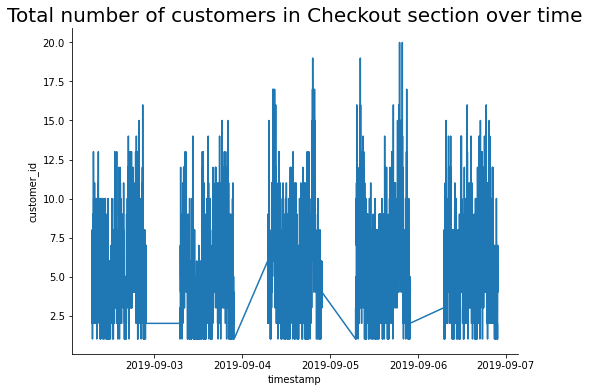

In [169]:
#plot the picture
fig, ax=plt.subplots(figsize=(8, 6))
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
sns.lineplot(x='timestamp',y='customer_id', data=df_subset)
plt.title('Total number of customers in Checkout section over time',fontsize=20)


In [ ]:
#DataFrame.sort_values(by=‘##’,axis=0,ascending=True, inplace=False, na_position=‘last’)

In [176]:
df.groupby('customer_id')

In [177]:
for key, values in df.groupby('customer_id'):
    print (key)
    print (values)

21
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:03:00     dairy          21    2     7 0 days 00:02:00       27
2019-09-02 07:05:00  checkout          21    2     7 0 days 00:02:00       27
210
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:06:00     fruit         210    2     7 0 days 00:02:00       27
2019-09-02 07:08:00  checkout         210    2     7 0 days 00:02:00       27
2100
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:56:00    drinks        2100    2     7 0 days 00:07:00       27
2019-09-02 08:03:00  checkout        2100    2     8 0 days 00:07:00       28
21000
                     location customer_id  day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:01:00    spices       21034    2    18 0 days 00:06:00      218
2019-09-02 18:04:00     dairy       21034    2    18 0 days 00:06:00      218
2019-09-02 18:05:00    spices       21034    2    18 0 days 00:06:00      218
2019-09-02 18:07:00  checkout       21034    2    18 0 days 00:06:00      218
21035
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:01:00     dairy       21035    2    18 0 days 00:04:00      218
2019-09-02 18:03:00    drinks       21035    2    18 0 days 00:04:00      218
2019-09-02 18:05:00  checkout       21035    2    18 0 days 00:04:00      218
21036
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:18:00     fruit       21074    2    18 0 days 00:03:00      218
2019-09-02 18:21:00  checkout       21074    2    18 0 days 00:03:00      218
21075
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:18:00     fruit       21075    2    18 0 days 00:03:00      218
2019-09-02 18:21:00  checkout       21075    2    18 0 days 00:03:00      218
21076
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:18:00    drinks       21076    2    18 0 days 00:02:00      218
2019-09-02 18:20:00  checkout       21076    2    18 0 days 00:02:00      218
21077
                     location customer_id  day

2019-09-02 18:47:00  checkout       21133    2    18 0 days 00:02:00      218
21134
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:45:00     fruit       21134    2    18 0 days 00:15:00      218
2019-09-02 18:47:00    spices       21134    2    18 0 days 00:15:00      218
2019-09-02 18:48:00     dairy       21134    2    18 0 days 00:15:00      218
2019-09-02 18:50:00     fruit       21134    2    18 0 days 00:15:00      218
2019-09-02 19:00:00  checkout       21134    2    19 0 days 00:15:00      219
21135
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 18:46:00    spices       21135    2    18 0 days 00:08:00      218
2019-09-02 18:47:00    drinks       21135    2    18 0 days 00:08:00      218
2019-09-02 18:54:00  checkout       21135    2    18

2019-09-02 19:14:00  checkout       21180    2    19 0 days 00:07:00      219
21181
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:07:00     dairy       21181    2    19 0 days 00:02:00      219
2019-09-02 19:09:00  checkout       21181    2    19 0 days 00:02:00      219
21182
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:07:00     dairy       21182    2    19 0 days 00:01:00      219
2019-09-02 19:08:00  checkout       21182    2    19 0 days 00:01:00      219
21183
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:07:00    drinks       21183    2    19 0 days 00:03:00      219
2019-09-02 19:10:00  checkout       21183    2

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:27:00     fruit       21221    2    19 0 days 00:11:00      219
2019-09-02 19:28:00    spices       21221    2    19 0 days 00:11:00      219
2019-09-02 19:29:00     dairy       21221    2    19 0 days 00:11:00      219
2019-09-02 19:35:00     fruit       21221    2    19 0 days 00:11:00      219
2019-09-02 19:36:00    drinks       21221    2    19 0 days 00:11:00      219
2019-09-02 19:38:00  checkout       21221    2    19 0 days 00:11:00      219
21222
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:28:00     fruit       21222    2    19 0 days 00:02:00      219
2019-09-02 19:29:00    drinks       21222    2    19 0 days 00:02:00      219
2019-09-02 19:30:00  checkout       21222    2    19 0 day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:50:00     fruit       21261    2    19 0 days 00:05:00      219
2019-09-02 19:52:00     dairy       21261    2    19 0 days 00:05:00      219
2019-09-02 19:55:00  checkout       21261    2    19 0 days 00:05:00      219
21262
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 19:50:00    drinks       21262    2    19 0 days 00:05:00      219
2019-09-02 19:51:00     fruit       21262    2    19 0 days 00:05:00      219
2019-09-02 19:52:00    drinks       21262    2    19 0 days 00:05:00      219
2019-09-02 19:55:00  checkout       21262    2    19 0 days 00:05:00      219
21263
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

2019-09-02 20:35:00  checkout       21304    2    20 0 days 00:25:00      220
21305
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:12:00    spices       21305    2    20 0 days 00:03:00      220
2019-09-02 20:15:00  checkout       21305    2    20 0 days 00:03:00      220
21306
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:12:00     fruit       21306    2    20 0 days 00:04:00      220
2019-09-02 20:14:00    drinks       21306    2    20 0 days 00:04:00      220
2019-09-02 20:15:00    spices       21306    2    20 0 days 00:04:00      220
2019-09-02 20:16:00  checkout       21306    2    20 0 days 00:04:00      220
21307
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

2019-09-02 20:39:00  checkout       21344    2    20 0 days 00:02:00      220
21345
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:38:00     fruit       21345    2    20 0 days 00:04:00      220
2019-09-02 20:39:00    spices       21345    2    20 0 days 00:04:00      220
2019-09-02 20:41:00     fruit       21345    2    20 0 days 00:04:00      220
2019-09-02 20:42:00  checkout       21345    2    20 0 days 00:04:00      220
21346
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:38:00    drinks       21346    2    20 0 days 00:01:00      220
2019-09-02 20:39:00  checkout       21346    2    20 0 days 00:01:00      220
21347
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:51:00     dairy       21380    2    20 0 days 00:17:00      220
2019-09-02 20:53:00    drinks       21380    2    20 0 days 00:17:00      220
2019-09-02 20:57:00    spices       21380    2    20 0 days 00:17:00      220
2019-09-02 20:59:00     dairy       21380    2    20 0 days 00:17:00      220
2019-09-02 21:08:00  checkout       21380    2    21 0 days 00:17:00      221
21381
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 20:52:00    drinks       21381    2    20 0 days 00:04:00      220
2019-09-02 20:54:00     fruit       21381    2    20 0 days 00:04:00      220
2019-09-02 20:55:00     dairy       21381    2    20 0 days 00:04:00      220
2019-09-02 20:56:00  checkout       21381    2    20 0 day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 21:26:00    drinks       21418    2    21 0 days 00:01:00      221
2019-09-02 21:27:00  checkout       21418    2    21 0 days 00:01:00      221
21419
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 21:26:00     fruit       21419    2    21 0 days 00:03:00      221
2019-09-02 21:28:00    drinks       21419    2    21 0 days 00:03:00      221
2019-09-02 21:29:00  checkout       21419    2    21 0 days 00:03:00      221
2142
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:23:00     dairy        2142    2     8 0 days 00:07:00       28
2019-09-02 08:28:00    drinks        2142    2     8 

2019-09-02 08:33:00  checkout        2156    2     8 0 days 00:01:00       28
2157
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:32:00    spices        2157    2     8 0 days 00:06:00       28
2019-09-02 08:35:00     dairy        2157    2     8 0 days 00:06:00       28
2019-09-02 08:38:00  checkout        2157    2     8 0 days 00:06:00       28
2158
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:33:00    drinks        2158    2     8 0 days 00:12:00       28
2019-09-02 08:35:00    spices        2158    2     8 0 days 00:12:00       28
2019-09-02 08:36:00    drinks        2158    2     8 0 days 00:12:00       28
2019-09-02 08:45:00  checkout        2158    2     8 0 days 00:12:00       28
2159
                     location customer_id  day  h

2019-09-02 08:54:00  checkout        2189    2     8 0 days 00:07:00       28
219
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:12:00    spices         219    2     7 0 days 00:08:00       27
2019-09-02 07:13:00    drinks         219    2     7 0 days 00:08:00       27
2019-09-02 07:20:00  checkout         219    2     7 0 days 00:08:00       27
2190
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 08:47:00    spices        2190    2     8 0 days 00:07:00       28
2019-09-02 08:48:00     dairy        2190    2     8 0 days 00:07:00       28
2019-09-02 08:54:00  checkout        2190    2     8 0 days 00:07:00       28
2191
                     location customer_id  day  hour      time_spent day_hour
timestamp                                         

2019-09-02 09:13:00  checkout        2227    2     9 0 days 00:02:00       29
2228
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:12:00    spices        2228    2     9 0 days 00:04:00       29
2019-09-02 09:14:00    drinks        2228    2     9 0 days 00:04:00       29
2019-09-02 09:16:00  checkout        2228    2     9 0 days 00:04:00       29
2229
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:12:00    spices        2229    2     9 0 days 00:18:00       29
2019-09-02 09:16:00     dairy        2229    2     9 0 days 00:18:00       29
2019-09-02 09:19:00     fruit        2229    2     9 0 days 00:18:00       29
2019-09-02 09:22:00     dairy        2229    2     9 0 days 00:18:00       29
2019-09-02 09:28:00     fruit        2229    2     9 0

2019-09-02 09:40:00  checkout        2268    2     9 0 days 00:01:00       29
2269
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:40:00     fruit        2269    2     9 0 days 00:04:00       29
2019-09-02 09:44:00  checkout        2269    2     9 0 days 00:04:00       29
227
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:16:00    spices         227    2     7 0 days 00:17:00       27
2019-09-02 07:19:00     dairy         227    2     7 0 days 00:17:00       27
2019-09-02 07:33:00  checkout         227    2     7 0 days 00:17:00       27
2270
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 09:40:00     fruit        2270    2    

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:07:00     fruit        2308    2    10 0 days 00:01:00      210
2019-09-02 10:08:00  checkout        2308    2    10 0 days 00:01:00      210
2309
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:07:00    spices        2309    2    10 0 days 00:01:00      210
2019-09-02 10:08:00  checkout        2309    2    10 0 days 00:01:00      210
231
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:17:00    spices         231    2     7 0 days 00:01:00       27
2019-09-02 07:18:00  checkout         231    2     7 0 days 00:01:00       27
2310
                     location customer_id  day  ho

2019-09-02 10:37:00  checkout        2347    2    10 0 days 00:01:00      210
2348
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:36:00    spices        2348    2    10 0 days 00:07:00      210
2019-09-02 10:37:00    drinks        2348    2    10 0 days 00:07:00      210
2019-09-02 10:40:00    spices        2348    2    10 0 days 00:07:00      210
2019-09-02 10:43:00  checkout        2348    2    10 0 days 00:07:00      210
2349
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 10:36:00    spices        2349    2    10 0 days 00:11:00      210
2019-09-02 10:40:00     dairy        2349    2    10 0 days 00:11:00      210
2019-09-02 10:42:00    spices        2349    2    10 0 days 00:11:00      210
2019-09-02 10:43:00    drinks        2349    2    10 0

2019-09-02 11:36:00  checkout        2391    2    11 0 days 00:28:00      211
2392
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 11:09:00     fruit        2392    2    11 0 days 00:04:00      211
2019-09-02 11:10:00    spices        2392    2    11 0 days 00:04:00      211
2019-09-02 11:13:00  checkout        2392    2    11 0 days 00:04:00      211
2393
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 11:09:00     fruit        2393    2    11 0 days 00:01:00      211
2019-09-02 11:10:00  checkout        2393    2    11 0 days 00:01:00      211
2394
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 11:09:00     fruit        2394    2   

2019-09-02 11:54:00  checkout        2428    2    11 0 days 00:03:00      211
2429
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 11:52:00    drinks        2429    2    11 0 days 00:03:00      211
2019-09-02 11:55:00  checkout        2429    2    11 0 days 00:03:00      211
243
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:26:00     fruit         243    2     7 0 days 00:17:00       27
2019-09-02 07:28:00     dairy         243    2     7 0 days 00:17:00       27
2019-09-02 07:39:00     fruit         243    2     7 0 days 00:17:00       27
2019-09-02 07:41:00     dairy         243    2     7 0 days 00:17:00       27
2019-09-02 07:43:00  checkout         243    2     7 0 days 00:17:00       27
2430
                     location customer_id  day  ho

2019-09-02 12:25:00  checkout        2465    2    12 0 days 00:02:00      212
2466
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:25:00    drinks        2466    2    12 0 days 00:03:00      212
2019-09-02 12:28:00  checkout        2466    2    12 0 days 00:03:00      212
2467
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:25:00    spices        2467    2    12 0 days 00:03:00      212
2019-09-02 12:28:00  checkout        2467    2    12 0 days 00:03:00      212
2468
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:26:00     fruit        2468    2    12 0 days 00:05:00      212
2019-09-02 12:27:00     dairy        2468    2   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:46:00     fruit        2500    2    12 0 days 00:03:00      212
2019-09-02 12:49:00  checkout        2500    2    12 0 days 00:03:00      212
2501
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:46:00     fruit        2501    2    12 0 days 00:04:00      212
2019-09-02 12:50:00  checkout        2501    2    12 0 days 00:04:00      212
2502
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 12:48:00     dairy        2502    2    12 0 days 00:08:00      212
2019-09-02 12:55:00    drinks        2502    2    12 0 days 00:08:00      212
2019-09-02 12:56:00  checkout        2502    2    12 0

2019-09-02 13:32:00  checkout        2535    2    13 0 days 00:22:00      213
2536
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:10:00     fruit        2536    2    13 0 days 00:17:00      213
2019-09-02 13:11:00    spices        2536    2    13 0 days 00:17:00      213
2019-09-02 13:13:00     dairy        2536    2    13 0 days 00:17:00      213
2019-09-02 13:20:00     fruit        2536    2    13 0 days 00:17:00      213
2019-09-02 13:25:00    drinks        2536    2    13 0 days 00:17:00      213
2019-09-02 13:27:00  checkout        2536    2    13 0 days 00:17:00      213
2537
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:10:00     dairy        2537    2    13 0 days 00:07:00      213
2019-09-02 13:11:00    drinks        2537    2    13 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:30:00    spices        2572    2    13 0 days 00:07:00      213
2019-09-02 13:31:00     fruit        2572    2    13 0 days 00:07:00      213
2019-09-02 13:34:00    spices        2572    2    13 0 days 00:07:00      213
2019-09-02 13:35:00     fruit        2572    2    13 0 days 00:07:00      213
2019-09-02 13:37:00  checkout        2572    2    13 0 days 00:07:00      213
2573
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:30:00    drinks        2573    2    13 0 days 00:05:00      213
2019-09-02 13:35:00  checkout        2573    2    13 0 days 00:05:00      213
2574
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-02 13:49:00  checkout        2615    2    13 0 days 00:02:00      213
2616
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:47:00    spices        2616    2    13 0 days 00:03:00      213
2019-09-02 13:48:00    drinks        2616    2    13 0 days 00:03:00      213
2019-09-02 13:50:00  checkout        2616    2    13 0 days 00:03:00      213
2617
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:47:00     dairy        2617    2    13 0 days 00:01:00      213
2019-09-02 13:48:00  checkout        2617    2    13 0 days 00:01:00      213
2618
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 13:48:00     fruit        2618    2   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:21:00     fruit        2662    2    14 0 days 00:08:00      214
2019-09-02 14:23:00     dairy        2662    2    14 0 days 00:08:00      214
2019-09-02 14:25:00    spices        2662    2    14 0 days 00:08:00      214
2019-09-02 14:26:00     fruit        2662    2    14 0 days 00:08:00      214
2019-09-02 14:29:00  checkout        2662    2    14 0 days 00:08:00      214
2663
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:21:00     fruit        2663    2    14 0 days 00:06:00      214
2019-09-02 14:22:00     dairy        2663    2    14 0 days 00:06:00      214
2019-09-02 14:23:00     fruit        2663    2    14 0 days 00:06:00      214
2019-09-02 14:27:00  checkout        2663    2    14 0 days

2019-09-02 14:37:00  checkout        2693    2    14 0 days 00:01:00      214
2694
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:36:00    drinks        2694    2    14 0 days 00:06:00      214
2019-09-02 14:37:00    spices        2694    2    14 0 days 00:06:00      214
2019-09-02 14:38:00     dairy        2694    2    14 0 days 00:06:00      214
2019-09-02 14:40:00     fruit        2694    2    14 0 days 00:06:00      214
2019-09-02 14:42:00  checkout        2694    2    14 0 days 00:06:00      214
2695
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 14:38:00     fruit        2695    2    14 0 days 00:15:00      214
2019-09-02 14:46:00    spices        2695    2    14 0 days 00:15:00      214
2019-09-02 14:47:00    drinks        2695    2    14 0

2019-09-02 15:08:00  checkout        2727    2    15 0 days 00:08:00      215
2728
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:00:00     fruit        2728    2    15 0 days 00:01:00      215
2019-09-02 15:01:00  checkout        2728    2    15 0 days 00:01:00      215
2729
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:01:00    drinks        2729    2    15 0 days 00:07:00      215
2019-09-02 15:02:00     fruit        2729    2    15 0 days 00:07:00      215
2019-09-02 15:04:00     dairy        2729    2    15 0 days 00:07:00      215
2019-09-02 15:07:00     fruit        2729    2    15 0 days 00:07:00      215
2019-09-02 15:08:00  checkout        2729    2    15 0 days 00:07:00      215
273
                     location customer_id  day  ho

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:23:00     dairy        2770    2    15 0 days 00:08:00      215
2019-09-02 15:27:00    spices        2770    2    15 0 days 00:08:00      215
2019-09-02 15:28:00     dairy        2770    2    15 0 days 00:08:00      215
2019-09-02 15:29:00     fruit        2770    2    15 0 days 00:08:00      215
2019-09-02 15:31:00  checkout        2770    2    15 0 days 00:08:00      215
2771
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:23:00     fruit        2771    2    15 0 days 00:02:00      215
2019-09-02 15:25:00  checkout        2771    2    15 0 days 00:02:00      215
2772
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-02 15:58:00  checkout        2811    2    15 0 days 00:11:00      215
2812
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:47:00    drinks        2812    2    15 0 days 00:01:00      215
2019-09-02 15:48:00  checkout        2812    2    15 0 days 00:01:00      215
2813
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:55:00     dairy        2813    2    15 0 days 00:02:00      215
2019-09-02 15:57:00  checkout        2813    2    15 0 days 00:02:00      215
2814
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 15:55:00    spices        2814    2    15 0 days 00:07:00      215
2019-09-02 15:56:00    drinks        2814    2   

2019-09-02 16:33:00  checkout        2847    2    16 0 days 00:01:00      216
2848
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:32:00     dairy        2848    2    16 0 days 00:15:00      216
2019-09-02 16:42:00     fruit        2848    2    16 0 days 00:15:00      216
2019-09-02 16:47:00  checkout        2848    2    16 0 days 00:15:00      216
2849
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:32:00    drinks        2849    2    16 0 days 00:05:00      216
2019-09-02 16:34:00    spices        2849    2    16 0 days 00:05:00      216
2019-09-02 16:35:00    drinks        2849    2    16 0 days 00:05:00      216
2019-09-02 16:37:00  checkout        2849    2    16 0 days 00:05:00      216
285
                     location customer_id  day  ho

2019-09-02 16:49:00  checkout        2885    2    16 0 days 00:01:00      216
2886
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:48:00     dairy        2886    2    16 0 days 00:01:00      216
2019-09-02 16:49:00  checkout        2886    2    16 0 days 00:01:00      216
2887
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 16:48:00    spices        2887    2    16 0 days 00:10:00      216
2019-09-02 16:49:00    drinks        2887    2    16 0 days 00:10:00      216
2019-09-02 16:50:00     fruit        2887    2    16 0 days 00:10:00      216
2019-09-02 16:55:00    spices        2887    2    16 0 days 00:10:00      216
2019-09-02 16:57:00     dairy        2887    2    16 0 days 00:10:00      216
2019-09-02 16:58:00  checkout        2887    2    16 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:04:00    spices        2920    2    17 0 days 00:05:00      217
2019-09-02 17:05:00     dairy        2920    2    17 0 days 00:05:00      217
2019-09-02 17:08:00    drinks        2920    2    17 0 days 00:05:00      217
2019-09-02 17:09:00  checkout        2920    2    17 0 days 00:05:00      217
2921
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:04:00    spices        2921    2    17 0 days 00:14:00      217
2019-09-02 17:05:00     fruit        2921    2    17 0 days 00:14:00      217
2019-09-02 17:06:00     dairy        2921    2    17 0 days 00:14:00      217
2019-09-02 17:13:00    spices        2921    2    17 0 days 00:14:00      217
2019-09-02 17:14:00    drinks        2921    2    17 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:20:00     fruit        2958    2    17 0 days 00:09:00      217
2019-09-02 17:29:00  checkout        2958    2    17 0 days 00:09:00      217
2959
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 17:20:00     dairy        2959    2    17 0 days 00:01:00      217
2019-09-02 17:21:00  checkout        2959    2    17 0 days 00:01:00      217
296
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-02 07:53:00     dairy         296    2     7 0 days 00:01:00       27
2019-09-02 07:54:00  checkout         296    2     7 0 days 00:01:00       27
2960
                     location customer_id  day  ho

2019-09-03 07:12:00  checkout          31    3     7 0 days 00:10:00       37
310
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:10:00     fruit         310    3     7 0 days 00:04:00       37
2019-09-03 07:14:00  checkout         310    3     7 0 days 00:04:00       37
3100
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:57:00     dairy        3100    3     7 0 days 00:01:00       37
2019-09-03 07:58:00  checkout        3100    3     7 0 days 00:01:00       37
31000
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:53:00     fruit       31000    3    17 0 days 00:04:00      317
2019-09-03 17:54:00     dairy       31000    3   

31039
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:12:00     fruit       31039    3    18 0 days 00:04:00      318
2019-09-03 18:13:00     dairy       31039    3    18 0 days 00:04:00      318
2019-09-03 18:16:00  checkout       31039    3    18 0 days 00:04:00      318
3104
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:59:00    spices        3104    3     7 0 days 00:07:00       37
2019-09-03 08:05:00     dairy        3104    3     8 0 days 00:07:00       38
2019-09-03 08:06:00  checkout        3104    3     8 0 days 00:07:00       38
31040
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:12:00     fruit       31040    3 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:30:00     dairy       31074    3    18 0 days 00:13:00      318
2019-09-03 18:31:00    spices       31074    3    18 0 days 00:13:00      318
2019-09-03 18:32:00     dairy       31074    3    18 0 days 00:13:00      318
2019-09-03 18:38:00    drinks       31074    3    18 0 days 00:13:00      318
2019-09-03 18:39:00    spices       31074    3    18 0 days 00:13:00      318
2019-09-03 18:40:00     dairy       31074    3    18 0 days 00:13:00      318
2019-09-03 18:41:00    drinks       31074    3    18 0 days 00:13:00      318
2019-09-03 18:43:00  checkout       31074    3    18 0 days 00:13:00      318
31075
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:30:00     dairy       31075    3    18 0 day

2019-09-03 18:56:00  checkout       31116    3    18 0 days 00:08:00      318
31117
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:48:00     fruit       31117    3    18 0 days 00:04:00      318
2019-09-03 18:50:00     dairy       31117    3    18 0 days 00:04:00      318
2019-09-03 18:52:00  checkout       31117    3    18 0 days 00:04:00      318
31118
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:48:00     fruit       31118    3    18 0 days 00:04:00      318
2019-09-03 18:52:00  checkout       31118    3    18 0 days 00:04:00      318
31119
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 18:48:00     fruit       31119    3

2019-09-03 19:11:00  checkout       31157    3    19 0 days 00:05:00      319
31158
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:06:00    spices       31158    3    19 0 days 00:16:00      319
2019-09-03 19:07:00    drinks       31158    3    19 0 days 00:16:00      319
2019-09-03 19:08:00     fruit       31158    3    19 0 days 00:16:00      319
2019-09-03 19:09:00    spices       31158    3    19 0 days 00:16:00      319
2019-09-03 19:10:00     dairy       31158    3    19 0 days 00:16:00      319
2019-09-03 19:13:00    spices       31158    3    19 0 days 00:16:00      319
2019-09-03 19:14:00     dairy       31158    3    19 0 days 00:16:00      319
2019-09-03 19:18:00    drinks       31158    3    19 0 days 00:16:00      319
2019-09-03 19:22:00  checkout       31158    3    19 0 days 00:16:00      319
31159
                     location customer_id  day  hour

2019-09-03 19:21:00  checkout       31191    3    19 0 days 00:01:00      319
31192
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:20:00    drinks       31192    3    19 0 days 00:12:00      319
2019-09-03 19:23:00    spices       31192    3    19 0 days 00:12:00      319
2019-09-03 19:24:00     dairy       31192    3    19 0 days 00:12:00      319
2019-09-03 19:31:00    drinks       31192    3    19 0 days 00:12:00      319
2019-09-03 19:32:00  checkout       31192    3    19 0 days 00:12:00      319
31193
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:20:00    drinks       31193    3    19 0 days 00:04:00      319
2019-09-03 19:24:00  checkout       31193    3    19 0 days 00:04:00      319
31194
                     location customer_id  day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:38:00     dairy       31234    3    19 0 days 00:04:00      319
2019-09-03 19:42:00  checkout       31234    3    19 0 days 00:04:00      319
31235
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:38:00    drinks       31235    3    19 0 days 00:01:00      319
2019-09-03 19:39:00  checkout       31235    3    19 0 days 00:01:00      319
31236
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 19:38:00     dairy       31236    3    19 0 days 00:07:00      319
2019-09-03 19:41:00    drinks       31236    3    19 0 days 00:07:00      319
2019-09-03 19:45:00  checkout       31236    3    19

2019-09-03 20:05:00  checkout       31278    3    20 0 days 00:02:00      320
31279
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:04:00     fruit       31279    3    20 0 days 00:03:00      320
2019-09-03 20:05:00     dairy       31279    3    20 0 days 00:03:00      320
2019-09-03 20:07:00  checkout       31279    3    20 0 days 00:03:00      320
3128
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:08:00     fruit        3128    3     8 0 days 00:16:00       38
2019-09-03 08:10:00     dairy        3128    3     8 0 days 00:16:00       38
2019-09-03 08:12:00     fruit        3128    3     8 0 days 00:16:00       38
2019-09-03 08:14:00     dairy        3128    3     8 0 days 00:16:00       38
2019-09-03 08:20:00    spices        3128    3     8 

2019-09-03 20:25:00  checkout       31316    3    20 0 days 00:05:00      320
31317
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:20:00    drinks       31317    3    20 0 days 00:11:00      320
2019-09-03 20:23:00    spices       31317    3    20 0 days 00:11:00      320
2019-09-03 20:25:00     dairy       31317    3    20 0 days 00:11:00      320
2019-09-03 20:27:00    spices       31317    3    20 0 days 00:11:00      320
2019-09-03 20:28:00     dairy       31317    3    20 0 days 00:11:00      320
2019-09-03 20:30:00    drinks       31317    3    20 0 days 00:11:00      320
2019-09-03 20:31:00  checkout       31317    3    20 0 days 00:11:00      320
31318
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:20:00    drinks       31318    3    20

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:54:00     dairy       31359    3    20 0 days 00:02:00      320
2019-09-03 20:56:00  checkout       31359    3    20 0 days 00:02:00      320
3136
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:15:00     fruit        3136    3     8 0 days 00:02:00       38
2019-09-03 08:17:00  checkout        3136    3     8 0 days 00:02:00       38
31360
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 20:58:00     fruit       31360    3    20 0 days 00:02:00      320
2019-09-03 21:00:00  checkout       31360    3    21 0 days 00:02:00      321
31361
                     location customer_id  day 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 21:25:00     fruit       31404    3    21 0 days 00:01:00      321
2019-09-03 21:26:00  checkout       31404    3    21 0 days 00:01:00      321
31405
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 21:25:00    spices       31405    3    21 0 days 00:06:00      321
2019-09-03 21:28:00    drinks       31405    3    21 0 days 00:06:00      321
2019-09-03 21:31:00  checkout       31405    3    21 0 days 00:06:00      321
31406
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 21:28:00     fruit       31406    3    21 0 days 00:08:00      321
2019-09-03 21:29:00    drinks       31406    3    21

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:27:00     dairy        3165    3     8 0 days 00:12:00       38
2019-09-03 08:33:00    drinks        3165    3     8 0 days 00:12:00       38
2019-09-03 08:35:00    spices        3165    3     8 0 days 00:12:00       38
2019-09-03 08:37:00    drinks        3165    3     8 0 days 00:12:00       38
2019-09-03 08:39:00  checkout        3165    3     8 0 days 00:12:00       38
3166
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:27:00     fruit        3166    3     8 0 days 00:08:00       38
2019-09-03 08:28:00     dairy        3166    3     8 0 days 00:08:00       38
2019-09-03 08:32:00    spices        3166    3     8 0 days 00:08:00       38
2019-09-03 08:35:00  checkout        3166    3     8 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:14:00    drinks         321    3     7 0 days 00:06:00       37
2019-09-03 07:15:00    spices         321    3     7 0 days 00:06:00       37
2019-09-03 07:17:00    drinks         321    3     7 0 days 00:06:00       37
2019-09-03 07:20:00  checkout         321    3     7 0 days 00:06:00       37
3210
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:48:00     fruit        3210    3     8 0 days 00:03:00       38
2019-09-03 08:51:00  checkout        3210    3     8 0 days 00:03:00       38
3211
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 08:48:00     fruit        3211    3     8 0

2019-09-03 09:19:00  checkout        3250    3     9 0 days 00:02:00       39
3251
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 09:17:00    drinks        3251    3     9 0 days 00:05:00       39
2019-09-03 09:19:00     fruit        3251    3     9 0 days 00:05:00       39
2019-09-03 09:21:00    drinks        3251    3     9 0 days 00:05:00       39
2019-09-03 09:22:00  checkout        3251    3     9 0 days 00:05:00       39
3252
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 09:17:00     fruit        3252    3     9 0 days 00:05:00       39
2019-09-03 09:22:00  checkout        3252    3     9 0 days 00:05:00       39
3253
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

2019-09-03 07:22:00  checkout         330    3     7 0 days 00:03:00       37
3300
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 09:56:00     fruit        3300    3     9 0 days 00:01:00       39
2019-09-03 09:57:00  checkout        3300    3     9 0 days 00:01:00       39
3301
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 09:57:00     fruit        3301    3     9 0 days 00:18:00       39
2019-09-03 10:01:00    drinks        3301    3    10 0 days 00:18:00      310
2019-09-03 10:06:00    spices        3301    3    10 0 days 00:18:00      310
2019-09-03 10:07:00     dairy        3301    3    10 0 days 00:18:00      310
2019-09-03 10:08:00    spices        3301    3    10 0 days 00:18:00      310
2019-09-03 10:09:00    drinks        3301    3    10 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:21:00    drinks         334    3     7 0 days 00:01:00       37
2019-09-03 07:22:00  checkout         334    3     7 0 days 00:01:00       37
3340
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 10:26:00     fruit        3340    3    10 0 days 00:09:00      310
2019-09-03 10:27:00    spices        3340    3    10 0 days 00:09:00      310
2019-09-03 10:29:00     fruit        3340    3    10 0 days 00:09:00      310
2019-09-03 10:32:00    drinks        3340    3    10 0 days 00:09:00      310
2019-09-03 10:34:00    spices        3340    3    10 0 days 00:09:00      310
2019-09-03 10:35:00  checkout        3340    3    10 0 days 00:09:00      310
3341
                     location customer_id  day  hour  

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 11:02:00     dairy        3390    3    11 0 days 00:06:00      311
2019-09-03 11:05:00    spices        3390    3    11 0 days 00:06:00      311
2019-09-03 11:06:00    drinks        3390    3    11 0 days 00:06:00      311
2019-09-03 11:08:00  checkout        3390    3    11 0 days 00:06:00      311
3391
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 11:02:00     dairy        3391    3    11 0 days 00:30:00      311
2019-09-03 11:32:00  checkout        3391    3    11 0 days 00:30:00      311
3392
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 11:02:00     fruit        3392    3    11 0

2019-09-03 12:13:00  checkout        3433    3    12 0 days 00:11:00      312
3434
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:02:00     dairy        3434    3    12 0 days 00:03:00      312
2019-09-03 12:05:00  checkout        3434    3    12 0 days 00:03:00      312
3435
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:03:00     dairy        3435    3    12 0 days 00:05:00      312
2019-09-03 12:08:00  checkout        3435    3    12 0 days 00:05:00      312
3436
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:04:00     fruit        3436    3    12 0 days 00:01:00      312
2019-09-03 12:05:00  checkout        3436    3   

2019-09-03 07:30:00  checkout         347    3     7 0 days 00:02:00       37
3470
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:42:00     fruit        3470    3    12 0 days 00:02:00      312
2019-09-03 12:44:00  checkout        3470    3    12 0 days 00:02:00      312
3471
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 12:42:00    drinks        3471    3    12 0 days 00:04:00      312
2019-09-03 12:43:00    spices        3471    3    12 0 days 00:04:00      312
2019-09-03 12:44:00     fruit        3471    3    12 0 days 00:04:00      312
2019-09-03 12:46:00  checkout        3471    3    12 0 days 00:04:00      312
3472
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

3542
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:22:00     dairy        3542    3    13 0 days 00:01:00      313
2019-09-03 13:23:00  checkout        3542    3    13 0 days 00:01:00      313
3543
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:22:00     fruit        3543    3    13 0 days 00:01:00      313
2019-09-03 13:23:00  checkout        3543    3    13 0 days 00:01:00      313
3544
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:22:00     dairy        3544    3    13 0 days 00:03:00      313
2019-09-03 13:25:00  checkout        3544    3    13 0 days 00:03:00      313
3545
                     location customer_id  d

2019-09-03 14:07:00  checkout        3584    3    14 0 days 00:16:00      314
3585
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:51:00    spices        3585    3    13 0 days 00:11:00      313
2019-09-03 13:52:00     dairy        3585    3    13 0 days 00:11:00      313
2019-09-03 13:59:00    spices        3585    3    13 0 days 00:11:00      313
2019-09-03 14:01:00    drinks        3585    3    14 0 days 00:11:00      314
2019-09-03 14:02:00  checkout        3585    3    14 0 days 00:11:00      314
3586
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 13:51:00     fruit        3586    3    13 0 days 00:01:00      313
2019-09-03 13:52:00  checkout        3586    3    13 0 days 00:01:00      313
3587
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:17:00     fruit        3624    3    14 0 days 00:07:00      314
2019-09-03 14:19:00     dairy        3624    3    14 0 days 00:07:00      314
2019-09-03 14:23:00    spices        3624    3    14 0 days 00:07:00      314
2019-09-03 14:24:00  checkout        3624    3    14 0 days 00:07:00      314
3625
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:17:00     fruit        3625    3    14 0 days 00:08:00      314
2019-09-03 14:19:00     dairy        3625    3    14 0 days 00:08:00      314
2019-09-03 14:23:00     fruit        3625    3    14 0 days 00:08:00      314
2019-09-03 14:25:00  checkout        3625    3    14 0 days 00:08:00      314
3626
                     location customer_id  day  hour  

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:40:00     fruit        3667    3    14 0 days 00:08:00      314
2019-09-03 14:43:00    spices        3667    3    14 0 days 00:08:00      314
2019-09-03 14:45:00    drinks        3667    3    14 0 days 00:08:00      314
2019-09-03 14:46:00    spices        3667    3    14 0 days 00:08:00      314
2019-09-03 14:47:00    drinks        3667    3    14 0 days 00:08:00      314
2019-09-03 14:48:00  checkout        3667    3    14 0 days 00:08:00      314
3668
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 14:40:00     dairy        3668    3    14 0 days 00:01:00      314
2019-09-03 14:41:00  checkout        3668    3    14 0 days 00:01:00      314
3669
                     location customer_id  day  hour  

2019-09-03 15:13:00  checkout        3717    3    15 0 days 00:03:00      315
3718
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:10:00     fruit        3718    3    15 0 days 00:09:00      315
2019-09-03 15:11:00     dairy        3718    3    15 0 days 00:09:00      315
2019-09-03 15:19:00  checkout        3718    3    15 0 days 00:09:00      315
3719
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:11:00     dairy        3719    3    15 0 days 00:17:00      315
2019-09-03 15:20:00    drinks        3719    3    15 0 days 00:17:00      315
2019-09-03 15:22:00    spices        3719    3    15 0 days 00:17:00      315
2019-09-03 15:23:00     dairy        3719    3    15 0 days 00:17:00      315
2019-09-03 15:28:00  checkout        3719    3    15 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:49:00     dairy        3758    3    15 0 days 00:03:00      315
2019-09-03 15:52:00  checkout        3758    3    15 0 days 00:03:00      315
3759
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 15:49:00     fruit        3759    3    15 0 days 00:05:00      315
2019-09-03 15:54:00  checkout        3759    3    15 0 days 00:05:00      315
376
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:44:00     fruit         376    3     7 0 days 00:08:00       37
2019-09-03 07:45:00     dairy         376    3     7 0 days 00:08:00       37
2019-09-03 07:52:00  checkout         376    3     7 0 

2019-09-03 16:14:00  checkout        3806    3    16 0 days 00:01:00      316
3807
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:13:00     fruit        3807    3    16 0 days 00:04:00      316
2019-09-03 16:14:00     dairy        3807    3    16 0 days 00:04:00      316
2019-09-03 16:17:00  checkout        3807    3    16 0 days 00:04:00      316
3808
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:15:00     dairy        3808    3    16 0 days 00:14:00      316
2019-09-03 16:19:00    spices        3808    3    16 0 days 00:14:00      316
2019-09-03 16:21:00     dairy        3808    3    16 0 days 00:14:00      316
2019-09-03 16:24:00     fruit        3808    3    16 0 days 00:14:00      316
2019-09-03 16:25:00     dairy        3808    3    16 0

2019-09-03 16:44:00  checkout        3854    3    16 0 days 00:05:00      316
3855
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:39:00     fruit        3855    3    16 0 days 00:01:00      316
2019-09-03 16:40:00  checkout        3855    3    16 0 days 00:01:00      316
3856
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:39:00     fruit        3856    3    16 0 days 00:02:00      316
2019-09-03 16:41:00  checkout        3856    3    16 0 days 00:02:00      316
3857
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 16:41:00     fruit        3857    3    16 0 days 00:22:00      316
2019-09-03 16:44:00     dairy        3857    3   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:07:00     dairy        3910    3    17 0 days 00:15:00      317
2019-09-03 17:13:00    drinks        3910    3    17 0 days 00:15:00      317
2019-09-03 17:22:00  checkout        3910    3    17 0 days 00:15:00      317
3911
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:07:00     fruit        3911    3    17 0 days 00:10:00      317
2019-09-03 17:08:00     dairy        3911    3    17 0 days 00:10:00      317
2019-09-03 17:17:00  checkout        3911    3    17 0 days 00:10:00      317
3912
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:07:00     dairy        3912    3    17 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 17:40:00    drinks        3959    3    17 0 days 00:01:00      317
2019-09-03 17:41:00  checkout        3959    3    17 0 days 00:01:00      317
396
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-03 07:56:00    spices         396    3     7 0 days 00:20:00       37
2019-09-03 07:57:00    drinks         396    3     7 0 days 00:20:00       37
2019-09-03 07:59:00    spices         396    3     7 0 days 00:20:00       37
2019-09-03 08:01:00    drinks         396    3     8 0 days 00:20:00       38
2019-09-03 08:02:00     fruit         396    3     8 0 days 00:20:00       38
2019-09-03 08:06:00    spices         396    3     8 0 days 00:20:00       38
2019-09-03 08:08:00     dairy         396    3     8 0 days 

2019-09-04 16:56:00  checkout       41001    4    16 0 days 00:03:00      416
41002
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:54:00     dairy       41002    4    16 0 days 00:02:00      416
2019-09-04 16:56:00  checkout       41002    4    16 0 days 00:02:00      416
41003
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:55:00     fruit       41003    4    16 0 days 00:08:00      416
2019-09-04 16:56:00     dairy       41003    4    16 0 days 00:08:00      416
2019-09-04 16:58:00    drinks       41003    4    16 0 days 00:08:00      416
2019-09-04 17:00:00     fruit       41003    4    17 0 days 00:08:00      417
2019-09-04 17:02:00     dairy       41003    4    17 0 days 00:08:00      417
2019-09-04 17:03:00  checkout       41003    4    17

2019-09-04 17:34:00  checkout       41044    4    17 0 days 00:10:00      417
41045
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:24:00    spices       41045    4    17 0 days 00:03:00      417
2019-09-04 17:26:00     fruit       41045    4    17 0 days 00:03:00      417
2019-09-04 17:27:00  checkout       41045    4    17 0 days 00:03:00      417
41046
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:25:00     fruit       41046    4    17 0 days 00:07:00      417
2019-09-04 17:26:00     dairy       41046    4    17 0 days 00:07:00      417
2019-09-04 17:32:00  checkout       41046    4    17 0 days 00:07:00      417
41047
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:46:00    spices       41088    4    17 0 days 00:03:00      417
2019-09-04 17:49:00  checkout       41088    4    17 0 days 00:03:00      417
41089
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 17:46:00    drinks       41089    4    17 0 days 00:01:00      417
2019-09-04 17:47:00  checkout       41089    4    17 0 days 00:01:00      417
4109
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:06:00    drinks        4109    4     8 0 days 00:05:00       48
2019-09-04 08:08:00     fruit        4109    4     8 0 days 00:05:00       48
2019-09-04 08:11:00  checkout        4109    4     8 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:18:00     fruit       41134    4    18 0 days 00:09:00      418
2019-09-04 18:24:00    spices       41134    4    18 0 days 00:09:00      418
2019-09-04 18:25:00    drinks       41134    4    18 0 days 00:09:00      418
2019-09-04 18:26:00    spices       41134    4    18 0 days 00:09:00      418
2019-09-04 18:27:00  checkout       41134    4    18 0 days 00:09:00      418
41135
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:21:00    spices       41135    4    18 0 days 00:01:00      418
2019-09-04 18:22:00  checkout       41135    4    18 0 days 00:01:00      418
41136
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

2019-09-04 18:59:00  checkout       41183    4    18 0 days 00:08:00      418
41184
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:51:00    spices       41184    4    18 0 days 00:04:00      418
2019-09-04 18:52:00     fruit       41184    4    18 0 days 00:04:00      418
2019-09-04 18:55:00  checkout       41184    4    18 0 days 00:04:00      418
41185
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:52:00     fruit       41185    4    18 0 days 00:01:00      418
2019-09-04 18:53:00  checkout       41185    4    18 0 days 00:01:00      418
41186
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 18:52:00     fruit       41186    4

2019-09-04 19:16:00  checkout       41234    4    19 0 days 00:09:00      419
41235
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:07:00    drinks       41235    4    19 0 days 00:01:00      419
2019-09-04 19:08:00  checkout       41235    4    19 0 days 00:01:00      419
41236
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:08:00     dairy       41236    4    19 0 days 00:03:00      419
2019-09-04 19:09:00    drinks       41236    4    19 0 days 00:03:00      419
2019-09-04 19:11:00  checkout       41236    4    19 0 days 00:03:00      419
41237
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:08:00     dairy       41237    4

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:21:00     fruit       41284    4    19 0 days 00:01:00      419
2019-09-04 19:22:00  checkout       41284    4    19 0 days 00:01:00      419
41285
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:21:00     dairy       41285    4    19 0 days 00:04:00      419
2019-09-04 19:25:00  checkout       41285    4    19 0 days 00:04:00      419
41286
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:22:00    drinks       41286    4    19 0 days 00:10:00      419
2019-09-04 19:24:00     fruit       41286    4    19 0 days 00:10:00      419
2019-09-04 19:26:00     dairy       41286    4    19

2019-09-04 19:45:00  checkout       41321    4    19 0 days 00:14:00      419
41322
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:32:00     dairy       41322    4    19 0 days 00:01:00      419
2019-09-04 19:33:00  checkout       41322    4    19 0 days 00:01:00      419
41323
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:33:00     fruit       41323    4    19 0 days 00:02:00      419
2019-09-04 19:34:00    drinks       41323    4    19 0 days 00:02:00      419
2019-09-04 19:35:00  checkout       41323    4    19 0 days 00:02:00      419
41324
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:33:00     fruit       41324    4

2019-09-04 19:55:00  checkout       41367    4    19 0 days 00:06:00      419
41368
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:49:00     dairy       41368    4    19 0 days 00:02:00      419
2019-09-04 19:50:00    spices       41368    4    19 0 days 00:02:00      419
2019-09-04 19:51:00  checkout       41368    4    19 0 days 00:02:00      419
41369
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 19:50:00     dairy       41369    4    19 0 days 00:09:00      419
2019-09-04 19:59:00  checkout       41369    4    19 0 days 00:09:00      419
4137
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:18:00     dairy        4137    4 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:14:00    drinks       41421    4    20 0 days 00:02:00      420
2019-09-04 20:16:00  checkout       41421    4    20 0 days 00:02:00      420
41422
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:14:00    spices       41422    4    20 0 days 00:15:00      420
2019-09-04 20:15:00     dairy       41422    4    20 0 days 00:15:00      420
2019-09-04 20:22:00     fruit       41422    4    20 0 days 00:15:00      420
2019-09-04 20:27:00    spices       41422    4    20 0 days 00:15:00      420
2019-09-04 20:29:00  checkout       41422    4    20 0 days 00:15:00      420
41423
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

2019-09-04 20:50:00  checkout       41463    4    20 0 days 00:02:00      420
41464
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:48:00    drinks       41464    4    20 0 days 00:04:00      420
2019-09-04 20:50:00    spices       41464    4    20 0 days 00:04:00      420
2019-09-04 20:51:00     dairy       41464    4    20 0 days 00:04:00      420
2019-09-04 20:52:00  checkout       41464    4    20 0 days 00:04:00      420
41465
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 20:53:00    spices       41465    4    20 0 days 00:01:00      420
2019-09-04 20:54:00  checkout       41465    4    20 0 days 00:01:00      420
41466
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 21:26:00    drinks       41506    4    21 0 days 00:05:00      421
2019-09-04 21:29:00    spices       41506    4    21 0 days 00:05:00      421
2019-09-04 21:31:00  checkout       41506    4    21 0 days 00:05:00      421
41507
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 21:29:00    spices       41507    4    21 0 days 00:04:00      421
2019-09-04 21:32:00     dairy       41507    4    21 0 days 00:04:00      421
2019-09-04 21:33:00  checkout       41507    4    21 0 days 00:04:00      421
41508
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 21:29:00    drinks       41508    4    21

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:27:00     dairy        4169    4     8 0 days 00:06:00       48
2019-09-04 08:28:00    drinks        4169    4     8 0 days 00:06:00       48
2019-09-04 08:29:00    spices        4169    4     8 0 days 00:06:00       48
2019-09-04 08:33:00  checkout        4169    4     8 0 days 00:06:00       48
417
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:06:00    spices         417    4     7 0 days 00:03:00       47
2019-09-04 07:08:00     dairy         417    4     7 0 days 00:03:00       47
2019-09-04 07:09:00  checkout         417    4     7 0 days 00:03:00       47
4170
                     location customer_id  day  hour      time_spent day_hour
timestamp                                              

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:43:00    spices        4209    4     8 0 days 00:13:00       48
2019-09-04 08:46:00    drinks        4209    4     8 0 days 00:13:00       48
2019-09-04 08:47:00    spices        4209    4     8 0 days 00:13:00       48
2019-09-04 08:48:00    drinks        4209    4     8 0 days 00:13:00       48
2019-09-04 08:49:00    spices        4209    4     8 0 days 00:13:00       48
2019-09-04 08:50:00     fruit        4209    4     8 0 days 00:13:00       48
2019-09-04 08:51:00    drinks        4209    4     8 0 days 00:13:00       48
2019-09-04 08:55:00     dairy        4209    4     8 0 days 00:13:00       48
2019-09-04 08:56:00  checkout        4209    4     8 0 days 00:13:00       48
421
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:54:00     fruit        4252    4     8 0 days 00:01:00       48
2019-09-04 08:55:00  checkout        4252    4     8 0 days 00:01:00       48
4253
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:55:00     fruit        4253    4     8 0 days 00:06:00       48
2019-09-04 09:01:00  checkout        4253    4     9 0 days 00:06:00       49
4254
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 08:55:00     fruit        4254    4     8 0 days 00:04:00       48
2019-09-04 08:59:00  checkout        4254    4     8 0 days 00:04:00       48
4255
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:11:00     dairy        4292    4     9 0 days 00:08:00       49
2019-09-04 09:14:00     fruit        4292    4     9 0 days 00:08:00       49
2019-09-04 09:17:00     dairy        4292    4     9 0 days 00:08:00       49
2019-09-04 09:19:00  checkout        4292    4     9 0 days 00:08:00       49
4293
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:11:00     fruit        4293    4     9 0 days 00:08:00       49
2019-09-04 09:16:00    spices        4293    4     9 0 days 00:08:00       49
2019-09-04 09:17:00     dairy        4293    4     9 0 days 00:08:00       49
2019-09-04 09:19:00  checkout        4293    4     9 0 days 00:08:00       49
4294
                     location customer_id  day  hour  

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:33:00     dairy        4329    4     9 0 days 00:05:00       49
2019-09-04 09:38:00  checkout        4329    4     9 0 days 00:05:00       49
433
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:17:00     fruit         433    4     7 0 days 00:03:00       47
2019-09-04 07:20:00  checkout         433    4     7 0 days 00:03:00       47
4330
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:33:00     dairy        4330    4     9 0 days 00:15:00       49
2019-09-04 09:45:00    drinks        4330    4     9 0 days 00:15:00       49
2019-09-04 09:46:00     fruit        4330    4     9 0 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 09:59:00     fruit        4378    4     9 0 days 00:04:00       49
2019-09-04 10:03:00  checkout        4378    4    10 0 days 00:04:00      410
4379
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:01:00     fruit        4379    4    10 0 days 00:06:00      410
2019-09-04 10:07:00  checkout        4379    4    10 0 days 00:06:00      410
438
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:20:00     dairy         438    4     7 0 days 00:01:00       47
2019-09-04 07:21:00  checkout         438    4     7 0 days 00:01:00       47
4380
                     location customer_id  day  ho

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:26:00     dairy        4421    4    10 0 days 00:01:00      410
2019-09-04 10:27:00  checkout        4421    4    10 0 days 00:01:00      410
4422
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:26:00    spices        4422    4    10 0 days 00:10:00      410
2019-09-04 10:28:00     dairy        4422    4    10 0 days 00:10:00      410
2019-09-04 10:36:00  checkout        4422    4    10 0 days 00:10:00      410
4423
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 10:26:00    spices        4423    4    10 0 days 00:04:00      410
2019-09-04 10:27:00    drinks        4423    4    10 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:12:00    drinks        4477    4    11 0 days 00:03:00      411
2019-09-04 11:15:00  checkout        4477    4    11 0 days 00:03:00      411
4478
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:16:00     dairy        4478    4    11 0 days 00:12:00      411
2019-09-04 11:18:00     fruit        4478    4    11 0 days 00:12:00      411
2019-09-04 11:23:00     dairy        4478    4    11 0 days 00:12:00      411
2019-09-04 11:27:00    drinks        4478    4    11 0 days 00:12:00      411
2019-09-04 11:28:00  checkout        4478    4    11 0 days 00:12:00      411
4479
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:49:00     fruit        4526    4    11 0 days 00:08:00      411
2019-09-04 11:54:00    spices        4526    4    11 0 days 00:08:00      411
2019-09-04 11:56:00    drinks        4526    4    11 0 days 00:08:00      411
2019-09-04 11:57:00  checkout        4526    4    11 0 days 00:08:00      411
4527
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:50:00     dairy        4527    4    11 0 days 00:02:00      411
2019-09-04 11:52:00  checkout        4527    4    11 0 days 00:02:00      411
4528
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 11:52:00     fruit        4528    4    11 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 12:19:00     fruit        4565    4    12 0 days 00:06:00      412
2019-09-04 12:25:00  checkout        4565    4    12 0 days 00:06:00      412
4566
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 12:19:00     fruit        4566    4    12 0 days 00:02:00      412
2019-09-04 12:21:00  checkout        4566    4    12 0 days 00:02:00      412
4567
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 12:19:00     fruit        4567    4    12 0 days 00:03:00      412
2019-09-04 12:21:00    spices        4567    4    12 0 days 00:03:00      412
2019-09-04 12:22:00  checkout        4567    4    12 0

2019-09-04 12:45:00  checkout        4602    4    12 0 days 00:05:00      412
4603
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 12:41:00     fruit        4603    4    12 0 days 00:02:00      412
2019-09-04 12:42:00     dairy        4603    4    12 0 days 00:02:00      412
2019-09-04 12:43:00  checkout        4603    4    12 0 days 00:02:00      412
4604
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 12:41:00    drinks        4604    4    12 0 days 00:01:00      412
2019-09-04 12:42:00  checkout        4604    4    12 0 days 00:01:00      412
4605
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 12:41:00     dairy        4605    4   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:13:00    drinks        4646    4    13 0 days 00:02:00      413
2019-09-04 13:15:00  checkout        4646    4    13 0 days 00:02:00      413
4647
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:13:00     fruit        4647    4    13 0 days 00:18:00      413
2019-09-04 13:14:00    spices        4647    4    13 0 days 00:18:00      413
2019-09-04 13:15:00     fruit        4647    4    13 0 days 00:18:00      413
2019-09-04 13:20:00     dairy        4647    4    13 0 days 00:18:00      413
2019-09-04 13:31:00  checkout        4647    4    13 0 days 00:18:00      413
4648
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:31:00     dairy        4682    4    13 0 days 00:07:00      413
2019-09-04 13:32:00    spices        4682    4    13 0 days 00:07:00      413
2019-09-04 13:34:00     fruit        4682    4    13 0 days 00:07:00      413
2019-09-04 13:38:00  checkout        4682    4    13 0 days 00:07:00      413
4683
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:31:00     fruit        4683    4    13 0 days 00:13:00      413
2019-09-04 13:35:00     dairy        4683    4    13 0 days 00:13:00      413
2019-09-04 13:36:00     fruit        4683    4    13 0 days 00:13:00      413
2019-09-04 13:37:00     dairy        4683    4    13 0 days 00:13:00      413
2019-09-04 13:44:00  checkout        4683    4    13 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:56:00     dairy        4727    4    13 0 days 00:04:00      413
2019-09-04 14:00:00  checkout        4727    4    14 0 days 00:04:00      414
4728
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:57:00    drinks        4728    4    13 0 days 00:01:00      413
2019-09-04 13:58:00  checkout        4728    4    13 0 days 00:01:00      413
4729
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 13:57:00     fruit        4729    4    13 0 days 00:04:00      413
2019-09-04 14:01:00  checkout        4729    4    14 0 days 00:04:00      414
473
                     location customer_id  day  ho

4775
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:27:00    spices        4775    4    14 0 days 00:05:00      414
2019-09-04 14:30:00     fruit        4775    4    14 0 days 00:05:00      414
2019-09-04 14:32:00  checkout        4775    4    14 0 days 00:05:00      414
4776
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:27:00     fruit        4776    4    14 0 days 00:03:00      414
2019-09-04 14:28:00    drinks        4776    4    14 0 days 00:03:00      414
2019-09-04 14:30:00  checkout        4776    4    14 0 days 00:03:00      414
4777
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:27:00    spices        4777    4   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:48:00     fruit        4816    4    14 0 days 00:05:00      414
2019-09-04 14:50:00     dairy        4816    4    14 0 days 00:05:00      414
2019-09-04 14:51:00    spices        4816    4    14 0 days 00:05:00      414
2019-09-04 14:52:00     dairy        4816    4    14 0 days 00:05:00      414
2019-09-04 14:53:00  checkout        4816    4    14 0 days 00:05:00      414
4817
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 14:48:00     fruit        4817    4    14 0 days 00:10:00      414
2019-09-04 14:52:00    drinks        4817    4    14 0 days 00:10:00      414
2019-09-04 14:58:00  checkout        4817    4    14 0 days 00:10:00      414
4818
                     location customer_id  day  hour  

2019-09-04 15:33:00  checkout        4868    4    15 0 days 00:01:00      415
4869
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 15:32:00    spices        4869    4    15 0 days 00:14:00      415
2019-09-04 15:37:00    drinks        4869    4    15 0 days 00:14:00      415
2019-09-04 15:38:00     fruit        4869    4    15 0 days 00:14:00      415
2019-09-04 15:46:00  checkout        4869    4    15 0 days 00:14:00      415
487
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 07:56:00     dairy         487    4     7 0 days 00:12:00       47
2019-09-04 08:01:00    spices         487    4     8 0 days 00:12:00       48
2019-09-04 08:02:00    drinks         487    4     8 0 days 00:12:00       48
2019-09-04 08:05:00     fruit         487    4     8 0 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:01:00     fruit        4913    4    16 0 days 00:11:00      416
2019-09-04 16:03:00     dairy        4913    4    16 0 days 00:11:00      416
2019-09-04 16:09:00    drinks        4913    4    16 0 days 00:11:00      416
2019-09-04 16:12:00  checkout        4913    4    16 0 days 00:11:00      416
4914
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:01:00     dairy        4914    4    16 0 days 00:02:00      416
2019-09-04 16:03:00  checkout        4914    4    16 0 days 00:02:00      416
4915
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:01:00    spices        4915    4    16 0

2019-09-04 16:25:00  checkout        4950    4    16 0 days 00:04:00      416
4951
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:22:00     dairy        4951    4    16 0 days 00:07:00      416
2019-09-04 16:29:00  checkout        4951    4    16 0 days 00:07:00      416
4952
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:22:00     fruit        4952    4    16 0 days 00:16:00      416
2019-09-04 16:25:00     dairy        4952    4    16 0 days 00:16:00      416
2019-09-04 16:27:00     fruit        4952    4    16 0 days 00:16:00      416
2019-09-04 16:28:00    spices        4952    4    16 0 days 00:16:00      416
2019-09-04 16:30:00     dairy        4952    4    16 0 days 00:16:00      416
2019-09-04 16:34:00     fruit        4952    4    16 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:50:00     dairy        4992    4    16 0 days 00:07:00      416
2019-09-04 16:51:00    spices        4992    4    16 0 days 00:07:00      416
2019-09-04 16:54:00    drinks        4992    4    16 0 days 00:07:00      416
2019-09-04 16:55:00    spices        4992    4    16 0 days 00:07:00      416
2019-09-04 16:56:00    drinks        4992    4    16 0 days 00:07:00      416
2019-09-04 16:57:00  checkout        4992    4    16 0 days 00:07:00      416
4993
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-04 16:52:00     dairy        4993    4    16 0 days 00:06:00      416
2019-09-04 16:56:00     fruit        4993    4    16 0 days 00:06:00      416
2019-09-04 16:58:00  checkout        4993    4    16 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:42:00     dairy       51034    5    17 0 days 00:08:00      517
2019-09-05 17:47:00    drinks       51034    5    17 0 days 00:08:00      517
2019-09-05 17:50:00  checkout       51034    5    17 0 days 00:08:00      517
51035
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:42:00     fruit       51035    5    17 0 days 00:01:00      517
2019-09-05 17:43:00  checkout       51035    5    17 0 days 00:01:00      517
51036
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:44:00     dairy       51036    5    17 0 days 00:06:00      517
2019-09-05 17:47:00     fruit       51036    5    17

2019-09-05 18:06:00  checkout       51071    5    18 0 days 00:08:00      518
51072
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:59:00     fruit       51072    5    17 0 days 00:01:00      517
2019-09-05 18:00:00  checkout       51072    5    18 0 days 00:01:00      518
51073
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:59:00    drinks       51073    5    17 0 days 00:02:00      517
2019-09-05 18:01:00  checkout       51073    5    18 0 days 00:02:00      518
51074
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:01:00    drinks       51074    5    18 0 days 00:04:00      518
2019-09-05 18:02:00     fruit       51074    5

2019-09-05 18:27:00  checkout       51116    5    18 0 days 00:02:00      518
51117
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:25:00    spices       51117    5    18 0 days 00:09:00      518
2019-09-05 18:27:00    drinks       51117    5    18 0 days 00:09:00      518
2019-09-05 18:32:00     fruit       51117    5    18 0 days 00:09:00      518
2019-09-05 18:33:00     dairy       51117    5    18 0 days 00:09:00      518
2019-09-05 18:34:00  checkout       51117    5    18 0 days 00:09:00      518
51118
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:26:00     fruit       51118    5    18 0 days 00:03:00      518
2019-09-05 18:27:00    drinks       51118    5    18 0 days 00:03:00      518
2019-09-05 18:29:00  checkout       51118    5    18

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:47:00     dairy       51165    5    18 0 days 00:10:00      518
2019-09-05 18:50:00     fruit       51165    5    18 0 days 00:10:00      518
2019-09-05 18:53:00     dairy       51165    5    18 0 days 00:10:00      518
2019-09-05 18:56:00    drinks       51165    5    18 0 days 00:10:00      518
2019-09-05 18:57:00  checkout       51165    5    18 0 days 00:10:00      518
51166
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 18:48:00    spices       51166    5    18 0 days 00:12:00      518
2019-09-05 18:50:00     dairy       51166    5    18 0 days 00:12:00      518
2019-09-05 18:51:00     fruit       51166    5    18 0 days 00:12:00      518
2019-09-05 18:58:00    spices       51166    5    18 0 day

2019-09-05 07:21:00  checkout         512    5     7 0 days 00:13:00       57
5120
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:04:00    spices        5120    5     8 0 days 00:18:00       58
2019-09-05 08:06:00     dairy        5120    5     8 0 days 00:18:00       58
2019-09-05 08:11:00    spices        5120    5     8 0 days 00:18:00       58
2019-09-05 08:12:00     dairy        5120    5     8 0 days 00:18:00       58
2019-09-05 08:18:00     fruit        5120    5     8 0 days 00:18:00       58
2019-09-05 08:22:00  checkout        5120    5     8 0 days 00:18:00       58
51200
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:00:00     fruit       51200    5    19 0 days 00:04:00      519
2019-09-05 19:04:00  checkout       51200    5    19 

2019-09-05 19:28:00  checkout       51234    5    19 0 days 00:17:00      519
51235
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:11:00     dairy       51235    5    19 0 days 00:02:00      519
2019-09-05 19:13:00  checkout       51235    5    19 0 days 00:02:00      519
51236
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:12:00    spices       51236    5    19 0 days 00:07:00      519
2019-09-05 19:15:00     dairy       51236    5    19 0 days 00:07:00      519
2019-09-05 19:19:00  checkout       51236    5    19 0 days 00:07:00      519
51237
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:12:00     dairy       51237    5

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:20:00     fruit       51266    5    19 0 days 00:04:00      519
2019-09-05 19:24:00  checkout       51266    5    19 0 days 00:04:00      519
51267
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:20:00     dairy       51267    5    19 0 days 00:01:00      519
2019-09-05 19:21:00  checkout       51267    5    19 0 days 00:01:00      519
51268
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:23:00     dairy       51268    5    19 0 days 00:07:00      519
2019-09-05 19:26:00    spices       51268    5    19 0 days 00:07:00      519
2019-09-05 19:27:00    drinks       51268    5    19

2019-09-05 08:10:00  checkout        5130    5     8 0 days 00:03:00       58
51300
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:33:00     fruit       51300    5    19 0 days 00:03:00      519
2019-09-05 19:34:00     dairy       51300    5    19 0 days 00:03:00      519
2019-09-05 19:36:00  checkout       51300    5    19 0 days 00:03:00      519
51301
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:34:00     fruit       51301    5    19 0 days 00:03:00      519
2019-09-05 19:35:00    drinks       51301    5    19 0 days 00:03:00      519
2019-09-05 19:37:00  checkout       51301    5    19 0 days 00:03:00      519
51302
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

2019-09-05 20:06:00  checkout       51335    5    20 0 days 00:19:00      520
51336
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:47:00    drinks       51336    5    19 0 days 00:03:00      519
2019-09-05 19:50:00  checkout       51336    5    19 0 days 00:03:00      519
51337
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:47:00     fruit       51337    5    19 0 days 00:01:00      519
2019-09-05 19:48:00  checkout       51337    5    19 0 days 00:01:00      519
51338
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 19:47:00     dairy       51338    5    19 0 days 00:02:00      519
2019-09-05 19:49:00  checkout       51338    5

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:09:00     dairy       51373    5    20 0 days 00:01:00      520
2019-09-05 20:10:00  checkout       51373    5    20 0 days 00:01:00      520
51374
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:10:00     dairy       51374    5    20 0 days 00:11:00      520
2019-09-05 20:14:00    spices       51374    5    20 0 days 00:11:00      520
2019-09-05 20:15:00     fruit       51374    5    20 0 days 00:11:00      520
2019-09-05 20:17:00     dairy       51374    5    20 0 days 00:11:00      520
2019-09-05 20:21:00  checkout       51374    5    20 0 days 00:11:00      520
51375
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

2019-09-05 20:45:00  checkout       51420    5    20 0 days 00:01:00      520
51421
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:44:00     fruit       51421    5    20 0 days 00:04:00      520
2019-09-05 20:45:00     dairy       51421    5    20 0 days 00:04:00      520
2019-09-05 20:48:00  checkout       51421    5    20 0 days 00:04:00      520
51422
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:44:00    drinks       51422    5    20 0 days 00:02:00      520
2019-09-05 20:45:00     fruit       51422    5    20 0 days 00:02:00      520
2019-09-05 20:46:00  checkout       51422    5    20 0 days 00:02:00      520
51423
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

2019-09-05 21:12:00  checkout       51457    5    21 0 days 00:18:00      521
51458
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 20:54:00     fruit       51458    5    20 0 days 00:17:00      520
2019-09-05 20:58:00     dairy       51458    5    20 0 days 00:17:00      520
2019-09-05 21:04:00    drinks       51458    5    21 0 days 00:17:00      521
2019-09-05 21:05:00    spices       51458    5    21 0 days 00:17:00      521
2019-09-05 21:07:00    drinks       51458    5    21 0 days 00:17:00      521
2019-09-05 21:08:00     fruit       51458    5    21 0 days 00:17:00      521
2019-09-05 21:10:00     dairy       51458    5    21 0 days 00:17:00      521
2019-09-05 21:11:00  checkout       51458    5    21 0 days 00:17:00      521
51459
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 21:11:00     dairy       51496    5    21 0 days 00:05:00      521
2019-09-05 21:16:00  checkout       51496    5    21 0 days 00:05:00      521
51497
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 21:17:00    drinks       51497    5    21 0 days 00:03:00      521
2019-09-05 21:20:00  checkout       51497    5    21 0 days 00:03:00      521
51498
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 21:17:00     fruit       51498    5    21 0 days 00:04:00      521
2019-09-05 21:21:00  checkout       51498    5    21 0 days 00:04:00      521
51499
                     location customer_id  day

2019-09-05 08:17:00  checkout        5154    5     8 0 days 00:01:00       58
5155
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:16:00    spices        5155    5     8 0 days 00:05:00       58
2019-09-05 08:17:00     dairy        5155    5     8 0 days 00:05:00       58
2019-09-05 08:21:00  checkout        5155    5     8 0 days 00:05:00       58
5156
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:17:00     fruit        5156    5     8 0 days 00:09:00       58
2019-09-05 08:18:00     dairy        5156    5     8 0 days 00:09:00       58
2019-09-05 08:25:00    drinks        5156    5     8 0 days 00:09:00       58
2019-09-05 08:26:00  checkout        5156    5     8 0 days 00:09:00       58
5157
                     location customer_id  day  h

2019-09-05 08:41:00  checkout        5201    5     8 0 days 00:07:00       58
5202
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:36:00    drinks        5202    5     8 0 days 00:01:00       58
2019-09-05 08:37:00  checkout        5202    5     8 0 days 00:01:00       58
5203
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:36:00    spices        5203    5     8 0 days 00:06:00       58
2019-09-05 08:37:00     dairy        5203    5     8 0 days 00:06:00       58
2019-09-05 08:39:00    spices        5203    5     8 0 days 00:06:00       58
2019-09-05 08:40:00    drinks        5203    5     8 0 days 00:06:00       58
2019-09-05 08:42:00  checkout        5203    5     8 0 days 00:06:00       58
5204
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:55:00     dairy        5243    5     8 0 days 00:08:00       58
2019-09-05 09:01:00     fruit        5243    5     9 0 days 00:08:00       59
2019-09-05 09:03:00  checkout        5243    5     9 0 days 00:08:00       59
5244
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:57:00     dairy        5244    5     8 0 days 00:01:00       58
2019-09-05 08:58:00  checkout        5244    5     8 0 days 00:01:00       58
5245
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 08:57:00    spices        5245    5     8 0 days 00:06:00       58
2019-09-05 09:03:00  checkout        5245    5     9 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:12:00     fruit        5285    5     9 0 days 00:17:00       59
2019-09-05 09:13:00     dairy        5285    5     9 0 days 00:17:00       59
2019-09-05 09:22:00    spices        5285    5     9 0 days 00:17:00       59
2019-09-05 09:23:00     fruit        5285    5     9 0 days 00:17:00       59
2019-09-05 09:24:00    drinks        5285    5     9 0 days 00:17:00       59
2019-09-05 09:25:00    spices        5285    5     9 0 days 00:17:00       59
2019-09-05 09:26:00     dairy        5285    5     9 0 days 00:17:00       59
2019-09-05 09:29:00  checkout        5285    5     9 0 days 00:17:00       59
5286
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:12:00     fruit        5286    5     9 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:31:00     dairy        5324    5     9 0 days 00:17:00       59
2019-09-05 09:41:00    drinks        5324    5     9 0 days 00:17:00       59
2019-09-05 09:42:00     fruit        5324    5     9 0 days 00:17:00       59
2019-09-05 09:48:00  checkout        5324    5     9 0 days 00:17:00       59
5325
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:31:00     fruit        5325    5     9 0 days 00:01:00       59
2019-09-05 09:32:00  checkout        5325    5     9 0 days 00:01:00       59
5326
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 09:35:00     dairy        5326    5     9 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:08:00     dairy        5373    5    10 0 days 00:17:00      510
2019-09-05 10:09:00    drinks        5373    5    10 0 days 00:17:00      510
2019-09-05 10:10:00     fruit        5373    5    10 0 days 00:17:00      510
2019-09-05 10:12:00    drinks        5373    5    10 0 days 00:17:00      510
2019-09-05 10:13:00    spices        5373    5    10 0 days 00:17:00      510
2019-09-05 10:15:00     fruit        5373    5    10 0 days 00:17:00      510
2019-09-05 10:19:00    spices        5373    5    10 0 days 00:17:00      510
2019-09-05 10:22:00    drinks        5373    5    10 0 days 00:17:00      510
2019-09-05 10:23:00    spices        5373    5    10 0 days 00:17:00      510
2019-09-05 10:24:00    drinks        5373    5    10 0 days 00:17:00      510
2019-09-05 10:25:00  checkout        5373    5    10 0 days 00:1

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:19:00     fruit         541    5     7 0 days 00:02:00       57
2019-09-05 07:21:00  checkout         541    5     7 0 days 00:02:00       57
5410
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:37:00     dairy        5410    5    10 0 days 00:03:00      510
2019-09-05 10:38:00     fruit        5410    5    10 0 days 00:03:00      510
2019-09-05 10:40:00  checkout        5410    5    10 0 days 00:03:00      510
5411
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 10:37:00     fruit        5411    5    10 0 days 00:02:00      510
2019-09-05 10:39:00  checkout        5411    5    10 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 11:03:00    drinks        5451    5    11 0 days 00:07:00      511
2019-09-05 11:04:00    spices        5451    5    11 0 days 00:07:00      511
2019-09-05 11:06:00    drinks        5451    5    11 0 days 00:07:00      511
2019-09-05 11:10:00  checkout        5451    5    11 0 days 00:07:00      511
5452
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 11:06:00     fruit        5452    5    11 0 days 00:04:00      511
2019-09-05 11:09:00    drinks        5452    5    11 0 days 00:04:00      511
2019-09-05 11:10:00  checkout        5452    5    11 0 days 00:04:00      511
5453
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

2019-09-05 11:48:00  checkout        5498    5    11 0 days 00:01:00      511
5499
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 11:47:00     fruit        5499    5    11 0 days 00:04:00      511
2019-09-05 11:51:00  checkout        5499    5    11 0 days 00:04:00      511
55
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:03:00     dairy          55    5     7 0 days 00:06:00       57
2019-09-05 07:06:00    drinks          55    5     7 0 days 00:06:00       57
2019-09-05 07:08:00     fruit          55    5     7 0 days 00:06:00       57
2019-09-05 07:09:00  checkout          55    5     7 0 days 00:06:00       57
550
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:27:00     dairy         554    5     7 0 days 00:03:00       57
2019-09-05 07:28:00    drinks         554    5     7 0 days 00:03:00       57
2019-09-05 07:30:00  checkout         554    5     7 0 days 00:03:00       57
5540
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:17:00     dairy        5540    5    12 0 days 00:08:00      512
2019-09-05 12:22:00     fruit        5540    5    12 0 days 00:08:00      512
2019-09-05 12:23:00     dairy        5540    5    12 0 days 00:08:00      512
2019-09-05 12:25:00  checkout        5540    5    12 0 days 00:08:00      512
5541
                     location customer_id  day  hour      time_spent day_hour
timestamp                                             

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:51:00    drinks        5582    5    12 0 days 00:02:00      512
2019-09-05 12:53:00  checkout        5582    5    12 0 days 00:02:00      512
5583
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:51:00     fruit        5583    5    12 0 days 00:04:00      512
2019-09-05 12:54:00    spices        5583    5    12 0 days 00:04:00      512
2019-09-05 12:55:00  checkout        5583    5    12 0 days 00:04:00      512
5584
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 12:51:00     fruit        5584    5    12 0 days 00:11:00      512
2019-09-05 12:53:00    spices        5584    5    12 0

563
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:32:00    spices         563    5     7 0 days 00:12:00       57
2019-09-05 07:33:00     dairy         563    5     7 0 days 00:12:00       57
2019-09-05 07:34:00    spices         563    5     7 0 days 00:12:00       57
2019-09-05 07:35:00     fruit         563    5     7 0 days 00:12:00       57
2019-09-05 07:38:00    spices         563    5     7 0 days 00:12:00       57
2019-09-05 07:40:00     fruit         563    5     7 0 days 00:12:00       57
2019-09-05 07:44:00  checkout         563    5     7 0 days 00:12:00       57
5630
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:30:00    spices        5630    5    13 0 days 00:04:00      513
2019-09-05 13:33:00     fruit        5630    5    13 0 

2019-09-05 14:00:00  checkout        5665    5    14 0 days 00:04:00      514
5666
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:58:00     dairy        5666    5    13 0 days 00:14:00      513
2019-09-05 13:59:00    spices        5666    5    13 0 days 00:14:00      513
2019-09-05 14:10:00    drinks        5666    5    14 0 days 00:14:00      514
2019-09-05 14:12:00  checkout        5666    5    14 0 days 00:14:00      514
5667
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 13:58:00     dairy        5667    5    13 0 days 00:03:00      513
2019-09-05 14:00:00     fruit        5667    5    14 0 days 00:03:00      514
2019-09-05 14:01:00  checkout        5667    5    14 0 days 00:03:00      514
5668
                     location customer_id  day  h

5704
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 14:27:00     dairy        5704    5    14 0 days 00:04:00      514
2019-09-05 14:31:00  checkout        5704    5    14 0 days 00:04:00      514
5705
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 14:29:00     fruit        5705    5    14 0 days 00:20:00      514
2019-09-05 14:33:00    spices        5705    5    14 0 days 00:20:00      514
2019-09-05 14:34:00     fruit        5705    5    14 0 days 00:20:00      514
2019-09-05 14:36:00    spices        5705    5    14 0 days 00:20:00      514
2019-09-05 14:38:00     dairy        5705    5    14 0 days 00:20:00      514
2019-09-05 14:45:00    spices        5705    5    14 0 days 00:20:00      514
2019-09-05 14:47:00     fruit        5705    5    14 0

2019-09-05 15:09:00  checkout        5748    5    15 0 days 00:13:00      515
5749
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 14:56:00     dairy        5749    5    14 0 days 00:10:00      514
2019-09-05 14:57:00    spices        5749    5    14 0 days 00:10:00      514
2019-09-05 14:59:00     dairy        5749    5    14 0 days 00:10:00      514
2019-09-05 15:06:00  checkout        5749    5    15 0 days 00:10:00      515
575
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:35:00    drinks         575    5     7 0 days 00:04:00       57
2019-09-05 07:36:00     dairy         575    5     7 0 days 00:04:00       57
2019-09-05 07:37:00    drinks         575    5     7 0 days 00:04:00       57
2019-09-05 07:38:00     fruit         575    5     7 0 

2019-09-05 15:29:00  checkout        5808    5    15 0 days 00:02:00      515
5809
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 15:28:00    drinks        5809    5    15 0 days 00:01:00      515
2019-09-05 15:29:00  checkout        5809    5    15 0 days 00:01:00      515
581
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 07:37:00    drinks         581    5     7 0 days 00:01:00       57
2019-09-05 07:38:00  checkout         581    5     7 0 days 00:01:00       57
5810
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 15:28:00     dairy        5810    5    15 0 days 00:05:00      515
2019-09-05 15:29:00    spices        5810    5    

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:10:00     dairy        5853    5    16 0 days 00:07:00      516
2019-09-05 16:17:00  checkout        5853    5    16 0 days 00:07:00      516
5854
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:10:00     fruit        5854    5    16 0 days 00:07:00      516
2019-09-05 16:17:00  checkout        5854    5    16 0 days 00:07:00      516
5855
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:11:00     dairy        5855    5    16 0 days 00:07:00      516
2019-09-05 16:18:00  checkout        5855    5    16 0 days 00:07:00      516
5856
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:27:00     fruit        5891    5    16 0 days 00:01:00      516
2019-09-05 16:28:00  checkout        5891    5    16 0 days 00:01:00      516
5892
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:29:00     dairy        5892    5    16 0 days 00:01:00      516
2019-09-05 16:30:00  checkout        5892    5    16 0 days 00:01:00      516
5893
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:29:00     dairy        5893    5    16 0 days 00:05:00      516
2019-09-05 16:30:00     fruit        5893    5    16 0 days 00:05:00      516
2019-09-05 16:34:00  checkout        5893    5    16 0

2019-09-05 07:54:00  checkout         594    5     7 0 days 00:05:00       57
5940
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:52:00     fruit        5940    5    16 0 days 00:01:00      516
2019-09-05 16:53:00  checkout        5940    5    16 0 days 00:01:00      516
5941
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 16:52:00     dairy        5941    5    16 0 days 00:09:00      516
2019-09-05 16:54:00    spices        5941    5    16 0 days 00:09:00      516
2019-09-05 16:55:00    drinks        5941    5    16 0 days 00:09:00      516
2019-09-05 17:01:00  checkout        5941    5    17 0 days 00:09:00      517
5942
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

2019-09-05 17:22:00  checkout        5980    5    17 0 days 00:06:00      517
5981
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-05 17:16:00     dairy        5981    5    17 0 days 00:20:00      517
2019-09-05 17:21:00    drinks        5981    5    17 0 days 00:20:00      517
2019-09-05 17:22:00    spices        5981    5    17 0 days 00:20:00      517
2019-09-05 17:23:00     dairy        5981    5    17 0 days 00:20:00      517
2019-09-05 17:25:00     fruit        5981    5    17 0 days 00:20:00      517
2019-09-05 17:26:00    spices        5981    5    17 0 days 00:20:00      517
2019-09-05 17:27:00    drinks        5981    5    17 0 days 00:20:00      517
2019-09-05 17:29:00     fruit        5981    5    17 0 days 00:20:00      517
2019-09-05 17:30:00     dairy        5981    5    17 0 days 00:20:00      517
2019-09-05 17:32:00    spices        5981    5    17 0 days

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:31:00    spices       61027    6    17 0 days 00:04:00      617
2019-09-06 17:32:00     fruit       61027    6    17 0 days 00:04:00      617
2019-09-06 17:35:00  checkout       61027    6    17 0 days 00:04:00      617
61028
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:31:00     fruit       61028    6    17 0 days 00:07:00      617
2019-09-06 17:33:00    spices       61028    6    17 0 days 00:07:00      617
2019-09-06 17:35:00    drinks       61028    6    17 0 days 00:07:00      617
2019-09-06 17:38:00  checkout       61028    6    17 0 days 00:07:00      617
61029
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

2019-09-06 18:08:00  checkout       61071    6    18 0 days 00:11:00      618
61072
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:57:00     dairy       61072    6    17 0 days 00:03:00      617
2019-09-06 17:58:00    drinks       61072    6    17 0 days 00:03:00      617
2019-09-06 18:00:00  checkout       61072    6    18 0 days 00:03:00      618
61073
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:58:00    spices       61073    6    17 0 days 00:01:00      617
2019-09-06 17:59:00  checkout       61073    6    17 0 days 00:01:00      617
61074
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:58:00     dairy       61074    6

61121
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:18:00     fruit       61121    6    18 0 days 00:03:00      618
2019-09-06 18:20:00    spices       61121    6    18 0 days 00:03:00      618
2019-09-06 18:21:00  checkout       61121    6    18 0 days 00:03:00      618
61122
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:18:00    spices       61122    6    18 0 days 00:10:00      618
2019-09-06 18:19:00    drinks       61122    6    18 0 days 00:10:00      618
2019-09-06 18:20:00     fruit       61122    6    18 0 days 00:10:00      618
2019-09-06 18:28:00  checkout       61122    6    18 0 days 00:10:00      618
61123
                     location customer_id  day  hour      time_spent day_hour
timestamp                                     

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:33:00     dairy       61163    6    18 0 days 00:09:00      618
2019-09-06 18:41:00    spices       61163    6    18 0 days 00:09:00      618
2019-09-06 18:42:00  checkout       61163    6    18 0 days 00:09:00      618
61164
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:33:00     fruit       61164    6    18 0 days 00:07:00      618
2019-09-06 18:34:00    spices       61164    6    18 0 days 00:07:00      618
2019-09-06 18:35:00     dairy       61164    6    18 0 days 00:07:00      618
2019-09-06 18:37:00    spices       61164    6    18 0 days 00:07:00      618
2019-09-06 18:38:00    drinks       61164    6    18 0 days 00:07:00      618
2019-09-06 18:40:00  checkout       61164    6    18 0 day

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:51:00     dairy       61212    6    18 0 days 00:05:00      618
2019-09-06 18:52:00    drinks       61212    6    18 0 days 00:05:00      618
2019-09-06 18:56:00  checkout       61212    6    18 0 days 00:05:00      618
61213
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 18:51:00     fruit       61213    6    18 0 days 00:07:00      618
2019-09-06 18:52:00    spices       61213    6    18 0 days 00:07:00      618
2019-09-06 18:53:00     fruit       61213    6    18 0 days 00:07:00      618
2019-09-06 18:58:00  checkout       61213    6    18 0 days 00:07:00      618
61214
                     location customer_id  day  hour      time_spent day_hour
timestamp                                           

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:10:00     fruit       61248    6    19 0 days 00:05:00      619
2019-09-06 19:15:00  checkout       61248    6    19 0 days 00:05:00      619
61249
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:11:00     fruit       61249    6    19 0 days 00:02:00      619
2019-09-06 19:12:00    spices       61249    6    19 0 days 00:02:00      619
2019-09-06 19:13:00  checkout       61249    6    19 0 days 00:02:00      619
6125
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:16:00     fruit        6125    6     8 0 days 00:14:00       68
2019-09-06 08:19:00     dairy        6125    6     8 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:29:00    drinks       61297    6    19 0 days 00:08:00      619
2019-09-06 19:30:00    spices       61297    6    19 0 days 00:08:00      619
2019-09-06 19:33:00     dairy       61297    6    19 0 days 00:08:00      619
2019-09-06 19:36:00     fruit       61297    6    19 0 days 00:08:00      619
2019-09-06 19:37:00  checkout       61297    6    19 0 days 00:08:00      619
61298
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:29:00    drinks       61298    6    19 0 days 00:02:00      619
2019-09-06 19:30:00     dairy       61298    6    19 0 days 00:02:00      619
2019-09-06 19:31:00  checkout       61298    6    19 0 days 00:02:00      619
61299
                     location customer_id  day  hour

61337
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:45:00    drinks       61337    6    19 0 days 00:04:00      619
2019-09-06 19:48:00     fruit       61337    6    19 0 days 00:04:00      619
2019-09-06 19:49:00  checkout       61337    6    19 0 days 00:04:00      619
61338
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:47:00     fruit       61338    6    19 0 days 00:06:00      619
2019-09-06 19:49:00    drinks       61338    6    19 0 days 00:06:00      619
2019-09-06 19:53:00  checkout       61338    6    19 0 days 00:06:00      619
61339
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 19:47:00    spices       61339    6

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:13:00    drinks       61387    6    20 0 days 00:08:00      620
2019-09-06 20:15:00     fruit       61387    6    20 0 days 00:08:00      620
2019-09-06 20:17:00    spices       61387    6    20 0 days 00:08:00      620
2019-09-06 20:20:00     fruit       61387    6    20 0 days 00:08:00      620
2019-09-06 20:21:00  checkout       61387    6    20 0 days 00:08:00      620
61388
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:14:00     fruit       61388    6    20 0 days 00:08:00      620
2019-09-06 20:18:00    spices       61388    6    20 0 days 00:08:00      620
2019-09-06 20:19:00    drinks       61388    6    20 0 days 00:08:00      620
2019-09-06 20:22:00  checkout       61388    6    20 0 day

2019-09-06 20:42:00  checkout       61426    6    20 0 days 00:10:00      620
61427
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:33:00     dairy       61427    6    20 0 days 00:05:00      620
2019-09-06 20:34:00    drinks       61427    6    20 0 days 00:05:00      620
2019-09-06 20:38:00  checkout       61427    6    20 0 days 00:05:00      620
61428
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:33:00     dairy       61428    6    20 0 days 00:02:00      620
2019-09-06 20:35:00  checkout       61428    6    20 0 days 00:02:00      620
61429
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 20:38:00     dairy       61429    6

2019-09-06 21:10:00  checkout       61458    6    21 0 days 00:10:00      621
61459
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 21:00:00     fruit       61459    6    21 0 days 00:03:00      621
2019-09-06 21:01:00    drinks       61459    6    21 0 days 00:03:00      621
2019-09-06 21:03:00  checkout       61459    6    21 0 days 00:03:00      621
6146
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:22:00    spices        6146    6     8 0 days 00:02:00       68
2019-09-06 08:24:00  checkout        6146    6     8 0 days 00:02:00       68
61460
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 21:01:00    spices       61460    6 

                    location customer_id  day  hour      time_spent day_hour
timestamp                                                                   
2019-09-06 21:32:00    dairy       61494    6    21 0 days 00:17:00      621
2019-09-06 21:33:00   drinks       61494    6    21 0 days 00:17:00      621
2019-09-06 21:39:00    fruit       61494    6    21 0 days 00:17:00      621
2019-09-06 21:42:00    dairy       61494    6    21 0 days 00:17:00      621
2019-09-06 21:44:00   drinks       61494    6    21 0 days 00:17:00      621
2019-09-06 21:45:00    fruit       61494    6    21 0 days 00:17:00      621
2019-09-06 21:46:00   drinks       61494    6    21 0 days 00:17:00      621
2019-09-06 21:48:00    fruit       61494    6    21 0 days 00:17:00      621
2019-09-06 21:49:00   spices       61494    6    21 0 days 00:17:00      621
61495
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                            

2019-09-06 08:37:00  checkout        6171    6     8 0 days 00:04:00       68
6172
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:34:00     fruit        6172    6     8 0 days 00:03:00       68
2019-09-06 08:35:00    drinks        6172    6     8 0 days 00:03:00       68
2019-09-06 08:37:00  checkout        6172    6     8 0 days 00:03:00       68
6173
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:34:00    drinks        6173    6     8 0 days 00:01:00       68
2019-09-06 08:35:00  checkout        6173    6     8 0 days 00:01:00       68
6174
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:35:00     fruit        6174    6   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:12:00     dairy         621    6     7 0 days 00:08:00       67
2019-09-06 07:20:00  checkout         621    6     7 0 days 00:08:00       67
6210
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:49:00     dairy        6210    6     8 0 days 00:07:00       68
2019-09-06 08:52:00    drinks        6210    6     8 0 days 00:07:00       68
2019-09-06 08:56:00  checkout        6210    6     8 0 days 00:07:00       68
6211
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 08:49:00     fruit        6211    6     8 0 days 00:06:00       68
2019-09-06 08:50:00    spices        6211    6     8 0

2019-09-06 09:15:00  checkout        6254    6     9 0 days 00:07:00       69
6255
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:09:00     fruit        6255    6     9 0 days 00:08:00       69
2019-09-06 09:16:00    drinks        6255    6     9 0 days 00:08:00       69
2019-09-06 09:17:00  checkout        6255    6     9 0 days 00:08:00       69
6256
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:10:00     fruit        6256    6     9 0 days 00:08:00       69
2019-09-06 09:18:00  checkout        6256    6     9 0 days 00:08:00       69
6257
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:11:00    spices        6257    6   

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:52:00    spices        6300    6     9 0 days 00:05:00       69
2019-09-06 09:53:00     dairy        6300    6     9 0 days 00:05:00       69
2019-09-06 09:57:00  checkout        6300    6     9 0 days 00:05:00       69
6301
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:55:00    drinks        6301    6     9 0 days 00:03:00       69
2019-09-06 09:58:00  checkout        6301    6     9 0 days 00:03:00       69
6302
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 09:55:00     dairy        6302    6     9 0 days 00:08:00       69
2019-09-06 09:59:00     fruit        6302    6     9 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 10:23:00     fruit        6347    6    10 0 days 00:09:00      610
2019-09-06 10:26:00     dairy        6347    6    10 0 days 00:09:00      610
2019-09-06 10:32:00  checkout        6347    6    10 0 days 00:09:00      610
6348
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 10:23:00     dairy        6348    6    10 0 days 00:08:00      610
2019-09-06 10:26:00     fruit        6348    6    10 0 days 00:08:00      610
2019-09-06 10:27:00     dairy        6348    6    10 0 days 00:08:00      610
2019-09-06 10:28:00    drinks        6348    6    10 0 days 00:08:00      610
2019-09-06 10:31:00  checkout        6348    6    10 0 days 00:08:00      610
6349
                     location customer_id  day  hour  

2019-09-06 11:09:00  checkout        6390    6    11 0 days 00:04:00      611
6391
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:06:00     dairy        6391    6    11 0 days 00:01:00      611
2019-09-06 11:07:00  checkout        6391    6    11 0 days 00:01:00      611
6392
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:06:00     fruit        6392    6    11 0 days 00:17:00      611
2019-09-06 11:20:00     dairy        6392    6    11 0 days 00:17:00      611
2019-09-06 11:21:00     fruit        6392    6    11 0 days 00:17:00      611
2019-09-06 11:23:00  checkout        6392    6    11 0 days 00:17:00      611
6393
                     location customer_id  day  hour      time_spent day_hour
timestamp                                        

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:38:00     dairy        6430    6    11 0 days 00:06:00      611
2019-09-06 11:40:00    drinks        6430    6    11 0 days 00:06:00      611
2019-09-06 11:43:00     fruit        6430    6    11 0 days 00:06:00      611
2019-09-06 11:44:00  checkout        6430    6    11 0 days 00:06:00      611
6431
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:38:00     fruit        6431    6    11 0 days 00:03:00      611
2019-09-06 11:39:00    drinks        6431    6    11 0 days 00:03:00      611
2019-09-06 11:40:00     fruit        6431    6    11 0 days 00:03:00      611
2019-09-06 11:41:00  checkout        6431    6    11 0 days 00:03:00      611
6432
                     location customer_id  day  hour  

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:56:00    spices        6465    6    11 0 days 00:01:00      611
2019-09-06 11:57:00  checkout        6465    6    11 0 days 00:01:00      611
6466
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:56:00     dairy        6466    6    11 0 days 00:12:00      611
2019-09-06 11:57:00    spices        6466    6    11 0 days 00:12:00      611
2019-09-06 12:00:00     dairy        6466    6    12 0 days 00:12:00      612
2019-09-06 12:08:00  checkout        6466    6    12 0 days 00:12:00      612
6467
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 11:56:00     dairy        6467    6    11 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:35:00     fruit         651    6     7 0 days 00:15:00       67
2019-09-06 07:37:00    spices         651    6     7 0 days 00:15:00       67
2019-09-06 07:38:00     dairy         651    6     7 0 days 00:15:00       67
2019-09-06 07:40:00    spices         651    6     7 0 days 00:15:00       67
2019-09-06 07:41:00     fruit         651    6     7 0 days 00:15:00       67
2019-09-06 07:43:00     dairy         651    6     7 0 days 00:15:00       67
2019-09-06 07:48:00    spices         651    6     7 0 days 00:15:00       67
2019-09-06 07:50:00  checkout         651    6     7 0 days 00:15:00       67
6510
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 12:31:00    spices        6510    6    12 0 days

2019-09-06 13:07:00  checkout        6559    6    13 0 days 00:05:00      613
656
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:37:00    spices         656    6     7 0 days 00:11:00       67
2019-09-06 07:39:00     dairy         656    6     7 0 days 00:11:00       67
2019-09-06 07:42:00    drinks         656    6     7 0 days 00:11:00       67
2019-09-06 07:48:00  checkout         656    6     7 0 days 00:11:00       67
6560
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:03:00    spices        6560    6    13 0 days 00:13:00      613
2019-09-06 13:04:00     dairy        6560    6    13 0 days 00:13:00      613
2019-09-06 13:06:00    spices        6560    6    13 0 days 00:13:00      613
2019-09-06 13:10:00    drinks        6560    6    13 0 

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:24:00    spices        6602    6    13 0 days 00:11:00      613
2019-09-06 13:26:00    drinks        6602    6    13 0 days 00:11:00      613
2019-09-06 13:33:00    spices        6602    6    13 0 days 00:11:00      613
2019-09-06 13:35:00  checkout        6602    6    13 0 days 00:11:00      613
6603
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:24:00     dairy        6603    6    13 0 days 00:17:00      613
2019-09-06 13:35:00    drinks        6603    6    13 0 days 00:17:00      613
2019-09-06 13:37:00    spices        6603    6    13 0 days 00:17:00      613
2019-09-06 13:38:00     dairy        6603    6    13 0 days 00:17:00      613
2019-09-06 13:41:00  checkout        6603    6    13 0 days

2019-09-06 13:53:00  checkout        6644    6    13 0 days 00:08:00      613
6645
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:45:00     fruit        6645    6    13 0 days 00:07:00      613
2019-09-06 13:52:00  checkout        6645    6    13 0 days 00:07:00      613
6646
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:45:00     fruit        6646    6    13 0 days 00:02:00      613
2019-09-06 13:46:00    spices        6646    6    13 0 days 00:02:00      613
2019-09-06 13:47:00  checkout        6646    6    13 0 days 00:02:00      613
6647
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 13:46:00    spices        6647    6   

2019-09-06 14:18:00  checkout        6688    6    14 0 days 00:11:00      614
6689
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:07:00    drinks        6689    6    14 0 days 00:02:00      614
2019-09-06 14:09:00  checkout        6689    6    14 0 days 00:02:00      614
669
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:41:00    drinks         669    6     7 0 days 00:02:00       67
2019-09-06 07:42:00    spices         669    6     7 0 days 00:02:00       67
2019-09-06 07:43:00  checkout         669    6     7 0 days 00:02:00       67
6690
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:08:00     fruit        6690    6    

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:29:00    spices        6731    6    14 0 days 00:08:00      614
2019-09-06 14:31:00     fruit        6731    6    14 0 days 00:08:00      614
2019-09-06 14:33:00     dairy        6731    6    14 0 days 00:08:00      614
2019-09-06 14:35:00     fruit        6731    6    14 0 days 00:08:00      614
2019-09-06 14:37:00  checkout        6731    6    14 0 days 00:08:00      614
6732
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:29:00    spices        6732    6    14 0 days 00:07:00      614
2019-09-06 14:31:00    drinks        6732    6    14 0 days 00:07:00      614
2019-09-06 14:32:00     fruit        6732    6    14 0 days 00:07:00      614
2019-09-06 14:33:00    drinks        6732    6    14 0 days

2019-09-06 15:02:00  checkout        6770    6    15 0 days 00:03:00      615
6771
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 14:59:00    drinks        6771    6    14 0 days 00:07:00      614
2019-09-06 15:03:00    spices        6771    6    15 0 days 00:07:00      615
2019-09-06 15:04:00     fruit        6771    6    15 0 days 00:07:00      615
2019-09-06 15:06:00  checkout        6771    6    15 0 days 00:07:00      615
6772
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:00:00     fruit        6772    6    15 0 days 00:08:00      615
2019-09-06 15:01:00     dairy        6772    6    15 0 days 00:08:00      615
2019-09-06 15:07:00     fruit        6772    6    15 0 days 00:08:00      615
2019-09-06 15:08:00  checkout        6772    6    15 0

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 07:51:00     fruit         681    6     7 0 days 00:03:00       67
2019-09-06 07:54:00  checkout         681    6     7 0 days 00:03:00       67
6810
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:29:00     dairy        6810    6    15 0 days 00:06:00      615
2019-09-06 15:30:00    drinks        6810    6    15 0 days 00:06:00      615
2019-09-06 15:35:00  checkout        6810    6    15 0 days 00:06:00      615
6811
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 15:29:00     dairy        6811    6    15 0 days 00:15:00      615
2019-09-06 15:30:00    spices        6811    6    15 0

2019-09-06 16:06:00  checkout        6861    6    16 0 days 00:05:00      616
6862
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:01:00     fruit        6862    6    16 0 days 00:02:00      616
2019-09-06 16:03:00  checkout        6862    6    16 0 days 00:02:00      616
6863
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:02:00    spices        6863    6    16 0 days 00:04:00      616
2019-09-06 16:04:00     fruit        6863    6    16 0 days 00:04:00      616
2019-09-06 16:06:00  checkout        6863    6    16 0 days 00:04:00      616
6864
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:03:00    spices        6864    6   

2019-09-06 16:27:00  checkout        6903    6    16 0 days 00:02:00      616
6904
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:28:00     fruit        6904    6    16 0 days 00:04:00      616
2019-09-06 16:29:00    drinks        6904    6    16 0 days 00:04:00      616
2019-09-06 16:32:00  checkout        6904    6    16 0 days 00:04:00      616
6905
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:28:00    drinks        6905    6    16 0 days 00:02:00      616
2019-09-06 16:30:00  checkout        6905    6    16 0 days 00:02:00      616
6906
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:28:00     fruit        6906    6   

2019-09-06 17:04:00  checkout        6951    6    17 0 days 00:11:00      617
6952
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:53:00     fruit        6952    6    16 0 days 00:02:00      616
2019-09-06 16:54:00     dairy        6952    6    16 0 days 00:02:00      616
2019-09-06 16:55:00  checkout        6952    6    16 0 days 00:02:00      616
6953
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 16:53:00     dairy        6953    6    16 0 days 00:13:00      616
2019-09-06 16:56:00    spices        6953    6    16 0 days 00:13:00      616
2019-09-06 16:57:00     dairy        6953    6    16 0 days 00:13:00      616
2019-09-06 17:06:00  checkout        6953    6    17 0 days 00:13:00      617
6954
                     location customer_id  day  h

                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:16:00    drinks        6991    6    17 0 days 00:02:00      617
2019-09-06 17:18:00  checkout        6991    6    17 0 days 00:02:00      617
6992
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:16:00     dairy        6992    6    17 0 days 00:10:00      617
2019-09-06 17:23:00    spices        6992    6    17 0 days 00:10:00      617
2019-09-06 17:24:00     fruit        6992    6    17 0 days 00:10:00      617
2019-09-06 17:26:00  checkout        6992    6    17 0 days 00:10:00      617
6993
                     location customer_id  day  hour      time_spent day_hour
timestamp                                                                    
2019-09-06 17:17:00     fruit        6993    6    17 0

In [179]:
df

,location,customer_id,day,hour,time_spent,day_hour
timestamp,,,,,,
2019-09-03 07:02:00,fruit,31,3,7,0 days 00:10:00,37
2019-09-03 07:02:00,drinks,32,3,7,0 days 00:15:00,37
2019-09-03 07:03:00,dairy,33,3,7,0 days 00:07:00,37
2019-09-03 07:05:00,drinks,31,3,7,0 days 00:10:00,37
2019-09-03 07:06:00,dairy,34,3,7,0 days 00:06:00,37
...,...,...,...,...,...,...
2019-09-02 21:49:00,checkout,21442,2,21,0 days 00:02:00,221
2019-09-02 21:49:00,checkout,21444,2,21,0 days 00:01:00,221
2019-09-02 21:49:00,dairy,21445,2,21,0 days 00:00:00,221


## Perform 
### calculation the transition probablity

In [182]:
# resample changes the index - same as groupby
# but we have to add an operation - same as groupby
df_full = df.groupby('customer_id').resample('1min').fillna('ffill')
df_full

location customer_id  day  hour  \
customer_id timestamp                                              
21          2019-09-02 07:03:00     dairy          21    2     7   
            2019-09-02 07:04:00     dairy          21    2     7   
            2019-09-02 07:05:00  checkout          21    2     7   
210         2019-09-02 07:06:00     fruit         210    2     7   
            2019-09-02 07:07:00     fruit         210    2     7   
...                                   ...         ...  ...   ...   
6999        2019-09-06 17:23:00     fruit        6999    6    17   
            2019-09-06 17:24:00    drinks        6999    6    17   
            2019-09-06 17:25:00     fruit        6999    6    17   
            2019-09-06 17:26:00     fruit        6999    6    17   
            2019-09-06 17:27:00  checkout        6999    6    17   

                                     time_spent day_hour  
customer_id timestamp                                     
21          2019-09-02 07:03:00 0 days 00:02:00       27  
            2019-09-02 07:04:00 0 days 00:02:00       27  
            2019-09-02 07:05:00 0 days 00:02:00       27  
210         2019-09-02 07:06:00 0 days 00:02:00       27  
            2019-09-02 07:07:00 0 days 00:02:00       27  
...                                         ...      ...  
6999        2019-09-06 17:23:00 0 days 00:09:00      617  
            2019-09-06 17:24:00 0 days 00:09:00      617  
            2019-09-06 17:25:00 0 days 00:09:00      617  
            2019-09-06 17:26:00 0 days 00:09:00      617  
            2019-09-06 17:27:00 0 days 00:09:00      617  

[53903 rows x 6 columns]

In [183]:
df_full['after'] = df_full['location'].shift(-1)

In [185]:
df_full.head(20)

location customer_id  day  hour  \
customer_id timestamp                                              
21          2019-09-02 07:03:00     dairy          21    2     7   
            2019-09-02 07:04:00     dairy          21    2     7   
            2019-09-02 07:05:00  checkout          21    2     7   
210         2019-09-02 07:06:00     fruit         210    2     7   
            2019-09-02 07:07:00     fruit         210    2     7   
            2019-09-02 07:08:00  checkout         210    2     7   
2100        2019-09-02 07:56:00    drinks        2100    2     7   
            2019-09-02 07:57:00    drinks        2100    2     7   
            2019-09-02 07:58:00    drinks        2100    2     7   
            2019-09-02 07:59:00    drinks        2100    2     7   
            2019-09-02 08:00:00    drinks        2100    2     7   
            2019-09-02 08:01:00    drinks        2100    2     7   
            2019-09-02 08:02:00    drinks        2100    2     7   
            2019-09-02 08:03:00  checkout        2100    2     8   
21000       2019-09-02 17:44:00     dairy       21000    2    17   
            2019-09-02 17:45:00     dairy       21000    2    17   
            2019-09-02 17:46:00     dairy       21000    2    17   
            2019-09-02 17:47:00     dairy       21000    2    17   
            2019-09-02 17:48:00     dairy       21000    2    17   
            2019-09-02 17:49:00     dairy       21000    2    17   

                                     time_spent day_hour     after  
customer_id timestamp                                               
21          2019-09-02 07:03:00 0 days 00:02:00       27     dairy  
            2019-09-02 07:04:00 0 days 00:02:00       27  checkout  
            2019-09-02 07:05:00 0 days 00:02:00       27     fruit  
210         2019-09-02 07:06:00 0 days 00:02:00       27     fruit  
            2019-09-02 07:07:00 0 days 00:02:00       27  checkout  
            2019-09-02 07:08:00 0 days 00:02:00       27    drinks  
2100        2019-09-02 07:56:00 0 days 00:07:00       27    drinks  
            2019-09-02 07:57:00 0 days 00:07:00       27    drinks  
            2019-09-02 07:58:00 0 days 00:07:00       27    drinks  
            2019-09-02 07:59:00 0 days 00:07:00       27    drinks  
            2019-09-02 08:00:00 0 days 00:07:00       27    drinks  
            2019-09-02 08:01:00 0 days 00:07:00       27    drinks  
            2019-09-02 08:02:00 0 days 00:07:00       27  checkout  
            2019-09-02 08:03:00 0 days 00:07:00       28     dairy  
21000       2019-09-02 17:44:00 0 days 00:07:00      217     dairy  
            2019-09-02 17:45:00 0 days 00:07:00      217     dairy  
            2019-09-02 17:46:00 0 days 00:07:00      217     dairy  
            2019-09-02 17:47:00 0 days 00:07:00      217     dairy  
            2019-09-02 17:48:00 0 days 00:07:00      217     dairy  
            2019-09-02 17:49:00 0 days 00:07:00      217    drinks

In [195]:
pd.crosstab(df_full['after'], df_full['location']).to_csv('crosstab.csv') # counts

In [187]:
ct_pro= pd.crosstab(df_full['after'], df_full['location'], normalize=1) # try 0 and 1
ct_pro['checkout'] = [1.0, 1.0, 0.0, 0.0]
ct_pro
# make sure that for each 'before' state the numbers sum up to 1.0

location,checkout,dairy,drinks,fruit,spices
after,,,,,
checkout,0.000000,0.102678,0.215505,0.201054,0.149888
dairy,0.287487,0.737032,0.011001,0.095924,0.193533
drinks,0.153317,0.058625,0.598499,0.055241,0.163109
fruit,0.377697,0.050073,0.088012,0.597104,0.091271
spices,0.181499,0.051592,0.086983,0.050677,0.402198


In [192]:
ct_pro['checkout'] = [1.0, 0.0, 0.0, 0.0,0.0]
ct_pro

location,checkout,dairy,drinks,fruit,spices
after,,,,,
checkout,1.0,0.102678,0.215505,0.201054,0.149888
dairy,0.0,0.737032,0.011001,0.095924,0.193533
drinks,0.0,0.058625,0.598499,0.055241,0.163109
fruit,0.0,0.050073,0.088012,0.597104,0.091271
spices,0.0,0.051592,0.086983,0.050677,0.402198


In [193]:
ct_pro.to_csv('ct_pro.csv')

### Simulation

In [223]:
import random
class Customer:
    '''
    The class customer is a blueprint for a customer in the supermarket.
    Arrtibutes
    ---------
    name
    state
    budget
    
    Methods
    -------
    move
    
    
    
    '''
    
    def __init__(self, name, state, transition_probs,budget):
        self.name=name
        self.state=state
        self.budget = budget
        
    def move_next(self):
        '''
        propagates the customer to the next state.
        Return nothing
        '''
        self.state = random.choice(['spices','drinks','fruit'])
        
        
    def __repr__(self):
        return f'Customer{self.name}in {self.state}'

        

In [224]:
customer1 = Customer('Jens', 'drinks',1000)

In [230]:
customer1.move_next()

In [231]:
customer1.state

'spices'

In [214]:
print(customer1)

CustomerJensin drinks


In [200]:
customer1.name

'Jens'

In [202]:
customer1.state

'drinks'